<h1>OpenClassrooms - parcours Data Analyst Business Intelligence - P10</h1>

In [2]:
#On importe les librairies que nous utiliserons pour traiter les données et les visualiser
import pandas as pd, numpy as np, seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import plotly.graph_objects as go
from sklearn.linear_model import LinearRegression


In [3]:
pd.set_option('display.max_columns', None)  # Afficher toutes les colonnes


# Import données Marché Jeu

In [5]:
# Import Data Marché
market_dict = pd.read_excel("P10/marché du jeu vidéo EDT -.xlsx", sheet_name=None)

In [6]:
# Afficher les noms des feuilles
print(market_dict.keys())

dict_keys(['Sommaire', 'Définitions', 'écosysteme', 'segment', 'logiciel', 'genreConsole', 'Feuil1', 'genrePC', 'PEGIConsole', 'PEGIPC', 'ESRI_MAPINFO_SHEET'])


In [7]:
for market_name, df in market_dict.items():
    print(f"Feuille : {market_name}")
    print(df.head())  # Affiche les premières lignes de chaque feuille

Feuille : Sommaire
            Unnamed: 0 Unnamed: 1
0                  NaN        NaN
1                  NaN        NaN
2                  NaN        NaN
3  MARCHE DU JEU VIDEO        NaN
4                  NaN        NaN
Feuille : Définitions
                             Unnamed: 0
0  Retour au menu "Marché du jeu vidéo"
1                                   NaN
2                           Définitions
3                                   NaN
4                                   NaN
Feuille : écosysteme
                                          Unnamed: 0  Unnamed: 1  Unnamed: 2  \
0               Retour au menu "Marché du jeu vidéo"         NaN         NaN   
1                                                NaN         NaN         NaN   
2           Marché des jeux vidéo selon l'écosystème         NaN         NaN   
3                                                NaN         NaN         NaN   
4  Chiffre d’affaires du marché du jeu vidéo selo...         NaN         NaN   

   Unnamed: 3

## 1.Data Ecoystem

In [9]:

# Accéder à une feuille spécifique
df_market_ecosystem = market_dict["écosysteme"]
print(df_market_ecosystem.head())  # Afficher les premières lignes


                                          Unnamed: 0  Unnamed: 1  Unnamed: 2  \
0               Retour au menu "Marché du jeu vidéo"         NaN         NaN   
1                                                NaN         NaN         NaN   
2           Marché des jeux vidéo selon l'écosystème         NaN         NaN   
3                                                NaN         NaN         NaN   
4  Chiffre d’affaires du marché du jeu vidéo selo...         NaN         NaN   

   Unnamed: 3  Unnamed: 4  Unnamed: 5  Unnamed: 6  Unnamed: 7  
0         NaN         NaN         NaN         NaN         NaN  
1         NaN         NaN         NaN         NaN         NaN  
2         NaN         NaN         NaN         NaN         NaN  
3         NaN         NaN         NaN         NaN         NaN  
4         NaN         NaN         NaN         NaN         NaN  


In [10]:

#Afficher les dimensions du dataset historique
print("Le tableau comporte {} observation(s) ou article(s)".format(df_market_ecosystem.shape[0]))
print("Le tableau comporte {} colonne(s)".format(df_market_ecosystem.shape[1]))
print()

#La nature des données historique dans chacune des colonnes
nature_data_market_ecosystem = df_market_ecosystem.dtypes
print("Nature des données de chaque colonne :")
print(nature_data_market_ecosystem)
print()

display(df_market_ecosystem)

Le tableau comporte 22 observation(s) ou article(s)
Le tableau comporte 8 colonne(s)

Nature des données de chaque colonne :
Unnamed: 0     object
Unnamed: 1    float64
Unnamed: 2    float64
Unnamed: 3    float64
Unnamed: 4    float64
Unnamed: 5    float64
Unnamed: 6    float64
Unnamed: 7    float64
dtype: object



,Unnamed: 0,Unnamed: 1,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7
0,"Retour au menu ""Marché du jeu vidéo""",NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Marché des jeux vidéo selon l'écosystème,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Chiffre d’affaires du marché du jeu vidéo selo...,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,NaN,2017.000000,2018.000000,2019.000000,2020.000000,2021.000000,2022.00,2023.00
7,écosystème console,2401.000000,2749.000000,2459.316741,2712.326671,2749.424729,2537.00,3149.00
8,écosystème PC,1292.232196,1457.665497,1288.988324,1425.307894,1492.208526,1565.00,1432.00
9,écosystème mobile,778.000000,965.000000,1231.000000,1425.697227,1411.000000,1415.00,1483.00


### 1.1 Data CA Ecoystem

In [12]:
# Extraire les noms des colonnes depuis une ligne d'entêtes
new_column_names = df_market_ecosystem.iloc[6].tolist()
display(new_column_names)

# Sélectionner les données CA
df_market_ca_ecosystem = df_market_ecosystem.iloc[7:11].copy()

[nan, 2017.0, 2018.0, 2019.0, 2020.0, 2021.0, 2022.0, 2023.0]

In [13]:
# Appliquer les nouveaux noms de colonnes
df_market_ca_ecosystem.columns = new_column_names

# Réinitialiser l'index si nécessaire
df_market_ca_ecosystem.reset_index(drop=True, inplace=True)

display(df_market_ca_ecosystem)

,NaN,2017.0,2018.0,2019.0,2020.0,2021.0,2022.0,2023.0
0,écosystème console,2401.000000,2749.000000,2459.316741,2712.326671,2749.424729,2537.0,3149.0
1,écosystème PC,1292.232196,1457.665497,1288.988324,1425.307894,1492.208526,1565.0,1432.0
2,écosystème mobile,778.000000,965.000000,1231.000000,1425.697227,1411.000000,1415.0,1483.0
3,total marché,4471.232196,5171.665497,4979.305065,5563.331792,5652.633254,5517.0,6064.0


In [14]:
# Définir la colonne 0 comme index
#df_market_ca_ecosystem.set_index(df_market_ca_ecosystem.columns[0], inplace=True)
df_market_ca_ecosystem.columns = ["Ecosystème"] + list(df_market_ca_ecosystem.columns[1:])

# Afficher les premières lignes pour vérifier
print(df_market_ca_ecosystem.head())

           Ecosystème       2017.0       2018.0       2019.0       2020.0  \
0  écosystème console  2401.000000  2749.000000  2459.316741  2712.326671   
1       écosystème PC  1292.232196  1457.665497  1288.988324  1425.307894   
2   écosystème mobile   778.000000   965.000000  1231.000000  1425.697227   
3        total marché  4471.232196  5171.665497  4979.305065  5563.331792   

        2021.0  2022.0  2023.0  
0  2749.424729  2537.0  3149.0  
1  1492.208526  1565.0  1432.0  
2  1411.000000  1415.0  1483.0  
3  5652.633254  5517.0  6064.0  


#### Graphique

In [16]:
# Définition des couleurs
color_palette = {
    "écosystème console": "#1f77b4",  # Bleu
    "écosystème PC": "#ff7f0e",       # Orange
    "écosystème mobile": "#2ca02c",   # Vert
    "total marché": "#d62728"         # Rouge
}


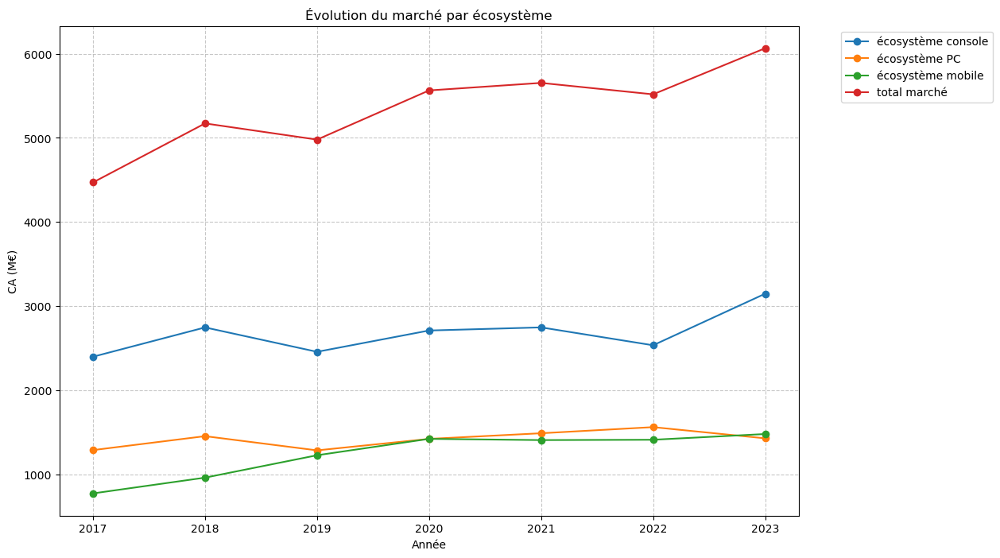

In [17]:
# Données
ecosystemes = df_market_ca_ecosystem["Ecosystème"]
annees = df_market_ca_ecosystem.columns[1:]  # Exclure la colonne "Ecosystème"

# Tracé du graphique
plt.figure(figsize=(12, 8))
for i, ecosysteme in enumerate(ecosystemes):
    plt.plot(annees, df_market_ca_ecosystem.iloc[i, 1:], marker='o',
             label=ecosysteme, color=color_palette[ecosysteme])


plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')  # Légende déportée pour lisibilité
plt.xlabel('Année')
plt.ylabel('CA (M€)')
plt.grid(True, linestyle='--', alpha=0.7)
plt.title("Évolution du marché par écosystème")
plt.show()

#### Tendance

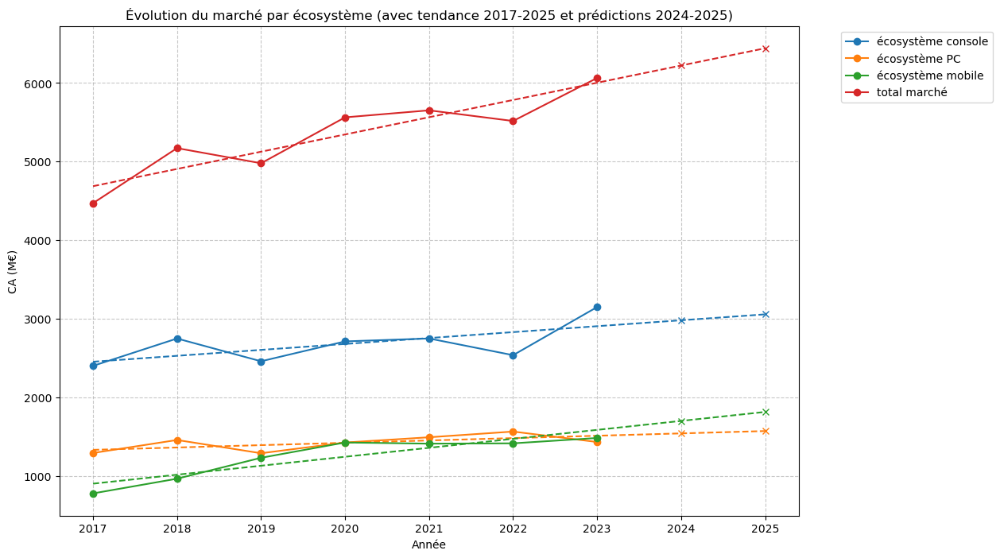

In [19]:
# Extraire les années existantes et les convertir en numériques
annees_existantes = df_market_ca_ecosystem.columns[1:].astype(float).to_numpy().reshape(-1, 1)

# Créer un ensemble d'années de 2017 à 2025 pour la ligne de tendance
annees_tendance = np.arange(2017, 2026).reshape(-1, 1)

# Créer un tableau pour les années futures à prédire (2024 et 2025)
annees_futures = np.array([2024, 2025]).reshape(-1, 1)

# Tracé du graphique
plt.figure(figsize=(12, 8))

for i, ecosysteme in enumerate(df_market_ca_ecosystem["Ecosystème"]):
    # Extraire les données de l'écosystème
    y = df_market_ca_ecosystem.iloc[i, 1:].values
    
    # Modèle de régression linéaire
    model = LinearRegression()
    model.fit(annees_existantes, y)  # Entraîner sur toutes les années passées
    
    # Prédiction pour toutes les années de 2017 à 2025
    y_pred_tendance = model.predict(annees_tendance)
    
    # Prédiction spécifique pour 2024 et 2025
    y_pred_futures = model.predict(annees_futures)
    
    # Tracer les valeurs existantes
    plt.plot(annees_existantes, y, marker='o', label=ecosysteme, color=color_palette[ecosysteme])
    
    # Tracer la ligne de tendance (de 2017 à 2025)
    plt.plot(annees_tendance, y_pred_tendance, marker='', linestyle='dashed', color=color_palette[ecosysteme])
    
    # Tracer les points de prédiction (pour 2024 et 2025)
    plt.plot(annees_futures, y_pred_futures, marker='x', linestyle=' ', color=color_palette[ecosysteme])

# Ajouter la légende et autres éléments
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')  # Légende déportée
plt.xlabel('Année')
plt.ylabel('CA (M€)')
plt.grid(True, linestyle='--', alpha=0.7)
plt.title("Évolution du marché par écosystème (avec tendance 2017-2025 et prédictions 2024-2025)")

plt.show()

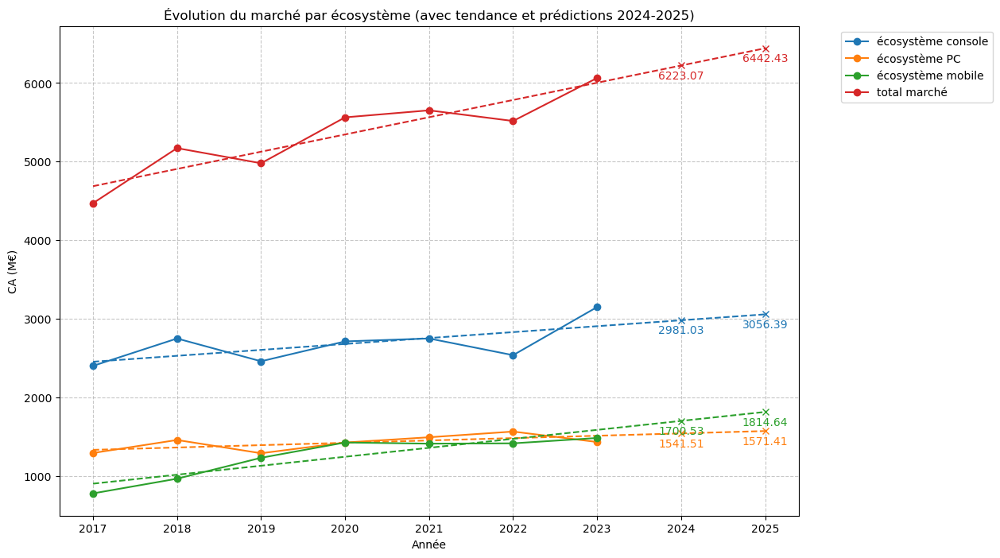

In [20]:

annees_existantes = df_market_ca_ecosystem.columns[1:].astype(float).to_numpy().reshape(-1, 1)

# Créer un ensemble d'années de 2017 à 2025 pour la ligne de tendance
annees_tendance = np.arange(2017, 2026).reshape(-1, 1)

# Créer un tableau pour les années futures à prédire (2024 et 2025)
annees_futures = np.array([2024, 2025]).reshape(-1, 1)

# Tracé du graphique
plt.figure(figsize=(12, 8))

for i, ecosysteme in enumerate(df_market_ca_ecosystem["Ecosystème"]):
    # Extraire les données de l'écosystème
    y = df_market_ca_ecosystem.iloc[i, 1:].values
    
    # Modèle de régression linéaire
    model = LinearRegression()
    model.fit(annees_existantes, y)  # Entraîner sur toutes les années passées
    
    # Prédiction pour toutes les années de 2017 à 2025
    y_pred_tendance = model.predict(annees_tendance)
    
    # Prédiction spécifique pour 2024 et 2025
    y_pred_futures = model.predict(annees_futures)
    
    # Tracer les valeurs existantes
    plt.plot(annees_existantes, y, marker='o', label=ecosysteme, color=color_palette[ecosysteme])
    
    # Tracer la ligne de tendance (de 2017 à 2025)
    plt.plot(annees_tendance, y_pred_tendance, marker='', linestyle='dashed', color=color_palette[ecosysteme])
    
    # Tracer les points de prédiction (pour 2024 et 2025)
    plt.plot(annees_futures, y_pred_futures, marker='x', linestyle=' ', color=color_palette[ecosysteme])

     # Ajouter la valeur de la prédiction pour 2024 et 2025
    for j, annee in enumerate(annees_futures.flatten()):
        plt.text(annee, y_pred_futures[j]-200, f"{y_pred_futures[j]:.2f}", ha='center', va='bottom', color=color_palette[ecosysteme])


# Ajouter la légende et autres éléments
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')  # Légende déportée
plt.xlabel('Année')
plt.ylabel('CA (M€)')
plt.grid(True, linestyle='--', alpha=0.7)
plt.title("Évolution du marché par écosystème (avec tendance et prédictions 2024-2025)")

plt.show()

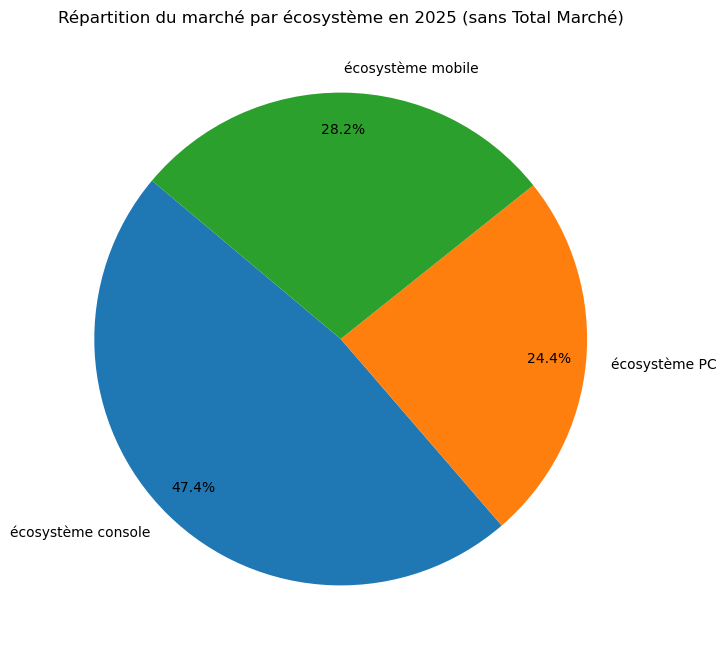

In [21]:
# Initialiser un dictionnaire pour stocker les prédictions des écosystèmes
data_pie_2025 = {}

# Extraire les années existantes
annees_existantes = df_market_ca_ecosystem.columns[1:].astype(float).to_numpy().reshape(-1, 1)

# Prédire les valeurs pour chaque écosystème
for i, ecosysteme in enumerate(df_market_ca_ecosystem["Ecosystème"]):
    if ecosysteme.lower() != "total marché":  # Exclure "Total Marché"
        y = df_market_ca_ecosystem.iloc[i, 1:].values  # Récupérer les données
        model = LinearRegression()
        model.fit(annees_existantes, y)  # Entraîner le modèle
        prediction = model.predict([[2025]])[0]  # Prédire la valeur pour 2025
        data_pie_2025[ecosysteme] = max(0, prediction)  # Assurer que les valeurs soient positives

# Filtrer les écosystèmes représentant moins de 2.5% du total
total_ventes_2025 = sum(data_pie_2025.values())
data_pie_2025 = {eco: val for eco, val in data_pie_2025.items() if (val / total_ventes_2025) * 100 >= 2.5}

# Tracé du camembert avec tailles des parts basées sur les prédictions
plt.figure(figsize=(8, 8))
plt.pie(data_pie_2025.values(), labels=data_pie_2025.keys(), autopct='%1.1f%%', 
        colors=[color_palette[eco] for eco in data_pie_2025.keys()], startangle=140, pctdistance=0.85)
plt.title("Répartition du marché par écosystème en 2025 (sans Total Marché)")
plt.show()

### 1.2 Data CA % Ecoystem

In [23]:
# Extraire les noms des colonnes depuis une ligne d'entêtes
new_column_names = df_market_ecosystem.iloc[14].tolist()
display(new_column_names)

# Sélectionner les données CA
df_market_ca_percent_ecosystem = df_market_ecosystem.iloc[15:19].copy()

[nan, 2017.0, 2018.0, 2019.0, 2020.0, 2021.0, 2022.0, 2023.0]

In [24]:
# Appliquer les nouveaux noms de colonnes
df_market_ca_percent_ecosystem.columns = new_column_names

# Réinitialiser l'index si nécessaire
df_market_ca_percent_ecosystem.reset_index(drop=True, inplace=True)

display(df_market_ca_percent_ecosystem)

,NaN,2017.0,2018.0,2019.0,2020.0,2021.0,2022.0,2023.0
0,écosystème console,53.698844,53.155023,49.390763,48.753639,48.639715,45.99,51.93
1,écosystème PC,28.901031,28.185611,25.886912,25.619682,26.398467,28.37,23.61
2,écosystème mobile,17.400125,18.659366,24.722325,25.626680,24.961818,25.65,24.46
3,total marché,100.000000,100.000000,100.000000,100.000000,100.000000,100.00,100.00


In [25]:
# Définir la colonne 0 comme index
#df_market_ca_percent_ecosystem.set_index(df_market_ca_percent_ecosystem.columns[0], inplace=True)
df_market_ca_percent_ecosystem.columns = ["Ecosystème"] + list(df_market_ca_percent_ecosystem.columns[1:])

# Afficher les premières lignes pour vérifier
print(df_market_ca_percent_ecosystem.head())
df_market_ca_percent_ecosystem.to_excel("market_data.xlsx", index=False, engine="openpyxl")

           Ecosystème      2017.0      2018.0      2019.0      2020.0  \
0  écosystème console   53.698844   53.155023   49.390763   48.753639   
1       écosystème PC   28.901031   28.185611   25.886912   25.619682   
2   écosystème mobile   17.400125   18.659366   24.722325   25.626680   
3        total marché  100.000000  100.000000  100.000000  100.000000   

       2021.0  2022.0  2023.0  
0   48.639715   45.99   51.93  
1   26.398467   28.37   23.61  
2   24.961818   25.65   24.46  
3  100.000000  100.00  100.00  


#### Graphique

<Figure size 1200x800 with 0 Axes>

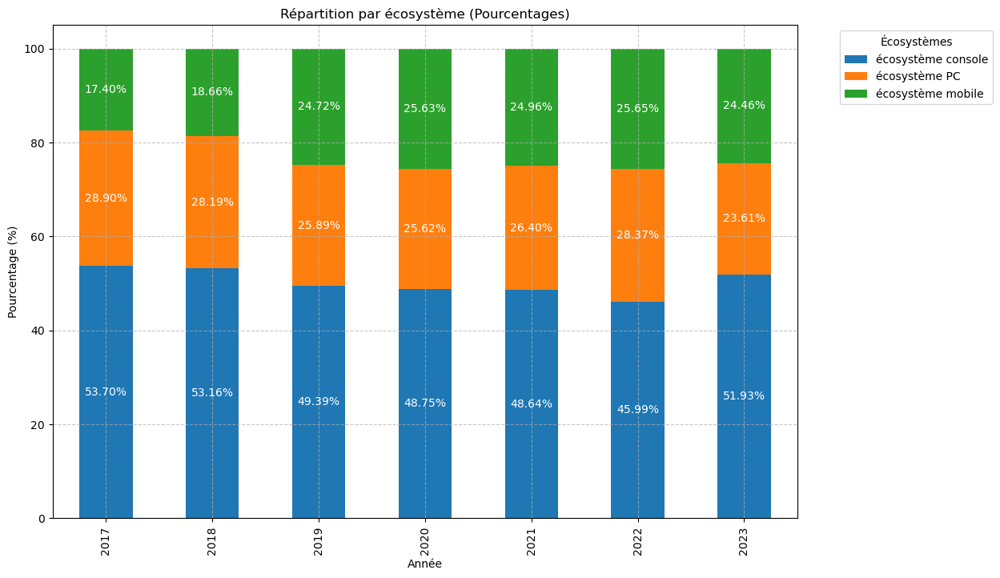

In [27]:
# Exclure la ligne "total marché"
df_market_ca_percent_ecosystem_filtered = df_market_ca_percent_ecosystem[df_market_ca_percent_ecosystem['Ecosystème'] != 'total marché']

# Transposer les données pour avoir les années en index et les écosystèmes comme colonnes
df_market_ca_percent_ecosystem_filtered = df_market_ca_percent_ecosystem_filtered.set_index('Ecosystème').transpose()

# Convertir l'index (les années) en int pour éviter l'affichage en float
df_market_ca_percent_ecosystem_filtered.index = df_market_ca_percent_ecosystem_filtered.index.astype(int)

# Tracé du graphique à barres empilées
plt.figure(figsize=(12, 8))

# Tracer la barre empilée pour chaque année
ax = df_market_ca_percent_ecosystem_filtered.plot(kind='bar', stacked=True, figsize=(12, 8), color=[color_palette[ecosystem] for ecosystem in df_market_ca_percent_ecosystem_filtered.columns])

# Ajouter les pourcentages dans chaque segment de barre
for i in range(len(df_market_ca_percent_ecosystem_filtered)):
    for j, ecosystem in enumerate(df_market_ca_percent_ecosystem_filtered.columns):
        ax.text(i, df_market_ca_percent_ecosystem_filtered.iloc[i, :j+1].sum() - df_market_ca_percent_ecosystem_filtered.iloc[i, j] / 2, 
                f"{df_market_ca_percent_ecosystem_filtered.iloc[i, j]:.2f}%", ha='center', va='center', color='white')

# Ajouter les labels et titre
plt.xlabel('Année')
plt.ylabel('Pourcentage (%)')
plt.title('Répartition par écosystème (Pourcentages)')

# Ajouter la légende
plt.legend(title='Écosystèmes',bbox_to_anchor=(1.05, 1), loc='upper left')  # Légende déportée pour lisibilité

# Afficher le graphique
plt.grid(True, linestyle='--', alpha=0.7)
plt.show()

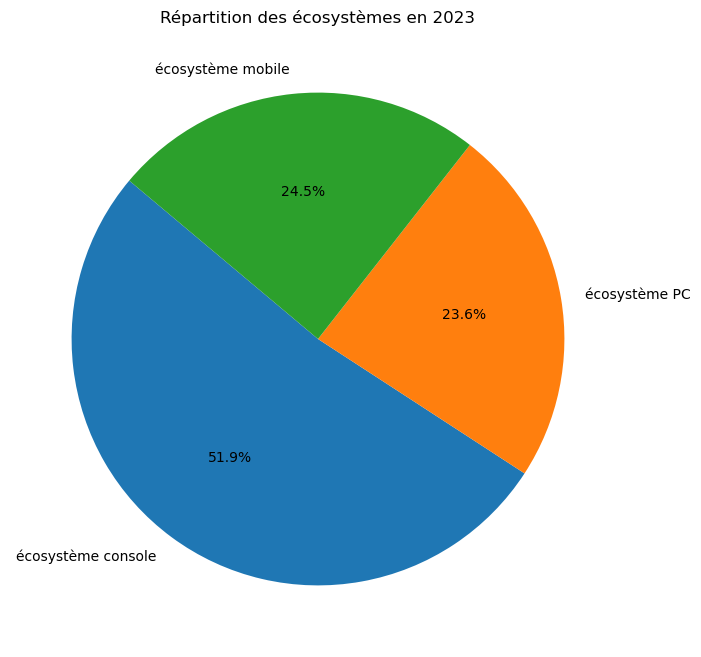

In [28]:
# Récupérer la dernière année disponible
derniere_annee = df_market_ca_percent_ecosystem_filtered.index.max()
data_pie = df_market_ca_percent_ecosystem_filtered.loc[derniere_annee]

# Tracé du camembert
plt.figure(figsize=(8, 8))
plt.pie(data_pie, labels=data_pie.index, autopct='%1.1f%%', colors=[color_palette[ecosystem] for ecosystem in data_pie.index], startangle=140)
plt.title(f"Répartition des écosystèmes en {derniere_annee}")
plt.show()

#### Tendance et Prédiction

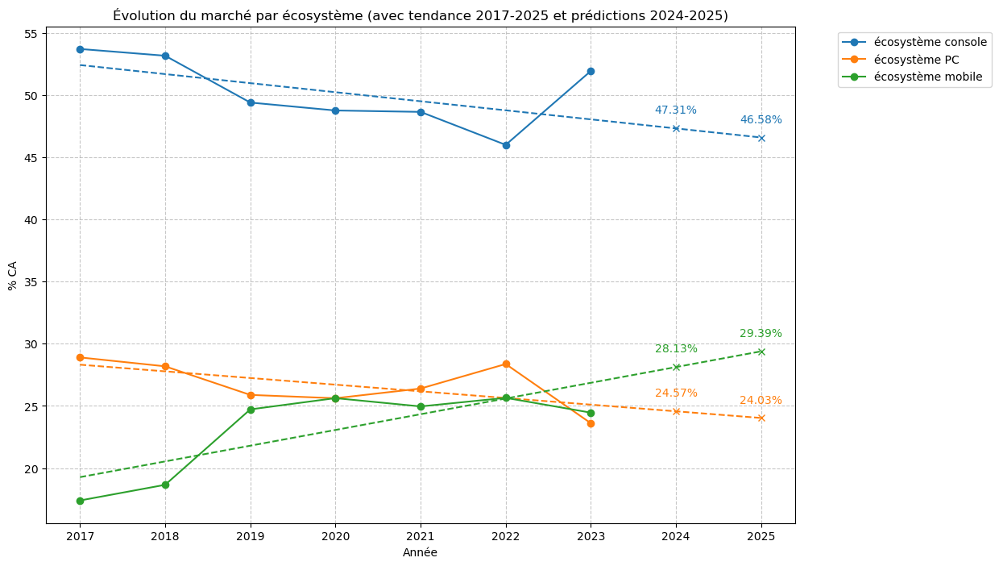

In [30]:
# Extraire les années existantes et les convertir en numériques# Exclure la ligne "total marché"
df_market_ca_percent_ecosystem_filtered = df_market_ca_percent_ecosystem[df_market_ca_percent_ecosystem['Ecosystème'] != 'total marché']

annees_existantes = df_market_ca_percent_ecosystem_filtered.columns[1:].astype(float).to_numpy().reshape(-1, 1)

# Créer un ensemble d'années de 2017 à 2025 pour la ligne de tendance
annees_tendance = np.arange(2017, 2026).reshape(-1, 1)

# Créer un tableau pour les années futures à prédire (2024 et 2025)
annees_futures = np.array([2024, 2025]).reshape(-1, 1)

# Tracé du graphique
plt.figure(figsize=(12, 8))

for i, ecosysteme in enumerate(df_market_ca_percent_ecosystem_filtered["Ecosystème"]):
    # Extraire les données de l'écosystème
    y = df_market_ca_percent_ecosystem_filtered.iloc[i, 1:].values
    
    # Modèle de régression linéaire
    model = LinearRegression()
    model.fit(annees_existantes, y)  # Entraîner sur toutes les années passées
    
    # Prédiction pour toutes les années de 2017 à 2025
    y_pred_tendance = model.predict(annees_tendance)
    
    # Prédiction spécifique pour 2024 et 2025
    y_pred_futures = model.predict(annees_futures)
    
    # Tracer les valeurs existantes
    plt.plot(annees_existantes, y, marker='o', label=ecosysteme, color=color_palette[ecosysteme])
    
    # Tracer la ligne de tendance (de 2017 à 2025)
    plt.plot(annees_tendance, y_pred_tendance, marker='', linestyle='dashed', color=color_palette[ecosysteme])
    
    # Tracer les points de prédiction (pour 2024 et 2025)
    plt.plot(annees_futures, y_pred_futures, marker='x', linestyle=' ', color=color_palette[ecosysteme])

     # Ajouter la valeur de la prédiction pour 2024 et 2025
    for j, annee in enumerate(annees_futures.flatten()):
        plt.text(annee, y_pred_futures[j]+1, f"{y_pred_futures[j]:.2f}%", ha='center', va='bottom', color=color_palette[ecosysteme])


# Ajouter la légende et autres éléments
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')  # Légende déportée
plt.xlabel('Année')
plt.ylabel('% CA')
plt.grid(True, linestyle='--', alpha=0.7)
plt.title("Évolution du marché par écosystème (avec tendance 2017-2025 et prédictions 2024-2025)")

plt.show()

## 2. Data Logiciel

In [32]:
# Accéder à une feuille spécifique
df_market_software = market_dict["logiciel"]
display(df_market_software) 

,Unnamed: 0,Unnamed: 1,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7
0,"Retour au menu ""Marché du jeu vidéo""",NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Marché des jeux vidéo selon les supports de le...,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Chiffre d’affaires du marché des jeux vidéo se...,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,NaN,2017.000000,2018.000000,2019.000000,2020.000000,2021.000000,2022.0,2023.0
7,jeux pour console,1345.000000,1694.000000,1604.412741,1759.326671,1657.424729,1633.0,1748.0
8,jeux pour PC,487.000000,636.000000,500.827617,491.456232,338.373000,473.0,500.8
9,jeux mobiles,778.000000,965.000000,1231.000000,1425.697227,1411.000000,1415.0,1483.0


### 2.1 CA Logiciel

In [34]:
# Extraire les noms des colonnes depuis une ligne d'entêtes
new_column_names = df_market_software.iloc[6].tolist()
display(new_column_names)

# Sélectionner les données CA
df_market_ca_software = df_market_software.iloc[7:11].copy()

[nan, 2017.0, 2018.0, 2019.0, 2020.0, 2021.0, 2022.0, 2023.0]

In [35]:
# Appliquer les nouveaux noms de colonnes
df_market_ca_software.columns = new_column_names

# Réinitialiser l'index si nécessaire
df_market_ca_software.reset_index(drop=True, inplace=True)

display(df_market_ca_software)

,NaN,2017.0,2018.0,2019.0,2020.0,2021.0,2022.0,2023.0
0,jeux pour console,1345.0,1694.0,1604.412741,1759.326671,1657.424729,1633.0,1748.0
1,jeux pour PC,487.0,636.0,500.827617,491.456232,338.373000,473.0,500.8
2,jeux mobiles,778.0,965.0,1231.000000,1425.697227,1411.000000,1415.0,1483.0
3,ensemble des jeux,2610.0,3295.0,3336.240358,3676.480130,3406.797729,3521.0,3731.8


In [36]:
# Définir la colonne 0 comme index
#df_market_ca_software.set_index(df_market_ca_software.columns[0], inplace=True)
df_market_ca_software.columns = ["Genre"] + list(df_market_ca_software.columns[1:])

# Afficher les premières lignes pour vérifier
print(df_market_ca_software.head())

               Genre  2017.0  2018.0       2019.0       2020.0       2021.0  \
0  jeux pour console  1345.0  1694.0  1604.412741  1759.326671  1657.424729   
1       jeux pour PC   487.0   636.0   500.827617   491.456232   338.373000   
2       jeux mobiles   778.0   965.0  1231.000000  1425.697227  1411.000000   
3  ensemble des jeux  2610.0  3295.0  3336.240358  3676.480130  3406.797729   

   2022.0  2023.0  
0  1633.0  1748.0  
1   473.0   500.8  
2  1415.0  1483.0  
3  3521.0  3731.8  


#### Graphique

In [38]:
# Définition des couleurs
color_palette = {
    "jeux pour console": "#1f77b4",  # Bleu
    "jeux pour PC": "#ff7f0e",       # Orange
    "jeux mobiles": "#2ca02c",   # Vert
    "ensemble des jeux": "#d62728"         # Rouge
}


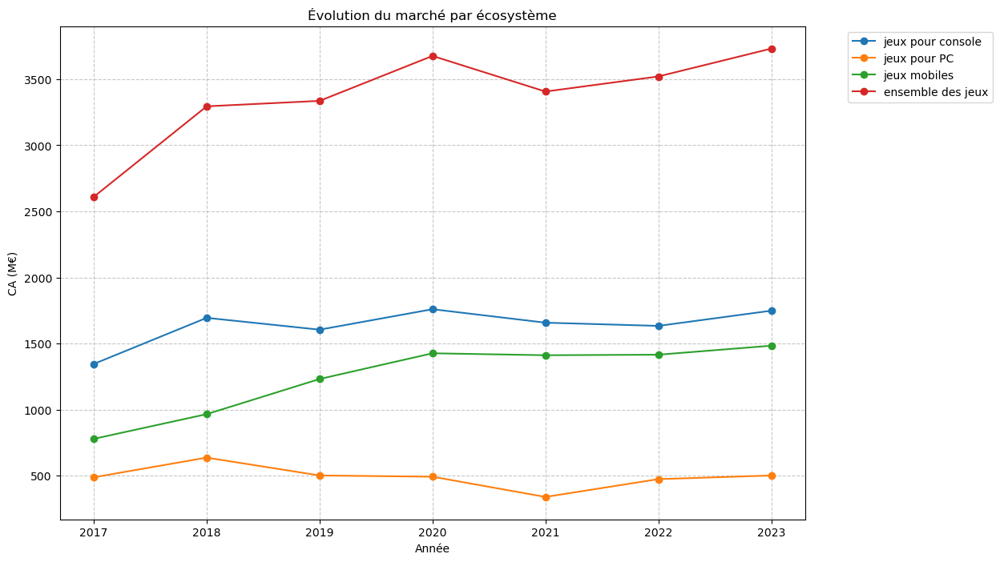

In [39]:
# Données
genres = df_market_ca_software["Genre"]
annees = df_market_ca_software.columns[1:]  # Exclure la colonne Genre  

# Tracé du graphique
plt.figure(figsize=(12, 8))
for i, genre in enumerate(genres):
    plt.plot(annees, df_market_ca_software.iloc[i, 1:], marker='o',
             label=genre, color=color_palette[genre])

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')  # Légende déportée pour lisibilité
plt.xlabel('Année')
plt.ylabel('CA (M€)')
plt.grid(True, linestyle='--', alpha=0.7)
plt.title("Évolution du marché par écosystème")
plt.show()

#### Tendance

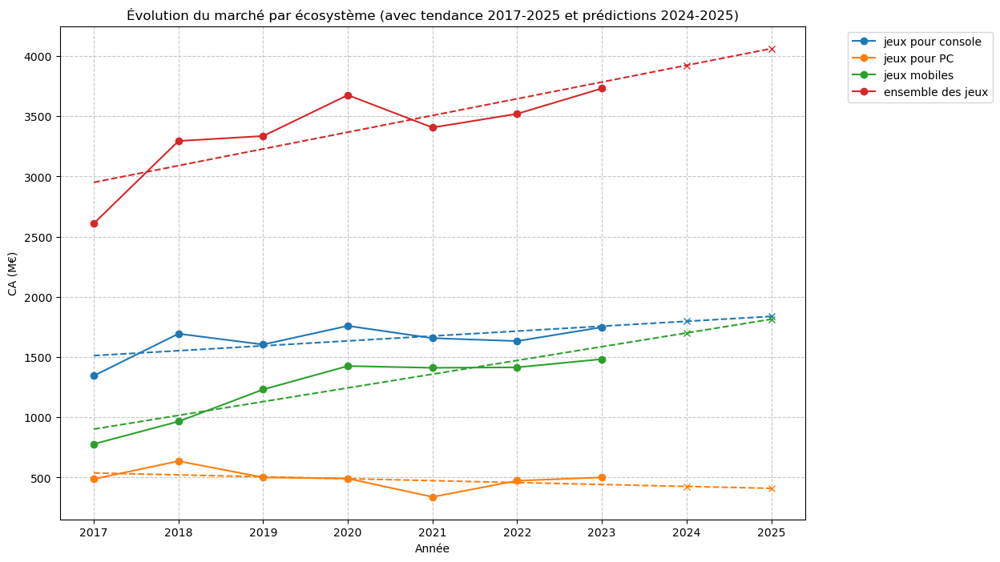

In [41]:
# Extraire les années existantes et les convertir en numériques
annees_existantes = df_market_ca_software.columns[1:].astype(float).to_numpy().reshape(-1, 1)

# Créer un ensemble d'années de 2017 à 2025 pour la ligne de tendance
annees_tendance = np.arange(2017, 2026).reshape(-1, 1)

# Créer un tableau pour les années futures à prédire (2024 et 2025)
annees_futures = np.array([2024, 2025]).reshape(-1, 1)

# Tracé du graphique
plt.figure(figsize=(12, 8))

for i, genre in enumerate(df_market_ca_software["Genre"]):
    # Extraire les données de l'écosystème
    y = df_market_ca_software.iloc[i, 1:].values
    
    # Modèle de régression linéaire
    model = LinearRegression()
    model.fit(annees_existantes, y)  # Entraîner sur toutes les années passées
    
    # Prédiction pour toutes les années de 2017 à 2025
    y_pred_tendance = model.predict(annees_tendance)
    
    # Prédiction spécifique pour 2024 et 2025
    y_pred_futures = model.predict(annees_futures)
    
    # Tracer les valeurs existantes
    plt.plot(annees_existantes, y, marker='o', label=genre, color=color_palette[genre])
    
    # Tracer la ligne de tendance (de 2017 à 2025)
    plt.plot(annees_tendance, y_pred_tendance, marker='', linestyle='dashed', color=color_palette[genre])
    
    # Tracer les points de prédiction (pour 2024 et 2025)
    plt.plot(annees_futures, y_pred_futures, marker='x', linestyle=' ', color=color_palette[genre])

# Ajouter la légende et autres éléments
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')  # Légende déportée
plt.xlabel('Année')
plt.ylabel('CA (M€)')
plt.grid(True, linestyle='--', alpha=0.7)
plt.title("Évolution du marché par écosystème (avec tendance 2017-2025 et prédictions 2024-2025)")

plt.show()

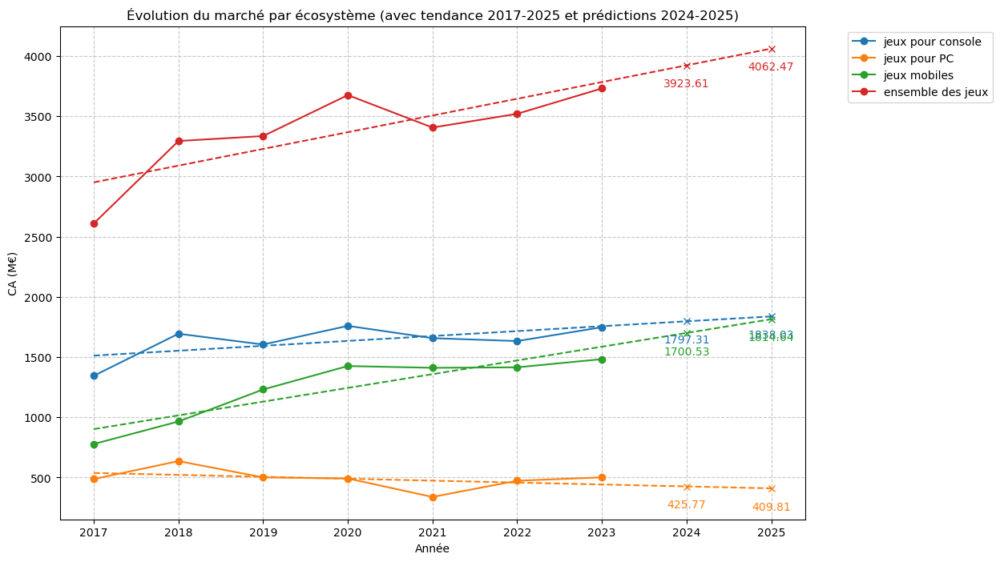

In [42]:

annees_existantes = df_market_ca_software.columns[1:].astype(float).to_numpy().reshape(-1, 1)

# Créer un ensemble d'années de 2017 à 2025 pour la ligne de tendance
annees_tendance = np.arange(2017, 2026).reshape(-1, 1)

# Créer un tableau pour les années futures à prédire (2024 et 2025)
annees_futures = np.array([2024, 2025]).reshape(-1, 1)

# Tracé du graphique
plt.figure(figsize=(12, 8))

for i, genre in enumerate(df_market_ca_software["Genre"]):
    # Extraire les données de l'écosystème
    y = df_market_ca_software.iloc[i, 1:].values
    
    # Modèle de régression linéaire
    model = LinearRegression()
    model.fit(annees_existantes, y)  # Entraîner sur toutes les années passées
    
    # Prédiction pour toutes les années de 2017 à 2025
    y_pred_tendance = model.predict(annees_tendance)
    
    # Prédiction spécifique pour 2024 et 2025
    y_pred_futures = model.predict(annees_futures)
    
    # Tracer les valeurs existantes
    plt.plot(annees_existantes, y, marker='o', label=genre, color=color_palette[genre])
    
    # Tracer la ligne de tendance (de 2017 à 2025)
    plt.plot(annees_tendance, y_pred_tendance, marker='', linestyle='dashed', color=color_palette[genre])
    
    # Tracer les points de prédiction (pour 2024 et 2025)
    plt.plot(annees_futures, y_pred_futures, marker='x', linestyle=' ', color=color_palette[genre])

     # Ajouter la valeur de la prédiction pour 2024 et 2025
    for j, annee in enumerate(annees_futures.flatten()):
        plt.text(annee, y_pred_futures[j]-200, f"{y_pred_futures[j]:.2f}", ha='center', va='bottom', color=color_palette[genre])


# Ajouter la légende et autres éléments
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')  # Légende déportée
plt.xlabel('Année')
plt.ylabel('CA (M€)')
plt.grid(True, linestyle='--', alpha=0.7)
plt.title("Évolution du marché par écosystème (avec tendance 2017-2025 et prédictions 2024-2025)")

plt.show()

### 2.2 % CA Logiciel

In [44]:
# Extraire les noms des colonnes depuis une ligne d'entêtes
new_column_names = df_market_software.iloc[14].tolist()
display(new_column_names)

# Sélectionner les données CA
df_market_ca_percent_software = df_market_software.iloc[15:19].copy()

[nan, 2017.0, 2018.0, 2019.0, 2020.0, 2021.0, 2022.0, 2023.0]

In [45]:
# Appliquer les nouveaux noms de colonnes
df_market_ca_percent_software.columns = new_column_names

# Réinitialiser l'index si nécessaire
df_market_ca_percent_software.reset_index(drop=True, inplace=True)

display(df_market_ca_percent_software)

,NaN,2017.0,2018.0,2019.0,2020.0,2021.0,2022.0,2023.0
0,jeux pour console,51.532567,51.411229,48.090442,47.853561,48.650518,46.4,46.8
1,jeux pour PC,18.659004,19.301973,15.011737,13.367575,9.932289,13.4,13.4
2,jeux mobiles,29.808429,29.286798,36.897821,38.778864,41.417193,40.2,39.7
3,ensemble des jeux,100.000000,99.999749,99.999743,99.999715,100.000000,100.0,99.9


In [46]:
# Définir la colonne 0 comme index
#df_market_ca_percent_software.set_index(df_market_ca_percent_software.columns[0], inplace=True)
df_market_ca_percent_software.columns = ["Genre"] + list(df_market_ca_percent_software.columns[1:])

# Afficher les premières lignes pour vérifier
print(df_market_ca_percent_software.head())

               Genre      2017.0     2018.0     2019.0     2020.0      2021.0  \
0  jeux pour console   51.532567  51.411229  48.090442  47.853561   48.650518   
1       jeux pour PC   18.659004  19.301973  15.011737  13.367575    9.932289   
2       jeux mobiles   29.808429  29.286798  36.897821  38.778864   41.417193   
3  ensemble des jeux  100.000000  99.999749  99.999743  99.999715  100.000000   

   2022.0  2023.0  
0    46.4    46.8  
1    13.4    13.4  
2    40.2    39.7  
3   100.0    99.9  


#### Graphique

<Figure size 1200x800 with 0 Axes>

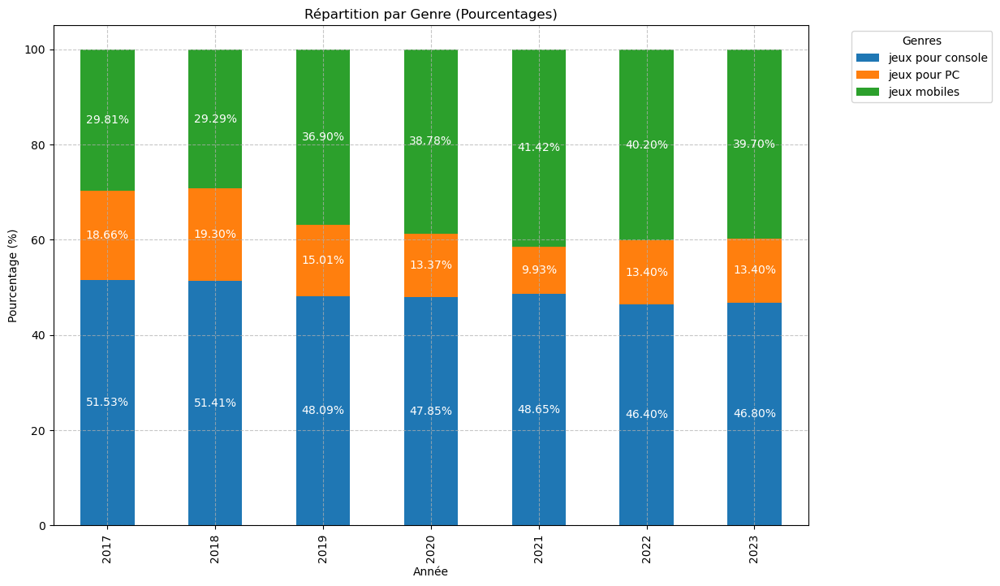

In [48]:
# Exclure la ligne "ensemble des jeux"
df_market_ca_percent_software_filtered = df_market_ca_percent_software[df_market_ca_percent_software['Genre'] != "ensemble des jeux"]

# Transposer les données pour avoir les années en index et les écosystèmes comme colonnes
df_market_ca_percent_software_filtered = df_market_ca_percent_software_filtered.set_index('Genre').transpose()

# Convertir l'index (les années) en int pour éviter l'affichage en float
df_market_ca_percent_software_filtered.index = df_market_ca_percent_software_filtered.index.astype(int)

# Tracé du graphique à barres empilées
plt.figure(figsize=(12, 8))

# Tracer la barre empilée pour chaque année
ax = df_market_ca_percent_software_filtered.plot(kind='bar', stacked=True, figsize=(12, 8), color=[color_palette[genre] for genre in df_market_ca_percent_software_filtered.columns])

# Ajouter les pourcentages dans chaque segment de barre
for i in range(len(df_market_ca_percent_software_filtered)):
    for j, ecosystem in enumerate(df_market_ca_percent_software_filtered.columns):
        ax.text(i, df_market_ca_percent_software_filtered.iloc[i, :j+1].sum() - df_market_ca_percent_software_filtered.iloc[i, j] / 2, 
                f"{df_market_ca_percent_software_filtered.iloc[i, j]:.2f}%", ha='center', va='center', color='white')

# Ajouter les labels et titre
plt.xlabel('Année')
plt.ylabel('Pourcentage (%)')
plt.title('Répartition par Genre (Pourcentages)')

# Ajouter la légende
plt.legend(title='Genres',bbox_to_anchor=(1.05, 1), loc='upper left')  # Légende déportée pour lisibilité

# Afficher le graphique
plt.grid(True, linestyle='--', alpha=0.7)
plt.show()

## 3. Data GenreConsole

In [50]:
# Accéder à une feuille spécifique
df_market_console = market_dict["genreConsole"]
print(df_market_console.head(50)) 

                                           Unnamed: 0    Unnamed: 1  \
0                Retour au menu "Marché du jeu vidéo"           NaN   
1                                                 NaN           NaN   
2          Marché du jeu vidéo console selon le genre           NaN   
3                                                 NaN           NaN   
4   Le marché des jeux vidéo console selon le genr...           NaN   
5                                                 NaN           NaN   
6                                                 NaN  2.017000e+03   
7                                              action  5.249050e+06   
8                                               sport  2.788724e+06   
9                                            aventure  2.224095e+06   
10                                     jeu de tir/FPS  4.539577e+06   
11                                        jeu de rôle  2.714332e+06   
12                                             course  1.998898e+06   
13    

### 3.1 Ventes de Jeux pour les Consoles

In [52]:
# titre
title = df_market_console.iloc[4,0]
print(title)

Le marché des jeux vidéo console selon le genre (milliers d’unités)


In [53]:
# Extraire les noms des colonnes depuis une ligne d'entêtes
new_column_names = df_market_console.iloc[6].tolist()
display(new_column_names)

# Sélectionner les données CA
df_market_console_vente = df_market_console.iloc[7:22].copy()

[nan, 2017.0, 2018.0, 2019.0, 2020.0, 2021.0, nan, nan]

In [54]:
# Appliquer les nouveaux noms de colonnes
df_market_console_vente.columns = new_column_names

# Réinitialiser l'index si nécessaire
df_market_console_vente.reset_index(drop=True, inplace=True)

display(df_market_console_vente)

,NaN,2017.0,2018.0,2019.0,2020.0,2021.0,NaN,NaN
0,action,5249050.11,6275082.50,5084765.00,6465126.50,5495763.88,NaN,NaN
1,sport,2788723.96,2941826.18,2834431.45,3406322.58,3268922.97,NaN,NaN
2,aventure,2224095.01,2060020.39,2615064.63,2789960.49,2262907.90,NaN,NaN
3,jeu de tir/FPS,4539577.11,3351596.52,3144100.43,2666668.66,2387365.87,NaN,NaN
4,jeu de rôle,2714332.17,2195081.57,2470529.76,2513713.01,2498135.74,NaN,NaN
5,course,1998898.28,1708523.82,2055817.08,2054323.38,1936814.24,NaN,NaN
6,stratégie/RTS,901894.14,776372.87,746933.28,1966802.17,1352558.48,NaN,NaN
7,famille,761369.48,1056157.23,937022.94,1238322.50,1241495.11,NaN,NaN
8,combat,995595.64,1385766.44,1159709.67,1134279.32,1010337.11,NaN,NaN
9,jeu casual,212353.46,231488.58,295789.01,384521.07,329347.32,NaN,NaN


In [55]:
# Définir la colonne 0 comme index
#df_market_console_vente.set_index(df_market_console_vente.columns[0], inplace=True)
df_market_console_vente = df_market_console_vente.iloc[:,0:6]
df_market_console_vente.columns = ["Genre"] + list(df_market_console_vente.columns[1:])

# Afficher les premières lignes pour vérifier
print(df_market_console_vente.head())

            Genre      2017.0      2018.0      2019.0      2020.0      2021.0
0          action  5249050.11  6275082.50  5084765.00  6465126.50  5495763.88
1           sport  2788723.96  2941826.18  2834431.45  3406322.58  3268922.97
2        aventure  2224095.01  2060020.39  2615064.63  2789960.49  2262907.90
3  jeu de tir/FPS  4539577.11  3351596.52  3144100.43  2666668.66  2387365.87
4     jeu de rôle  2714332.17  2195081.57  2470529.76  2513713.01  2498135.74


In [56]:
df_market_console_vente.sort_values(by="Genre",ascending=False)
df_market_console_vente.reset_index(drop=True, inplace=True)
display(df_market_console_vente)

,Genre,2017.0,2018.0,2019.0,2020.0,2021.0
0,action,5249050.11,6275082.50,5084765.00,6465126.50,5495763.88
1,sport,2788723.96,2941826.18,2834431.45,3406322.58,3268922.97
2,aventure,2224095.01,2060020.39,2615064.63,2789960.49,2262907.90
3,jeu de tir/FPS,4539577.11,3351596.52,3144100.43,2666668.66,2387365.87
4,jeu de rôle,2714332.17,2195081.57,2470529.76,2513713.01,2498135.74
5,course,1998898.28,1708523.82,2055817.08,2054323.38,1936814.24
6,stratégie/RTS,901894.14,776372.87,746933.28,1966802.17,1352558.48
7,famille,761369.48,1056157.23,937022.94,1238322.50,1241495.11
8,combat,995595.64,1385766.44,1159709.67,1134279.32,1010337.11
9,jeu casual,212353.46,231488.58,295789.01,384521.07,329347.32


#### Graphique

In [58]:
color_palette = {
    "action": "#1f77b4",        # Bleu
    "sport": "#ff7f0e",         # Orange
    "aventure": "#2ca02c",      # Vert
    "jeu de tir/FPS": "#d62728",# Rouge
    "jeu de rôle": "#9467bd",   # Violet
    "course": "#8c564b",        # Marron
    "stratégie/RTS": "#e377c2", # Rose
    "famille": "#7f7f7f",       # Gris
    "combat": "#bcbd22",        # Jaune-Vert
    "jeu casual": "#17becf",    # Cyan
    "simulation aérienne": "#aec7e8", # Bleu clair
    "autres": "#ffbb78",        # Orange clair
    "arcade": "#98df8a",        # Vert clair
    "enfant": "#c5b0d5",        # Lavande
}

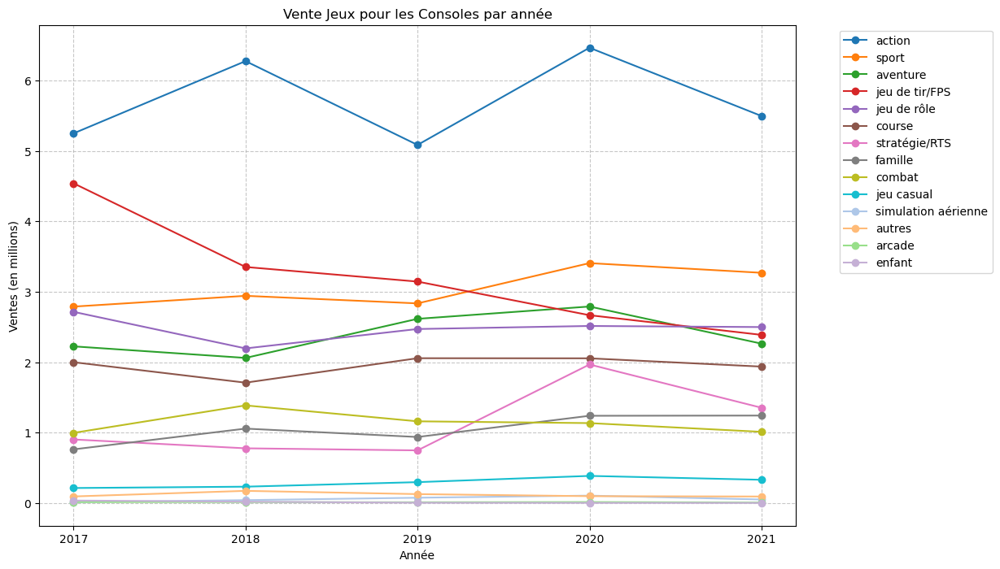

In [59]:
# Suppression des NaN
df_market_console_vente_filtered = df_market_console_vente.dropna()

# Extraire les genres et les années
genres = df_market_console_vente_filtered["Genre"]
annees = df_market_console_vente_filtered.columns[1:].astype(int).astype(str)  # Exclure la colonne "Genre"

# Convertir uniquement les colonnes numériques en millions
df_market_console_vente_filtered.iloc[:, 1:] = df_market_console_vente_filtered.iloc[:, 1:].astype(float) / 1_000_000

# Tracé du graphique
plt.figure(figsize=(12, 8))
for i, genre in enumerate(genres):
    plt.plot(annees, df_market_console_vente_filtered.iloc[i, 1:], marker='o',
             label=genre, color=color_palette.get(genre, "#000000"))  # Couleur par défaut en noir si non trouvée

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')  # Légende déportée pour lisibilité
plt.xlabel('Année')
plt.ylabel('Ventes (en millions)')
plt.grid(True, linestyle='--', alpha=0.7)
plt.title("Vente Jeux pour les Consoles par année")
plt.show()

### 3.2 CA Jeux pour les Consoles

In [61]:
# titre
title = df_market_console.iloc[24,0]
print(title)

Chiffre d’affaires du marché des jeux vidéo console selon le genre (M€)


In [62]:
# Extraire les noms des colonnes depuis une ligne d'entêtes
#new_column_names = df_market_console.iloc[6].tolist()
print(df_market_console.head(50))

# Sélectionner les données CA
df_market_console_ca = df_market_console.iloc[27:41].copy()

                                           Unnamed: 0    Unnamed: 1  \
0                Retour au menu "Marché du jeu vidéo"           NaN   
1                                                 NaN           NaN   
2          Marché du jeu vidéo console selon le genre           NaN   
3                                                 NaN           NaN   
4   Le marché des jeux vidéo console selon le genr...           NaN   
5                                                 NaN           NaN   
6                                                 NaN  2.017000e+03   
7                                              action  5.249050e+06   
8                                               sport  2.788724e+06   
9                                            aventure  2.224095e+06   
10                                     jeu de tir/FPS  4.539577e+06   
11                                        jeu de rôle  2.714332e+06   
12                                             course  1.998898e+06   
13    

In [63]:
# Extraire les noms des colonnes depuis une ligne d'entêtes
new_column_names = df_market_console.iloc[26].tolist()
display(new_column_names)


[' ', 2017.0, 2018.0, 2019.0, 2020.0, 2021.0, 2022.0, 2023.0]

In [64]:
# Appliquer les nouveaux noms de colonnes
df_market_console_ca.columns = new_column_names

# Réinitialiser l'index si nécessaire
df_market_console_ca.reset_index(drop=True, inplace=True)

display(df_market_console_ca)

,,2017.0,2018.0,2019.0,2020.0,2021.0,2022.0,2023.0
0,action,192.4,269.3,184.4,236.2,190.2,180.5,191.4
1,sport,142.7,145.5,141.0,154.9,162.6,182.8,156.5
2,jeu de rôle,110.5,92.4,99.2,105.4,102.4,159.1,80.6
3,jeu de tir/FPS,214.4,148.4,140.8,104.8,107.7,106.2,84.4
4,aventure,85.5,71.6,102.6,103.2,77.1,61.0,232.4
5,stratégie/RTS,31.9,26.0,23.6,79.9,48.7,38.3,36.5
6,course,90.5,74.1,79.5,72.7,71.4,84.5,72.1
7,famille,26.8,45.5,39.3,47.2,50.3,33.4,26.5
8,combat,40.8,66.6,47.9,32.8,27.1,21.4,31.1
9,jeu casual,5.4,6.4,7.1,8.2,7.2,5.8,3.0


In [65]:
# Définir la colonne 0 comme index
#df_market_console_ca.set_index(df_market_console_ca.columns[0], inplace=True)
df_market_console_ca.columns = ["Genre"] + list(df_market_console_ca.columns[1:])

# Afficher les premières lignes pour vérifier
print(df_market_console_ca.head())

            Genre  2017.0  2018.0  2019.0  2020.0  2021.0  2022.0  2023.0
0          action   192.4   269.3   184.4   236.2   190.2   180.5   191.4
1           sport   142.7   145.5   141.0   154.9   162.6   182.8   156.5
2     jeu de rôle   110.5    92.4    99.2   105.4   102.4   159.1    80.6
3  jeu de tir/FPS   214.4   148.4   140.8   104.8   107.7   106.2    84.4
4        aventure    85.5    71.6   102.6   103.2    77.1    61.0   232.4


In [66]:
df_market_console_ca_filtered = df_market_console_ca
display(df_market_console_ca_filtered)

,Genre,2017.0,2018.0,2019.0,2020.0,2021.0,2022.0,2023.0
0,action,192.4,269.3,184.4,236.2,190.2,180.5,191.4
1,sport,142.7,145.5,141.0,154.9,162.6,182.8,156.5
2,jeu de rôle,110.5,92.4,99.2,105.4,102.4,159.1,80.6
3,jeu de tir/FPS,214.4,148.4,140.8,104.8,107.7,106.2,84.4
4,aventure,85.5,71.6,102.6,103.2,77.1,61.0,232.4
5,stratégie/RTS,31.9,26.0,23.6,79.9,48.7,38.3,36.5
6,course,90.5,74.1,79.5,72.7,71.4,84.5,72.1
7,famille,26.8,45.5,39.3,47.2,50.3,33.4,26.5
8,combat,40.8,66.6,47.9,32.8,27.1,21.4,31.1
9,jeu casual,5.4,6.4,7.1,8.2,7.2,5.8,3.0


#### Graphique

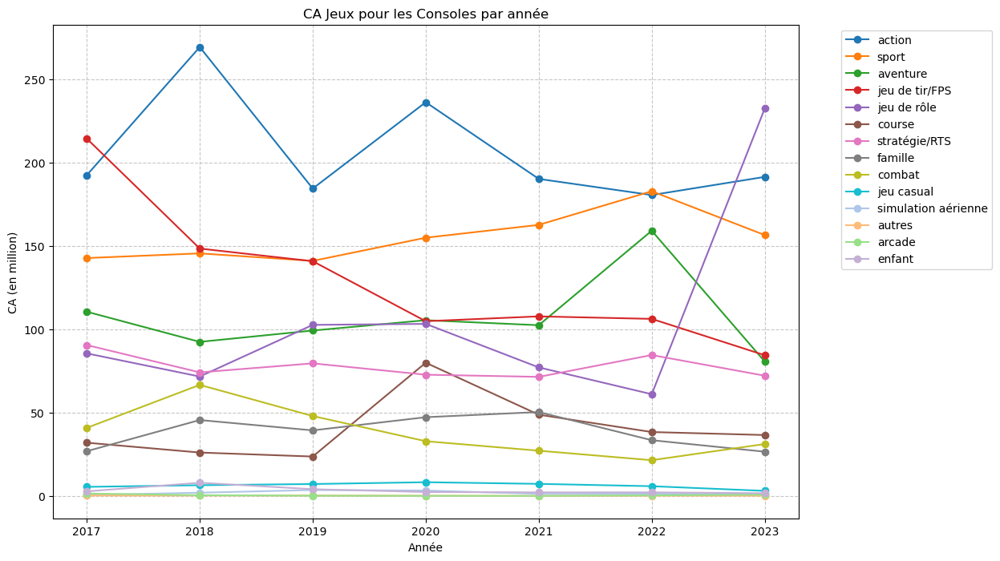

In [68]:
# Extraire les genres et les années
genres = df_market_console_vente_filtered["Genre"]
annees = df_market_console_ca_filtered.columns[1:].astype(int).astype(str)  # Exclure la colonne "Genre"

# Tracé du graphique
plt.figure(figsize=(12, 8))
for i, genre in enumerate(genres):
    plt.plot(annees, df_market_console_ca_filtered.iloc[i, 1:], marker='o',
             label=genre, color=color_palette.get(genre, "#000000"))  # Couleur par défaut en noir si non trouvée

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')  # Légende déportée pour lisibilité
plt.xlabel('Année')
plt.ylabel('CA (en million)')
plt.grid(True, linestyle='--', alpha=0.7)
plt.title("CA Jeux pour les Consoles par année")
plt.show()

### 3.3 Part de Marché des Jeux pour les Consoles

In [70]:
# titre
title = df_market_console.iloc[43,0]
print(title)

Parts de marché des jeux vidéo console selon le genre (%)


In [71]:
df_market_console.tail(50)

,Unnamed: 0,Unnamed: 1,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7
32,stratégie/RTS,31.900000,26.000000,23.600000,79.900000,48.700000,38.3,36.5
33,course,90.500000,74.100000,79.500000,72.700000,71.400000,84.5,72.1
34,famille,26.800000,45.500000,39.300000,47.200000,50.300000,33.4,26.5
35,combat,40.800000,66.600000,47.900000,32.800000,27.100000,21.4,31.1
36,jeu casual,5.400000,6.400000,7.100000,8.200000,7.200000,5.8,3.0
37,simulation aérienne,0.500000,1.900000,3.500000,3.200000,1.200000,1.3,0.9
38,arcade,0.200000,0.200000,0.200000,0.100000,0.000000,0.1,0.1
39,enfant,1.400000,0.400000,0.100000,0.000000,0.000000,0.3,0.7
40,autres,2.700000,7.900000,4.000000,2.300000,2.100000,2.1,1.6
41,ensemble des jeux,948.100000,957.000000,873.700000,951.400000,848.400000,876.8,917.8


In [72]:
# Sélectionner les données CA
df_market_console_percent = df_market_console.iloc[46:60].copy()

In [73]:
# Extraire les noms des colonnes depuis une ligne d'entêtes
new_column_names = df_market_console.iloc[45].tolist()
display(new_column_names)

[nan, 2017.0, 2018.0, 2019.0, 2020.0, 2021.0, nan, nan]

In [74]:
# Appliquer les nouveaux noms de colonnes
df_market_console_percent.columns = new_column_names

# Réinitialiser l'index si nécessaire
df_market_console_percent.reset_index(drop=True, inplace=True)

display(df_market_console_percent)

,NaN,2017.0,2018.0,2019.0,2020.0,2021.0,NaN,NaN
0,action,20.293218,28.140021,21.105643,24.826571,22.418670,NaN,NaN
1,sport,15.051155,15.203762,16.138263,16.281270,19.165488,NaN,NaN
2,jeu de rôle,11.654889,9.655172,11.354012,11.078411,12.069778,NaN,NaN
3,jeu de tir/FPS,22.613648,15.506792,16.115371,11.015346,12.694484,NaN,NaN
4,aventure,9.018036,7.481714,11.743161,10.847173,9.087694,NaN,NaN
5,stratégie/RTS,3.364624,2.716823,2.701156,8.398150,5.740217,NaN,NaN
6,course,9.545407,7.742947,9.099233,7.641371,8.415842,NaN,NaN
7,famille,2.826706,4.754441,4.498111,4.961110,5.928807,NaN,NaN
8,combat,4.303344,6.959248,5.482431,3.447551,3.194248,NaN,NaN
9,jeu casual,0.569560,0.668757,0.812636,0.861888,0.848656,NaN,NaN


In [75]:
# Définir la colonne 0 comme index
#df_market_console_percent.set_index(df_market_console_percent.columns[0], inplace=True)
df_market_console_percent = df_market_console_percent.iloc[:,0:6]
df_market_console_percent.columns = ["Genre"] + list(df_market_console_percent.columns[1:])


# Afficher les premières lignes pour vérifier
print(df_market_console_percent.head())

            Genre     2017.0     2018.0     2019.0     2020.0     2021.0
0          action  20.293218  28.140021  21.105643  24.826571  22.418670
1           sport  15.051155  15.203762  16.138263  16.281270  19.165488
2     jeu de rôle  11.654889   9.655172  11.354012  11.078411  12.069778
3  jeu de tir/FPS  22.613648  15.506792  16.115371  11.015346  12.694484
4        aventure   9.018036   7.481714  11.743161  10.847173   9.087694


In [76]:
df_market_console_percent_filtered = df_market_console_percent
display(df_market_console_percent_filtered)

,Genre,2017.0,2018.0,2019.0,2020.0,2021.0
0,action,20.293218,28.140021,21.105643,24.826571,22.418670
1,sport,15.051155,15.203762,16.138263,16.281270,19.165488
2,jeu de rôle,11.654889,9.655172,11.354012,11.078411,12.069778
3,jeu de tir/FPS,22.613648,15.506792,16.115371,11.015346,12.694484
4,aventure,9.018036,7.481714,11.743161,10.847173,9.087694
5,stratégie/RTS,3.364624,2.716823,2.701156,8.398150,5.740217
6,course,9.545407,7.742947,9.099233,7.641371,8.415842
7,famille,2.826706,4.754441,4.498111,4.961110,5.928807
8,combat,4.303344,6.959248,5.482431,3.447551,3.194248
9,jeu casual,0.569560,0.668757,0.812636,0.861888,0.848656


#### Graphique

In [78]:
color_palette = {
    "action": "#1f77b4",        # Bleu
    "sport": "#ff7f0e",         # Orange
    "aventure": "#2ca02c",      # Vert
    "jeu de tir/FPS": "#d62728",# Rouge
    "jeu de rôle": "#9467bd",   # Violet
    "course": "#8c564b",        # Marron
    "stratégie/RTS": "#e377c2", # Rose
    "famille": "#7f7f7f",       # Gris
    "combat": "#bcbd22",        # Jaune-Vert
    "jeu casual": "#17becf",    # Cyan
    "simulation aérienne": "#aec7e8", # Bleu clair
    "autres": "#ffbb78",        # Orange clair
    "arcade": "#98df8a",        # Vert clair
    "enfant": "#c5b0d5",        # Lavande
}

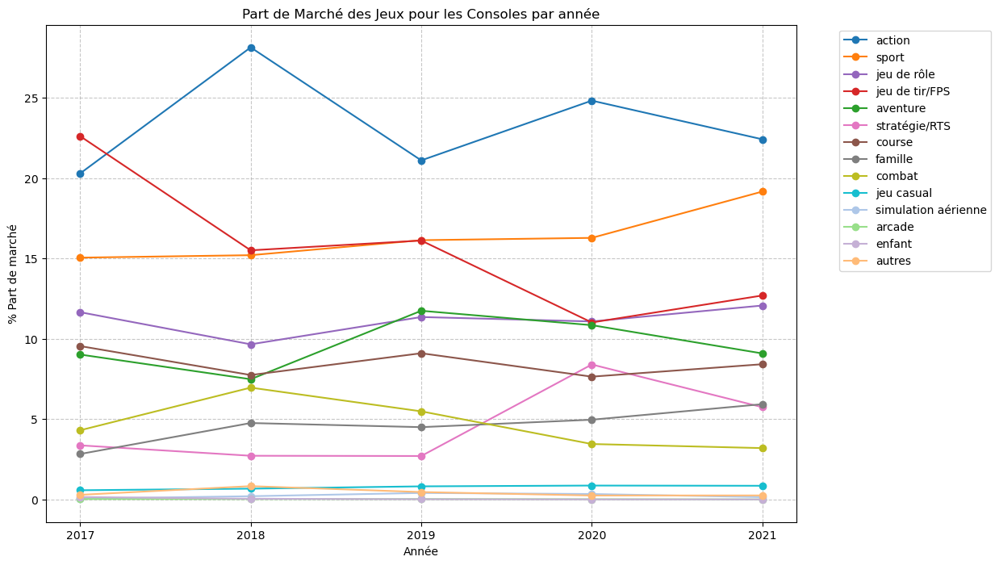

In [79]:
# Extraire les genres et les années
genres = df_market_console_percent_filtered["Genre"]
annees = df_market_console_percent_filtered.columns[1:].astype(int).astype(str)  # Exclure la colonne "Genre"

# Tracé du graphique
plt.figure(figsize=(12, 8))
for i, genre in enumerate(genres):
    plt.plot(annees, df_market_console_percent_filtered.iloc[i, 1:], marker='o',
             label=genre, color=color_palette.get(genre, "#000000"))  # Couleur par défaut en noir si non trouvée

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')  # Légende déportée pour lisibilité
plt.xlabel('Année')
plt.ylabel('% Part de marché')
plt.grid(True, linestyle='--', alpha=0.7)
plt.title("Part de Marché des Jeux pour les Consoles par année")
plt.show()

<Figure size 1200x800 with 0 Axes>

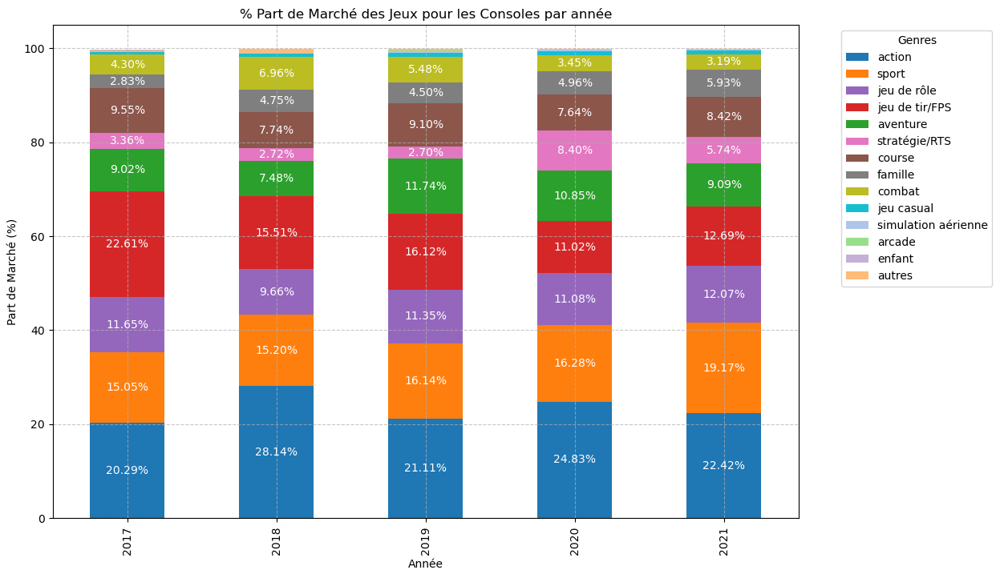

In [80]:
# Transposer les données pour avoir les années en index et les écosystèmes comme colonnes
df_market_console_percent_filtered = df_market_console_percent_filtered.set_index('Genre').transpose()

# Convertir l'index (les années) en int pour éviter l'affichage en float
df_market_console_percent_filtered.index = df_market_console_percent_filtered.index.astype(int)

# Tracé du graphique à barres empilées
plt.figure(figsize=(12, 8))

# Tracer la barre empilée pour chaque année
ax = df_market_console_percent_filtered.plot(kind='bar', stacked=True, figsize=(12, 8), color=[color_palette[genre] for genre in df_market_console_percent_filtered.columns])

# Ajouter les pourcentages dans chaque segment de barre
for i in range(len(df_market_console_percent_filtered)):
    for j, genre in enumerate(df_market_console_percent_filtered.columns):
        value = df_market_console_percent_filtered.iloc[i, j]
        if value > 2.50:  # Condition pour afficher seulement si supérieur à 2.50
            ax.text(i, df_market_console_percent_filtered.iloc[i, :j+1].sum() - value / 2, 
                    f"{value:.2f}%", ha='center', va='center', color='white')

# Ajouter les labels et titre
plt.xlabel('Année')
plt.ylabel('Part de Marché (%)')
plt.title('% Part de Marché des Jeux pour les Consoles par année')

# Ajouter la légende
plt.legend(title='Genres',bbox_to_anchor=(1.05, 1), loc='upper left')  # Légende déportée pour lisibilité

# Afficher le graphique
plt.grid(True, linestyle='--', alpha=0.7)
plt.show()

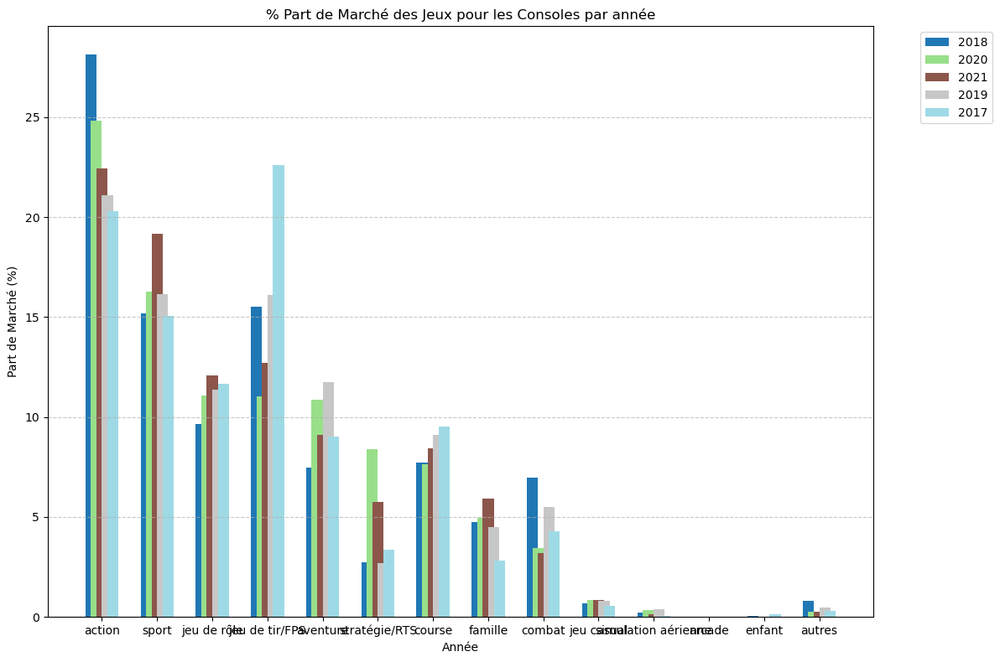

In [81]:

# Trier les données pour chaque année par ordre décroissant
df_market_console_percent_filtered = df_market_console_percent_filtered.sort_values(by=list(df_market_console_percent_filtered.columns), axis=0, ascending=False)

# Récupérer les années en tant que liste (colonnes du DataFrame)
annees = df_market_console_percent_filtered.columns.astype(str)

# Nombre d'années et d'écosystèmes
n_annees = len(annees)
n_ecosystems = len(df_market_console_percent_filtered)

# Création des positions des groupes de barres
x = np.arange(n_annees)  # Positions des années sur l'axe X
bar_width = 0.2  # Largeur des barres
offset = np.linspace(-bar_width, bar_width, n_ecosystems)  # Décalage des barres

# Générer une couleur différente pour chaque écosystème
couleurs = plt.cm.tab20(np.linspace(0, 1, n_ecosystems))

# Création du graphique
plt.figure(figsize=(12, 8))

# Boucle sur chaque écosystème pour tracer les barres
for i, (ecosystem, data) in enumerate(df_market_console_percent_filtered.iterrows()):
    plt.bar(x + offset[i], data.values, width=bar_width, label=ecosystem, color=couleurs[i])

# Ajout des étiquettes et du titre
plt.xlabel('Année')
plt.ylabel('Part de Marché (%)')
plt.title('% Part de Marché des Jeux pour les Consoles par année')
plt.xticks(x, annees)  # Associer les années aux positions des groupes de barres
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')  # Légende déportée pour lisibilité

# Affichage du graphique
plt.tight_layout()
plt.show()

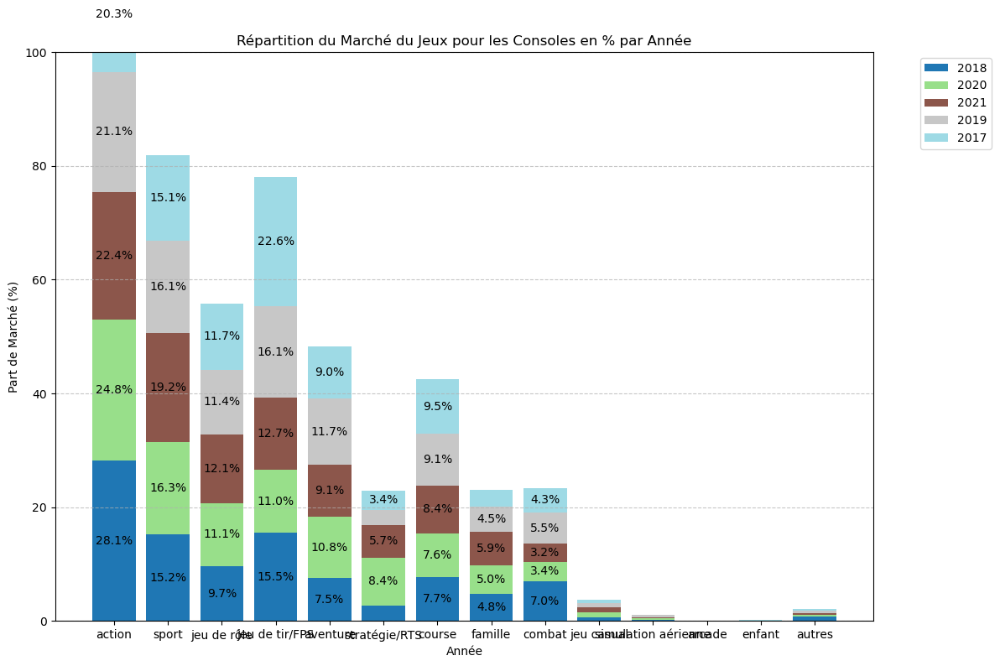

In [82]:
# Trier les données pour chaque année par ordre décroissant
df_market_console_percent_filtered = df_market_console_percent_filtered.sort_values(by=list(df_market_console_percent_filtered.columns), axis=0, ascending=False)

# Récupérer les années en tant que liste (colonnes du DataFrame)
annees = df_market_console_percent_filtered.columns.astype(str)

# Générer une couleur différente pour chaque écosystème
couleurs = plt.cm.tab20(np.linspace(0, 1, len(df_market_console_percent_filtered)))

# Création du graphique
plt.figure(figsize=(12, 8))

# Initialiser les positions pour empiler les barres
bottom = np.zeros(len(annees))  # Commence à 0 pour chaque année

# Boucle sur chaque écosystème pour tracer les segments de barres empilées
for i, (ecosystem, data) in enumerate(df_market_console_percent_filtered.iterrows()):
    plt.bar(annees, data.values, label=ecosystem, color=couleurs[i], bottom=bottom)

    # Ajout des pourcentages au centre de chaque segment
    for j, val in enumerate(data.values):
        if val > 3:  # Afficher seulement si supérieur à 3% pour éviter l'encombrement
            plt.text(j, bottom[j] + val / 2, f"{val:.1f}%", ha='center', va='center', fontsize=10, color='black')

    # Mise à jour du "bottom" pour empiler les valeurs
    bottom += data.values  

# Ajout des étiquettes et du titre
plt.xlabel('Année')
plt.ylabel('Part de Marché (%)')
plt.title('Répartition du Marché du Jeux pour les Consoles en % par Année')
plt.ylim(0, 100)  # Les valeurs vont de 0 à 100%
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')  # Légende déportée pour lisibilité

# Affichage du graphique
plt.tight_layout()
plt.show()

## 4. Data GenrePC

In [84]:
# Accéder à une feuille spécifique
df_market_pc = market_dict["genrePC"]
df_market_pc.head(50)  

,Unnamed: 0,Unnamed: 1,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5
0,"Retour au menu ""Marché du jeu vidéo""",NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN
2,Marché du jeu vidéo PC selon le genre,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN
4,Le marché des jeux vidéo PC selon le genre (mi...,NaN,NaN,NaN,NaN,NaN
5,NaN,NaN,NaN,NaN,NaN,NaN
6,NaN,2.017000e+03,2.018000e+03,2.019000e+03,2.020000e+03,2.021000e+03
7,action,5.973665e+05,5.036394e+05,4.510640e+05,6.947362e+05,5.027947e+05
8,stratégie/RTS,6.588882e+05,6.161289e+05,4.952567e+05,5.396656e+05,4.584201e+05
9,aventure,2.294729e+05,2.203224e+05,2.290001e+05,4.421300e+05,2.658751e+05


### 4.1 Ventes Jeux PC

In [86]:
# titre
title = df_market_pc.iloc[4,0]
print(title)

Le marché des jeux vidéo PC selon le genre (milliers d’unités)


In [87]:
# Extraire les noms des colonnes depuis une ligne d'entêtes
new_column_names = df_market_pc.iloc[6].tolist()
display(new_column_names)

# Sélectionner les données CA
df_market_pc_vente = df_market_pc.iloc[7:22].copy()

[nan, 2017.0, 2018.0, 2019.0, 2020.0, 2021.0]

In [88]:
# Appliquer les nouveaux noms de colonnes
df_market_pc_vente.columns = new_column_names

# Réinitialiser l'index si nécessaire
df_market_pc_vente.reset_index(drop=True, inplace=True)

display(df_market_pc_vente)

,NaN,2017.0,2018.0,2019.0,2020.0,2021.0
0,action,597366.54,503639.42,451063.97,694736.22,502794.67
1,stratégie/RTS,658888.22,616128.93,495256.70,539665.58,458420.13
2,aventure,229472.85,220322.38,229000.10,442130.00,265875.10
3,jeu de tir/FPS,502472.87,416841.88,436295.00,411191.30,278309.37
4,jeu de rôle,291465.39,346975.06,246741.99,379377.63,279319.54
5,sport,118805.58,113569.72,104128.94,138894.42,98938.74
6,course,97222.20,112007.92,90894.55,68931.97,55378.77
7,combat,62473.86,69175.16,50464.90,65324.61,80301.01
8,jeu casual,67856.23,44341.97,36328.40,63233.25,42503.67
9,simulation aérienne,3287.16,2867.00,12758.82,35110.24,17952.18


In [89]:
# Définir la colonne 0 comme index
#df_market_pc_vente.set_index(df_market_pc_vente.columns[0], inplace=True)
df_market_pc_vente.columns = ["Genre"] + list(df_market_pc_vente.columns[1:])

# Afficher les premières lignes pour vérifier
print(df_market_pc_vente.head())

            Genre     2017.0     2018.0     2019.0     2020.0     2021.0
0          action  597366.54  503639.42  451063.97  694736.22  502794.67
1   stratégie/RTS  658888.22  616128.93  495256.70  539665.58  458420.13
2        aventure  229472.85  220322.38  229000.10  442130.00  265875.10
3  jeu de tir/FPS  502472.87  416841.88  436295.00  411191.30  278309.37
4     jeu de rôle  291465.39  346975.06  246741.99  379377.63  279319.54


#### Graphique

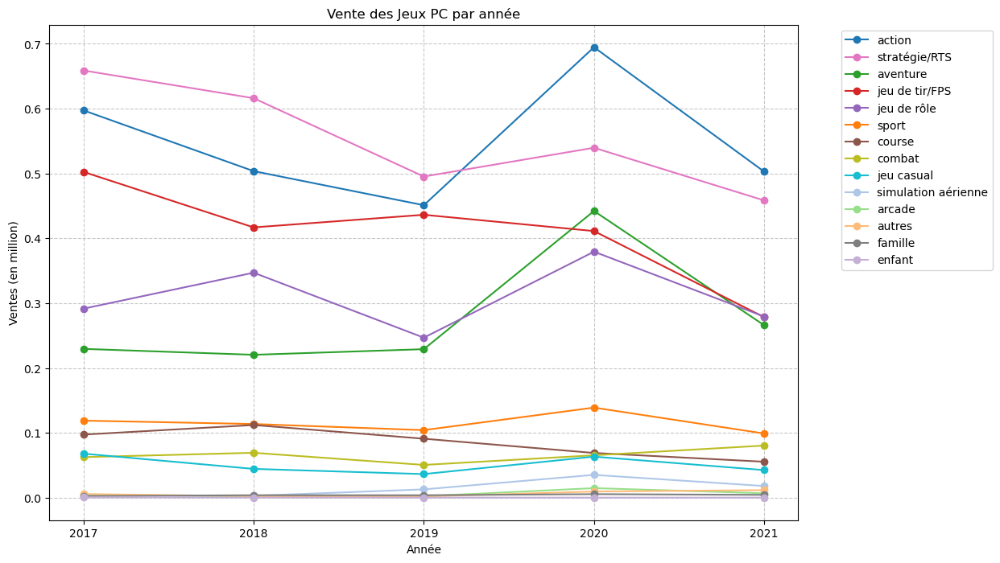

In [91]:
# Suppression des NaN
df_market_pc_vente_filtered = df_market_pc_vente.dropna()

# Extraire les genres et les années
genres = df_market_pc_vente_filtered["Genre"]
annees = df_market_pc_vente_filtered.columns[1:].astype(int).astype(str)  # Exclure la colonne "Genre"

# Convertir uniquement les colonnes numériques en millions
df_market_pc_vente_filtered.iloc[:, 1:] = df_market_pc_vente_filtered.iloc[:, 1:].astype(float) / 1_000_000

# Tracé du graphique
plt.figure(figsize=(12, 8))
for i, genre in enumerate(genres):
    plt.plot(annees, df_market_pc_vente_filtered.iloc[i, 1:], marker='o',
             label=genre, color=color_palette.get(genre, "#000000"))  # Couleur par défaut en noir si non trouvée

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')  # Légende déportée pour lisibilité
plt.xlabel('Année')
plt.ylabel('Ventes (en million)')
plt.grid(True, linestyle='--', alpha=0.7)
plt.title("Vente des Jeux PC par année")
plt.show()

### 4.2 CA PC

In [93]:
# titre
title = df_market_pc.iloc[24,0]
print(title)

Chiffre d’affaires du marché des jeux vidéo PC selon le genre (M€)


In [94]:

# Sélectionner les données CA
df_market_pc_ca = df_market_pc.iloc[27:41].copy()

In [95]:
# Appliquer les nouveaux noms de colonnes
df_market_pc_ca.columns = new_column_names

# Réinitialiser l'index si nécessaire
df_market_pc_ca.reset_index(drop=True, inplace=True)

display(df_market_pc_ca)

,NaN,2017.0,2018.0,2019.0,2020.0,2021.0
0,stratégie/RTS,17.4,14.7,10.6,9.7,10.3
1,action,11.3,8.5,8.4,8.8,7.2
2,jeu de rôle,6.6,10.2,5.5,7.8,5.8
3,jeu de tir/FPS,12.4,9.1,5.9,5.9,6.0
4,sport,4.3,4.1,3.8,5.1,3.6
5,aventure,3.5,2.8,3.0,3.6,3.6
6,simulation aérienne,0.1,0.1,0.4,1.5,0.7
7,course,2.0,2.0,1.9,1.1,1.0
8,combat,1.5,2.5,1.4,1.0,1.3
9,jeu casual,0.6,0.4,0.3,0.3,0.4


In [96]:
# Définir la colonne 0 comme index
#df_market_pc_ca.set_index(df_market_pc_ca.columns[0], inplace=True)
df_market_pc_ca.columns = ["Genre"] + list(df_market_pc_ca.columns[1:])


# Afficher les premières lignes pour vérifier
print(df_market_pc_ca.head())

            Genre  2017.0  2018.0  2019.0  2020.0  2021.0
0   stratégie/RTS    17.4    14.7    10.6     9.7    10.3
1          action    11.3     8.5     8.4     8.8     7.2
2     jeu de rôle     6.6    10.2     5.5     7.8     5.8
3  jeu de tir/FPS    12.4     9.1     5.9     5.9     6.0
4           sport     4.3     4.1     3.8     5.1     3.6


In [97]:
df_market_pc_ca_filtered = df_market_pc_ca
display(df_market_pc_ca_filtered)

,Genre,2017.0,2018.0,2019.0,2020.0,2021.0
0,stratégie/RTS,17.4,14.7,10.6,9.7,10.3
1,action,11.3,8.5,8.4,8.8,7.2
2,jeu de rôle,6.6,10.2,5.5,7.8,5.8
3,jeu de tir/FPS,12.4,9.1,5.9,5.9,6.0
4,sport,4.3,4.1,3.8,5.1,3.6
5,aventure,3.5,2.8,3.0,3.6,3.6
6,simulation aérienne,0.1,0.1,0.4,1.5,0.7
7,course,2.0,2.0,1.9,1.1,1.0
8,combat,1.5,2.5,1.4,1.0,1.3
9,jeu casual,0.6,0.4,0.3,0.3,0.4


#### Graphique

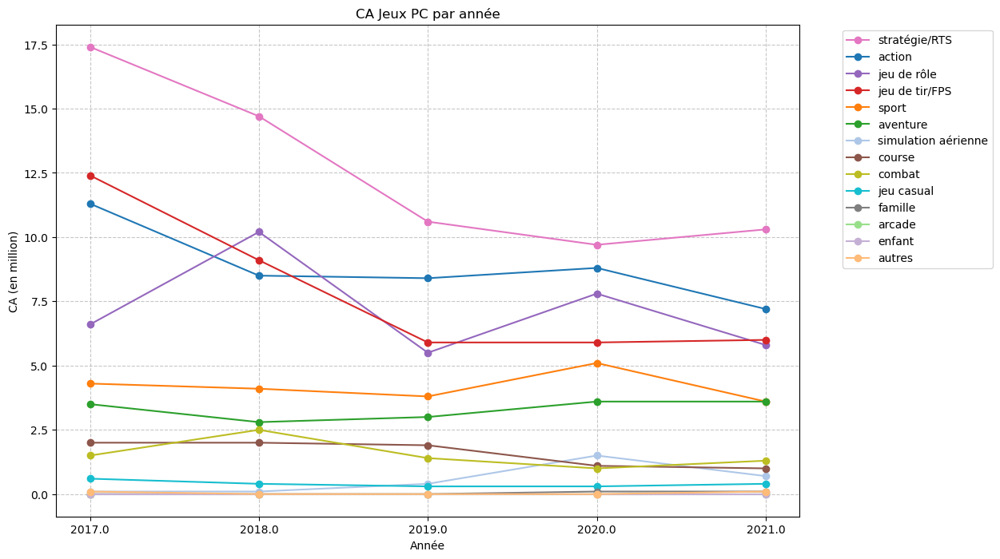

In [99]:
# Extraire les genres et les années
genres = df_market_pc_ca_filtered["Genre"]
annees = df_market_pc_ca_filtered.columns[1:].astype(str)  # Exclure la colonne "Genre"

# Tracé du graphique
plt.figure(figsize=(12, 8))
for i, genre in enumerate(genres):
    plt.plot(annees, df_market_pc_ca_filtered.iloc[i, 1:], marker='o',
             label=genre, color=color_palette.get(genre, "#000000"))  # Couleur par défaut en noir si non trouvée

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')  # Légende déportée pour lisibilité
plt.xlabel('Année')
plt.ylabel('CA (en million)')
plt.grid(True, linestyle='--', alpha=0.7)
plt.title("CA Jeux PC par année")
plt.show()

### 4.3 Part de Marché des Jeux sur PC

In [101]:
# titre
title = df_market_pc.iloc[43,0]
print(title)

Parts de marché des jeux vidéo PC selon le genre (%)


In [102]:
# Sélectionner les données CA
df_market_pc_percent = df_market_pc.iloc[46:60].copy()

In [103]:
# Appliquer les nouveaux noms de colonnes
df_market_pc_percent.columns = new_column_names

# Réinitialiser l'index si nécessaire
df_market_pc_percent.columns = ["Genre"] + list(df_market_pc_percent.columns[1:])
df_market_pc_percent.reset_index(drop=True, inplace=True)

display(df_market_pc_percent)

,Genre,2017.0,2018.0,2019.0,2020.0,2021.0
0,stratégie/RTS,29.194631,27.071823,25.728155,21.651786,25.621891
1,action,18.959732,15.653775,20.388350,19.642857,17.910448
2,jeu de rôle,11.073826,18.784530,13.349515,17.410714,14.427861
3,jeu de tir/FPS,20.805369,16.758748,14.320388,13.169643,14.925373
4,sport,7.214765,7.550645,9.223301,11.383929,8.955224
5,aventure,5.872483,5.156538,7.281553,8.035714,8.955224
6,simulation aérienne,0.167785,0.184162,0.970874,3.348214,1.741294
7,course,3.355705,3.683241,4.611650,2.455357,2.487562
8,combat,2.516779,4.604052,3.398058,2.232143,3.233831
9,jeu casual,1.006711,0.736648,0.728155,0.669643,0.995025


In [104]:
df_market_pc_percent_filtered = df_market_pc_percent.sort_values(by="Genre", ascending=True)
df_market_pc_percent_filtered.reset_index(drop=True, inplace=True)
display(df_market_pc_percent_filtered)

,Genre,2017.0,2018.0,2019.0,2020.0,2021.0
0,action,18.959732,15.653775,20.388350,19.642857,17.910448
1,arcade,0.000000,0.000000,0.000000,0.000000,0.000000
2,autres,0.167785,0.000000,0.000000,0.000000,0.248756
3,aventure,5.872483,5.156538,7.281553,8.035714,8.955224
4,combat,2.516779,4.604052,3.398058,2.232143,3.233831
5,course,3.355705,3.683241,4.611650,2.455357,2.487562
6,enfant,0.000000,0.000000,0.000000,0.000000,0.000000
7,famille,0.000000,0.000000,0.000000,0.223214,0.248756
8,jeu casual,1.006711,0.736648,0.728155,0.669643,0.995025
9,jeu de rôle,11.073826,18.784530,13.349515,17.410714,14.427861


#### Graphique

<Figure size 1200x800 with 0 Axes>

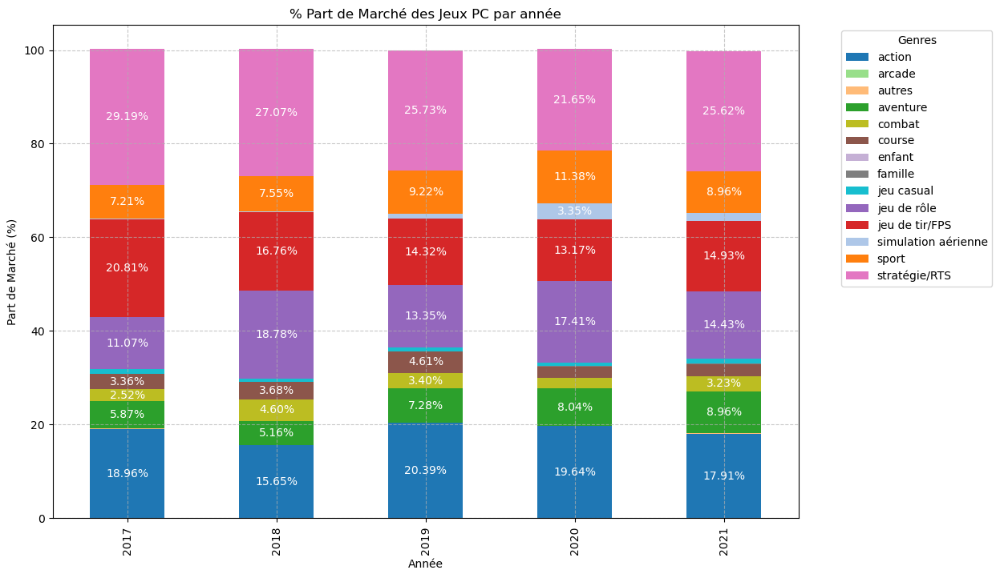

In [106]:
# Transposer les données pour avoir les années en index et les écosystèmes comme colonnes
df_market_pc_percent_filtered = df_market_pc_percent_filtered.set_index('Genre').transpose()

# Convertir l'index (les années) en int pour éviter l'affichage en float
df_market_pc_percent_filtered.index = df_market_pc_percent_filtered.index.astype(int)

# Tracé du graphique à barres empilées
plt.figure(figsize=(12, 8))

# Tracer la barre empilée pour chaque année
ax = df_market_pc_percent_filtered.plot(kind='bar', stacked=True, figsize=(12, 8), color=[color_palette[genre] for genre in df_market_pc_percent_filtered.columns])

# Ajouter les pourcentages dans chaque segment de barre
for i in range(len(df_market_pc_percent_filtered)):
    for j, genre in enumerate(df_market_pc_percent_filtered.columns):
        value = df_market_pc_percent_filtered.iloc[i, j]
        if value > 2.50:  # Condition pour afficher seulement si supérieur à 2.50
            ax.text(i, df_market_pc_percent_filtered.iloc[i, :j+1].sum() - df_market_pc_percent_filtered.iloc[i, j] / 2, 
                f"{df_market_pc_percent_filtered.iloc[i, j]:.2f}%", ha='center', va='center', color='white')

# Ajouter les labels et titre
plt.xlabel('Année')
plt.ylabel('Part de Marché (%)')
plt.title('% Part de Marché des Jeux PC par année')

# Ajouter la légende
plt.legend(title='Genres',bbox_to_anchor=(1.05, 1), loc='upper left')  # Légende déportée pour lisibilité

# Afficher le graphique
plt.grid(True, linestyle='--', alpha=0.7)
plt.show()

In [107]:
display(df_market_pc_vente)

,Genre,2017.0,2018.0,2019.0,2020.0,2021.0
0,action,597366.54,503639.42,451063.97,694736.22,502794.67
1,stratégie/RTS,658888.22,616128.93,495256.70,539665.58,458420.13
2,aventure,229472.85,220322.38,229000.10,442130.00,265875.10
3,jeu de tir/FPS,502472.87,416841.88,436295.00,411191.30,278309.37
4,jeu de rôle,291465.39,346975.06,246741.99,379377.63,279319.54
5,sport,118805.58,113569.72,104128.94,138894.42,98938.74
6,course,97222.20,112007.92,90894.55,68931.97,55378.77
7,combat,62473.86,69175.16,50464.90,65324.61,80301.01
8,jeu casual,67856.23,44341.97,36328.40,63233.25,42503.67
9,simulation aérienne,3287.16,2867.00,12758.82,35110.24,17952.18


In [108]:
display(df_market_console_vente)

,Genre,2017.0,2018.0,2019.0,2020.0,2021.0
0,action,5249050.11,6275082.50,5084765.00,6465126.50,5495763.88
1,sport,2788723.96,2941826.18,2834431.45,3406322.58,3268922.97
2,aventure,2224095.01,2060020.39,2615064.63,2789960.49,2262907.90
3,jeu de tir/FPS,4539577.11,3351596.52,3144100.43,2666668.66,2387365.87
4,jeu de rôle,2714332.17,2195081.57,2470529.76,2513713.01,2498135.74
5,course,1998898.28,1708523.82,2055817.08,2054323.38,1936814.24
6,stratégie/RTS,901894.14,776372.87,746933.28,1966802.17,1352558.48
7,famille,761369.48,1056157.23,937022.94,1238322.50,1241495.11
8,combat,995595.64,1385766.44,1159709.67,1134279.32,1010337.11
9,jeu casual,212353.46,231488.58,295789.01,384521.07,329347.32


### Fusion Marché Jeux PC et Console

In [110]:
# Suppression des NaN dans la colonne "Genre"
df_market_pc_vente = df_market_pc_vente.dropna(subset=["Genre"])
df_market_console_vente = df_market_console_vente.dropna(subset=["Genre"])

# Fusionner les deux DataFrames sur la colonne "Genre" en faisant une jointure externe (outer join)
df_total_vente = pd.merge(df_market_pc_vente, df_market_console_vente, on="Genre", how="outer", suffixes=("_pc", "_console"))

# Remplacer les NaN par 0 pour éviter les erreurs d'addition
df_total_vente = df_total_vente.fillna(0)

# Sélectionner uniquement les colonnes numériques (années) et additionner les ventes PC et Console
colonnes_annees = df_market_pc_vente.columns[1:]  # Exclure la colonne "Genre"
df_total_vente[colonnes_annees] = df_total_vente[[f"{annee}_pc" for annee in colonnes_annees]].values + df_total_vente[[f"{annee}_console" for annee in colonnes_annees]].values

# Supprimer les anciennes colonnes inutiles (avec suffixes _pc et _console)
df_total_vente = df_total_vente[["Genre"] + list(colonnes_annees)]

# Afficher le DataFrame résultant
display(df_total_vente)

,Genre,2017.0,2018.0,2019.0,2020.0,2021.0
0,action,5846416.65,6778721.92,5535828.97,7159862.72,5998558.55
1,arcade,17931.87,14042.90,12350.11,28027.14,13065.60
2,autres,98269.09,174248.83,127806.00,106029.76,103336.88
3,aventure,2453567.86,2280342.77,2844064.73,3232090.49,2528783.00
4,combat,1058069.50,1454941.60,1210174.57,1199603.93,1090638.12
5,course,2096120.48,1820531.74,2146711.63,2123255.35,1992193.01
6,enfant,34916.54,18248.83,3359.57,1311.86,560.94
7,famille,763802.95,1059898.28,940719.53,1243712.46,1245762.23
8,jeu casual,280209.69,275830.55,332117.41,447754.32,371850.99
9,jeu de rôle,3005797.56,2542056.63,2717271.75,2893090.64,2777455.28


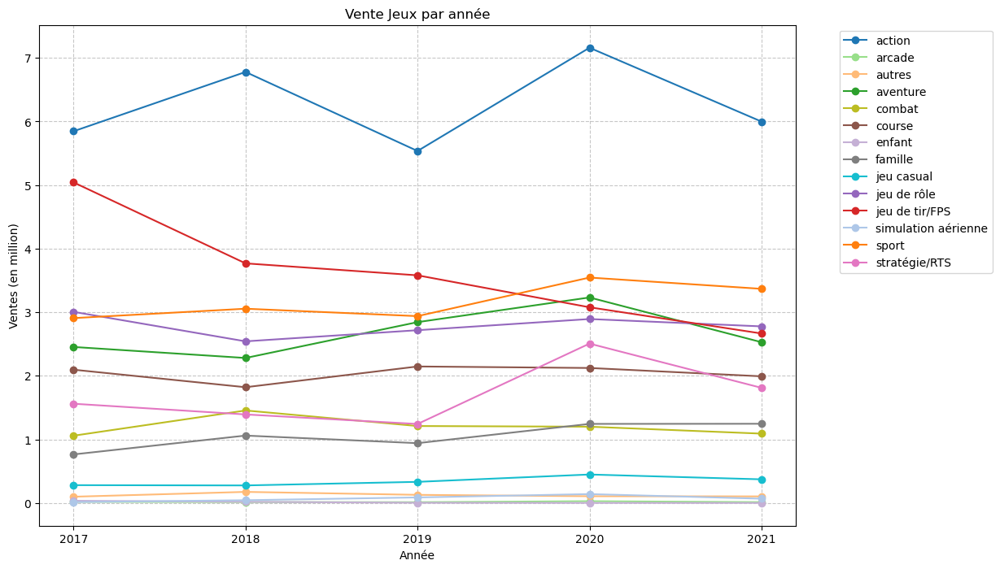

In [111]:

# Extraire les genres et les années
genres = df_total_vente["Genre"]
annees = df_total_vente.columns[1:].astype(int).astype(str)  # Exclure la colonne "Genre"

# Convertir uniquement les colonnes numériques en millions
df_total_vente.iloc[:, 1:] = df_total_vente.iloc[:, 1:].astype(float) / 1_000_000

# Tracé du graphique
plt.figure(figsize=(12, 8))
for i, genre in enumerate(genres):
    plt.plot(annees, df_total_vente.iloc[i, 1:], marker='o',
             label=genre, color=color_palette.get(genre, "#000000"))  # Couleur par défaut en noir si non trouvée

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')  # Légende déportée pour lisibilité
plt.xlabel('Année')
plt.ylabel('Ventes (en million)')
plt.grid(True, linestyle='--', alpha=0.7)
plt.title("Vente Jeux par année")
plt.show()

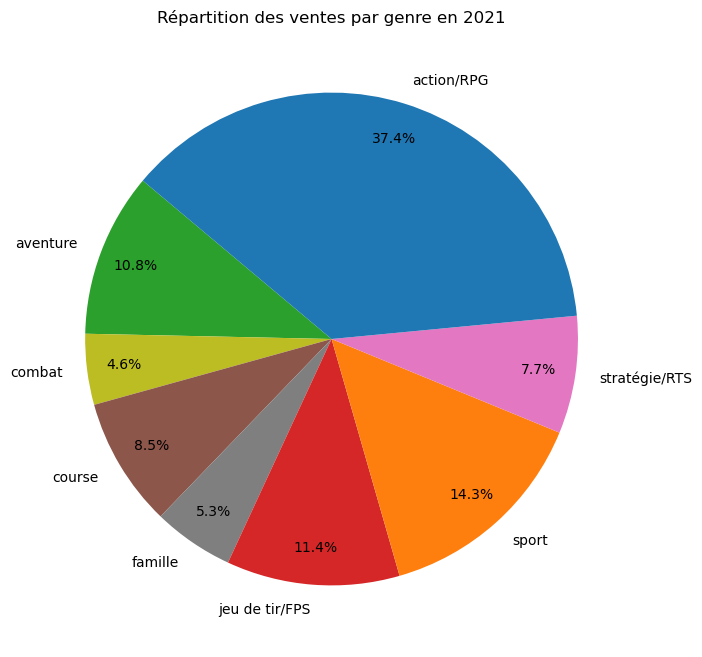

In [112]:
# Initialiser un dictionnaire pour stocker les données de 2021
data_pie_2021 = {}

# Extraire les ventes pour l'année 2021
annee_2021 = "2021"  # Vérifie que le nom de la colonne correspond exactement à celui du DataFrame
for i, genre in enumerate(df_total_vente["Genre"]):
    data_pie_2021[genre] = max(0, df_total_vente.loc[i, 2021])  # Assurer des valeurs positives

# Regrouper les genres "action" et "jeu de rôle"
if "action" in data_pie_2021 and "jeu de rôle" in data_pie_2021:
    data_pie_2021["action/RPG"] = data_pie_2021.pop("action") + data_pie_2021.pop("jeu de rôle")

# Ajouter une couleur pour "action/RPG" si elle n'existe pas
color_palette["action/RPG"] = "#1f77b4"

# Filtrer les genres avec moins de 2.5% des ventes totales
total_ventes_2021 = sum(data_pie_2021.values())
data_pie_2021 = {genre: valeur for genre, valeur in data_pie_2021.items() if (valeur / total_ventes_2021) * 100 >= 2.5}

# Tracé du camembert avec tailles des parts basées sur les valeurs
plt.figure(figsize=(8, 8))
plt.pie(data_pie_2021.values(), labels=data_pie_2021.keys(), autopct='%1.1f%%', 
        colors=[color_palette.get(genre, "#333333") for genre in data_pie_2021.keys()],  
        startangle=140, pctdistance=0.85)
plt.title("Répartition des ventes par genre en 2021")
plt.show()

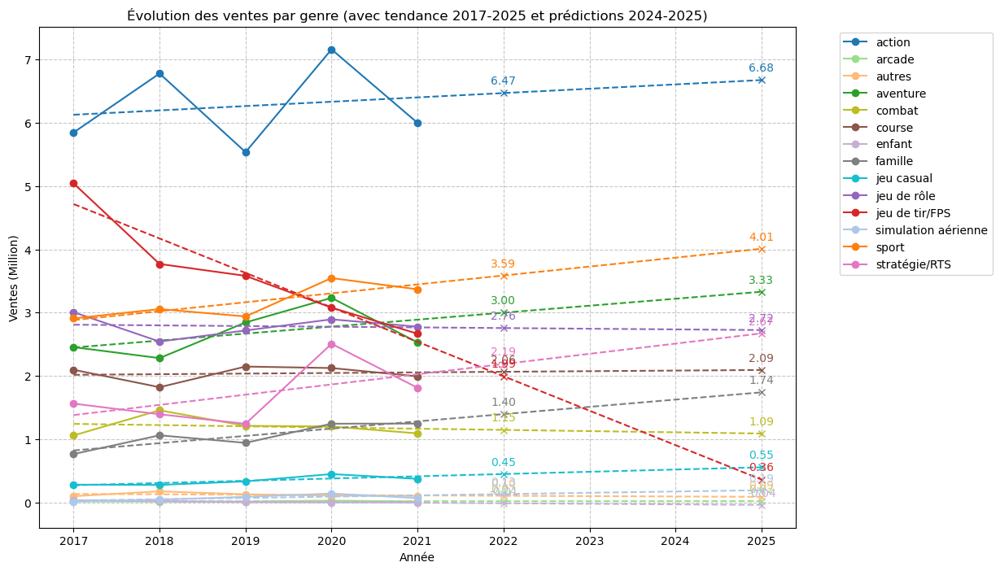

In [113]:
annees_existantes = df_total_vente.columns[1:].astype(float).to_numpy().reshape(-1, 1)

# Créer un ensemble d'années de 2017 à 2025 pour la ligne de tendance
annees_tendance = np.arange(2017, 2026).reshape(-1, 1)

# Créer un tableau pour les années futures à prédire (2024 et 2025)
annees_futures = np.array([2022, 2025]).reshape(-1, 1)

# Tracé du graphique
plt.figure(figsize=(12, 8))

for i, genre in enumerate(df_total_vente["Genre"]):
    # Extraire les données de l'écosystème
    y = df_total_vente.iloc[i, 1:].values
    
    # Modèle de régression linéaire
    model = LinearRegression()
    model.fit(annees_existantes, y)  # Entraîner sur toutes les années passées
    
    # Prédiction pour toutes les années de 2017 à 2025
    y_pred_tendance = model.predict(annees_tendance)
    
    # Prédiction spécifique pour 2024 et 2025
    y_pred_futures = model.predict(annees_futures)
    
    # Tracer les valeurs existantes
    plt.plot(annees_existantes, y, marker='o', label=genre, color=color_palette[genre])
    
    # Tracer la ligne de tendance (de 2017 à 2025)
    plt.plot(annees_tendance, y_pred_tendance, marker='', linestyle='dashed', color=color_palette[genre])
    
    # Tracer les points de prédiction (pour 2024 et 2025)
    plt.plot(annees_futures, y_pred_futures, marker='x', linestyle=' ', color=color_palette[genre])

     # Ajouter la valeur de la prédiction pour 2024 et 2025
    for j, annee in enumerate(annees_futures.flatten()):
        plt.text(annee, y_pred_futures[j]+0.1, f"{y_pred_futures[j]:.2f}", ha='center', va='bottom', color=color_palette[genre])


# Ajouter la légende et autres éléments
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')  # Légende déportée
plt.xlabel('Année')
plt.ylabel('Ventes (Million)')
plt.grid(True, linestyle='--', alpha=0.7)
plt.title("Évolution des ventes par genre (avec tendance 2017-2025 et prédictions 2024-2025)")

plt.show()

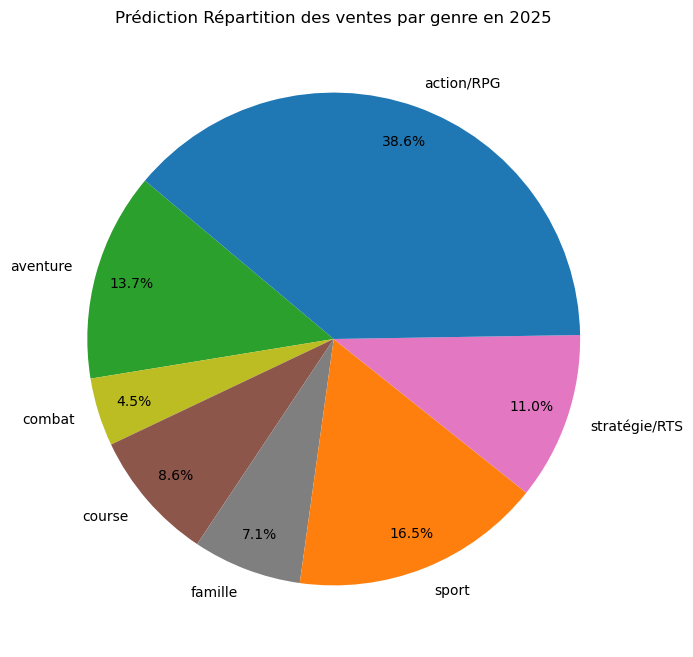

In [114]:
# Initialiser un dictionnaire pour stocker les prédictions
data_pie_2025 = {}

# Extraire les années existantes
annees_existantes = df_total_vente.columns[1:].astype(float).to_numpy().reshape(-1, 1)

# Pour chaque genre, entraîner un modèle et prédire la valeur pour 2025
for i, genre in enumerate(df_total_vente["Genre"]):
    y = df_total_vente.iloc[i, 1:].values  # Récupérer les ventes
    model = LinearRegression()
    model.fit(annees_existantes, y)  # Entraîner le modèle
    prediction = model.predict([[2025]])[0]
    data_pie_2025[genre] = max(0, prediction)  # Assurer des valeurs positives

# Regrouper les genres "action" et "jeu de rôle"
if "action" in data_pie_2025 and "jeu de rôle" in data_pie_2025:
    data_pie_2025["action/RPG"] = data_pie_2025.pop("action") + data_pie_2025.pop("jeu de rôle")
    
color_palette["action/RPG"] = "#1f77b4"  # Choisis une couleur appropriée

# Filtrer les genres avec moins de 2.5% des ventes totales
total_ventes = sum(data_pie_2025.values())
data_pie_2025 = {genre: valeur for genre, valeur in data_pie_2025.items() if (valeur / total_ventes) * 100 >= 2.5}

# Tracé du camembert avec tailles des parts basées sur les valeurs
plt.figure(figsize=(8, 8))
plt.pie(data_pie_2025.values(), labels=data_pie_2025.keys(), autopct='%1.1f%%', 
        colors=[color_palette[genre] for genre in data_pie_2025.keys()], startangle=140, 
        pctdistance=0.85)
plt.title("Prédiction Répartition des ventes par genre en 2025")
plt.show()

In [115]:
display(df_market_console_ca)

,Genre,2017.0,2018.0,2019.0,2020.0,2021.0,2022.0,2023.0
0,action,192.4,269.3,184.4,236.2,190.2,180.5,191.4
1,sport,142.7,145.5,141.0,154.9,162.6,182.8,156.5
2,jeu de rôle,110.5,92.4,99.2,105.4,102.4,159.1,80.6
3,jeu de tir/FPS,214.4,148.4,140.8,104.8,107.7,106.2,84.4
4,aventure,85.5,71.6,102.6,103.2,77.1,61.0,232.4
5,stratégie/RTS,31.9,26.0,23.6,79.9,48.7,38.3,36.5
6,course,90.5,74.1,79.5,72.7,71.4,84.5,72.1
7,famille,26.8,45.5,39.3,47.2,50.3,33.4,26.5
8,combat,40.8,66.6,47.9,32.8,27.1,21.4,31.1
9,jeu casual,5.4,6.4,7.1,8.2,7.2,5.8,3.0


In [116]:
display(df_market_pc_ca)

,Genre,2017.0,2018.0,2019.0,2020.0,2021.0
0,stratégie/RTS,17.4,14.7,10.6,9.7,10.3
1,action,11.3,8.5,8.4,8.8,7.2
2,jeu de rôle,6.6,10.2,5.5,7.8,5.8
3,jeu de tir/FPS,12.4,9.1,5.9,5.9,6.0
4,sport,4.3,4.1,3.8,5.1,3.6
5,aventure,3.5,2.8,3.0,3.6,3.6
6,simulation aérienne,0.1,0.1,0.4,1.5,0.7
7,course,2.0,2.0,1.9,1.1,1.0
8,combat,1.5,2.5,1.4,1.0,1.3
9,jeu casual,0.6,0.4,0.3,0.3,0.4


In [117]:
# Suppression des NaN dans la colonne "Genre"
df_market_pc_ca = df_market_pc_ca.dropna(subset=["Genre"])
df_market_console_ca = df_market_console_ca.dropna(subset=["Genre"])

# Fusionner les deux DataFrames sur la colonne "Genre" en faisant une jointure externe (outer join)
df_total_ca = pd.merge(df_market_pc_ca, df_market_console_ca, on="Genre", how="outer", suffixes=("_pc", "_console"))

# Remplacer les NaN par 0 pour éviter les erreurs d'addition
df_total_ca = df_total_ca.fillna(0)

# Sélectionner uniquement les colonnes numériques (années) et additionner les ventes PC et Console
colonnes_annees = df_market_pc_ca.columns[1:]  # Exclure la colonne "Genre"
df_total_ca[colonnes_annees] = df_total_ca[[f"{annee}_pc" for annee in colonnes_annees]].values + df_total_ca[[f"{annee}_console" for annee in colonnes_annees]].values

# Supprimer les anciennes colonnes inutiles (avec suffixes _pc et _console)
df_total_ca = df_total_ca[["Genre"] + list(colonnes_annees)]

# Afficher le DataFrame résultant
display(df_total_ca)

,Genre,2017.0,2018.0,2019.0,2020.0,2021.0
0,action,203.7,277.8,192.8,245.0,197.4
1,arcade,0.2,0.2,0.2,0.1,0.0
2,autres,2.8,7.9,4.0,2.3,2.2
3,aventure,89.0,74.4,105.6,106.8,80.7
4,combat,42.3,69.1,49.3,33.8,28.4
5,course,92.5,76.1,81.4,73.8,72.4
6,enfant,1.4,0.4,0.1,0.0,0.0
7,famille,26.8,45.5,39.3,47.3,50.4
8,jeu casual,6.0,6.8,7.4,8.5,7.6
9,jeu de rôle,117.1,102.6,104.7,113.2,108.2


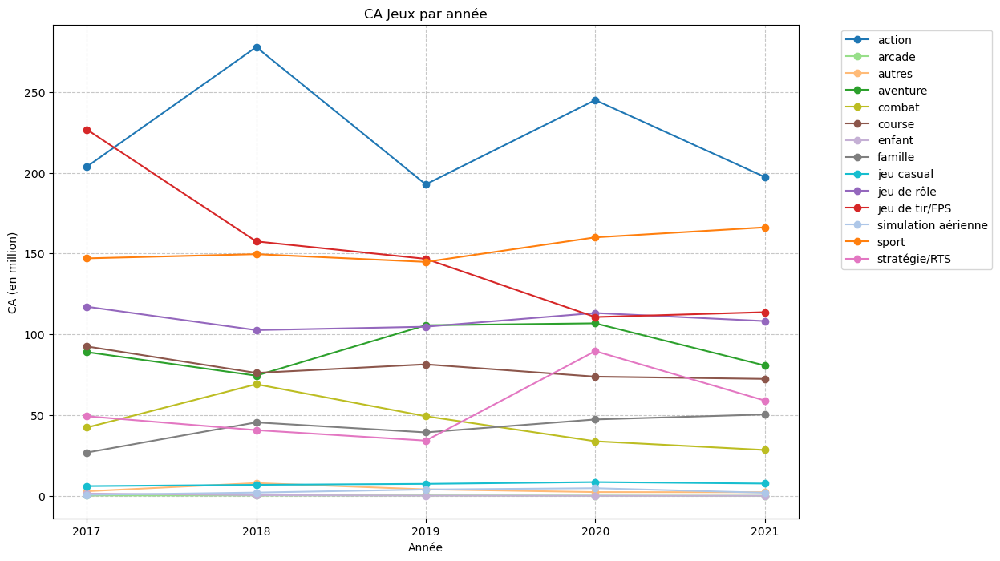

In [118]:

# Extraire les genres et les années
genres = df_total_ca["Genre"]
annees = df_total_ca.columns[1:].astype(int).astype(str)  # Exclure la colonne "Genre"

# Tracé du graphique
plt.figure(figsize=(12, 8))
for i, genre in enumerate(genres):
    plt.plot(annees, df_total_ca.iloc[i, 1:], marker='o',
             label=genre, color=color_palette.get(genre, "#000000"))  # Couleur par défaut en noir si non trouvée

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')  # Légende déportée pour lisibilité
plt.xlabel('Année')
plt.ylabel('CA (en million)')
plt.grid(True, linestyle='--', alpha=0.7)
plt.title("CA Jeux par année")
plt.show()

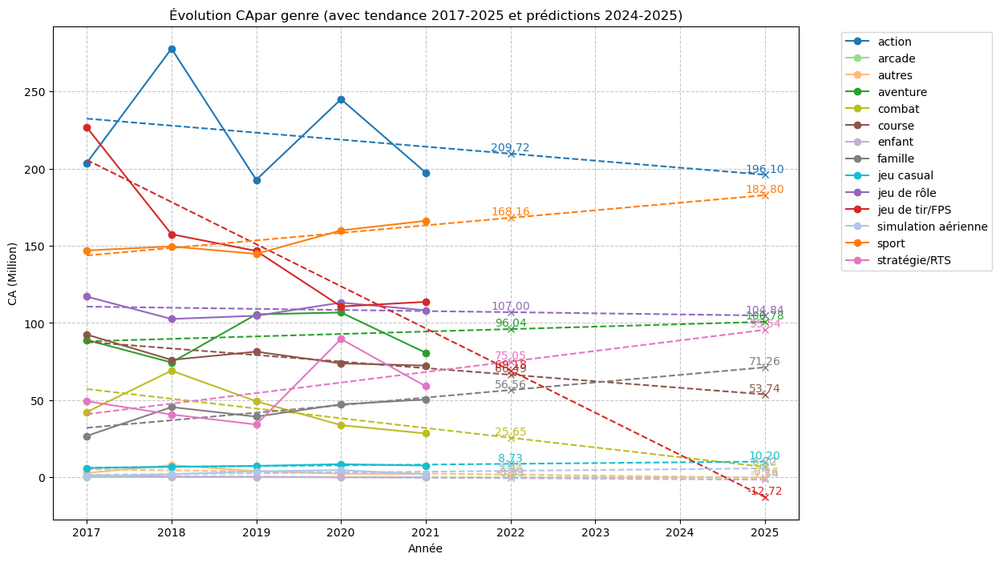

In [119]:
annees_existantes = df_total_ca.columns[1:].astype(float).to_numpy().reshape(-1, 1)

# Créer un ensemble d'années de 2017 à 2025 pour la ligne de tendance
annees_tendance = np.arange(2017, 2026).reshape(-1, 1)

# Créer un tableau pour les années futures à prédire (2024 et 2025)
annees_futures = np.array([2022, 2025]).reshape(-1, 1)

# Tracé du graphique
plt.figure(figsize=(12, 8))

for i, genre in enumerate(df_total_ca["Genre"]):
    # Extraire les données de l'écosystème
    y = df_total_ca.iloc[i, 1:].values
    
    # Modèle de régression linéaire
    model = LinearRegression()
    model.fit(annees_existantes, y)  # Entraîner sur toutes les années passées
    
    # Prédiction pour toutes les années de 2017 à 2025
    y_pred_tendance = model.predict(annees_tendance)
    
    # Prédiction spécifique pour 2024 et 2025
    y_pred_futures = model.predict(annees_futures)
    
    # Tracer les valeurs existantes
    plt.plot(annees_existantes, y, marker='o', label=genre, color=color_palette[genre])
    
    # Tracer la ligne de tendance (de 2017 à 2025)
    plt.plot(annees_tendance, y_pred_tendance, marker='', linestyle='dashed', color=color_palette[genre])
    
    # Tracer les points de prédiction (pour 2024 et 2025)
    plt.plot(annees_futures, y_pred_futures, marker='x', linestyle=' ', color=color_palette[genre])

     # Ajouter la valeur de la prédiction pour 2024 et 2025
    for j, annee in enumerate(annees_futures.flatten()):
        plt.text(annee, y_pred_futures[j]+0.1, f"{y_pred_futures[j]:.2f}", ha='center', va='bottom', color=color_palette[genre])


# Ajouter la légende et autres éléments
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')  # Légende déportée
plt.xlabel('Année')
plt.ylabel('CA (Million)')
plt.grid(True, linestyle='--', alpha=0.7)
plt.title("Évolution CApar genre (avec tendance 2017-2025 et prédictions 2024-2025)")

plt.show()

In [120]:
# Calcul du total du CA par année (somme de toutes les valeurs pour chaque colonne année)
total_par_annee = df_total_ca[colonnes_annees].sum()

# Calcul de la part de marché (%) par genre et par année
df_part_marche = df_total_ca.copy()
df_part_marche[colonnes_annees] = (df_part_marche[colonnes_annees].div(total_par_annee) * 100).round(2)

# Afficher le DataFrame résultant
display(df_part_marche)

,Genre,2017.0,2018.0,2019.0,2020.0,2021.0
0,action,20.26,27.49,21.08,24.60,22.23
1,arcade,0.02,0.02,0.02,0.01,0.00
2,autres,0.28,0.78,0.44,0.23,0.25
3,aventure,8.85,7.36,11.55,10.73,9.09
4,combat,4.21,6.84,5.39,3.39,3.20
5,course,9.20,7.53,8.90,7.41,8.15
6,enfant,0.14,0.04,0.01,0.00,0.00
7,famille,2.67,4.50,4.30,4.75,5.68
8,jeu casual,0.60,0.67,0.81,0.85,0.86
9,jeu de rôle,11.65,10.15,11.45,11.37,12.18


<Figure size 1200x800 with 0 Axes>

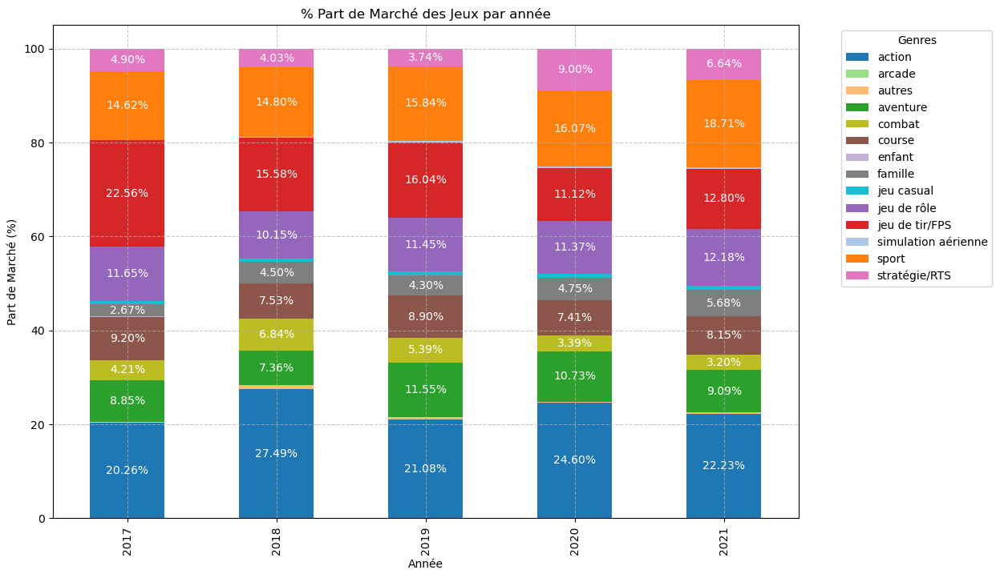

In [121]:
# Transposer les données pour avoir les années en index et les écosystèmes comme colonnes
df_part_marche = df_part_marche.set_index('Genre').transpose()

# Convertir l'index (les années) en int pour éviter l'affichage en float
df_part_marche.index = df_part_marche.index.astype(int)

# Tracé du graphique à barres empilées
plt.figure(figsize=(12, 8))

# Tracer la barre empilée pour chaque année
ax = df_part_marche.plot(kind='bar', stacked=True, figsize=(12, 8), color=[color_palette[genre] for genre in df_part_marche.columns])

# Ajouter les pourcentages dans chaque segment de barre
for i in range(len(df_part_marche)):
    for j, genre in enumerate(df_part_marche.columns):
        value = df_part_marche.iloc[i, j]
        if value > 2.50:  # Condition pour afficher seulement si supérieur à 2.50
            ax.text(i, df_part_marche.iloc[i, :j+1].sum() - df_part_marche.iloc[i, j] / 2, 
                f"{df_part_marche.iloc[i, j]:.2f}%", ha='center', va='center', color='white')

# Ajouter les labels et titre
plt.xlabel('Année')
plt.ylabel('Part de Marché (%)')
plt.title('% Part de Marché des Jeux par année')

# Ajouter la légende
plt.legend(title='Genres',bbox_to_anchor=(1.05, 1), loc='upper left')  # Légende déportée pour lisibilité

# Afficher le graphique
plt.grid(True, linestyle='--', alpha=0.7)
plt.show()

In [122]:
# Convertir le DataFrame en format long
df_long = df_total_ca.melt(id_vars=["Genre"], var_name="Année", value_name="CA")

# Convertir l'année en type numérique (float → int)
df_long["Année"] = df_long["Année"].astype(int)

In [123]:
from sklearn.preprocessing import LabelEncoder
# Encodage du genre en valeurs numériques
encoder = LabelEncoder()
df_long["Genre_encoded"] = encoder.fit_transform(df_long["Genre"])

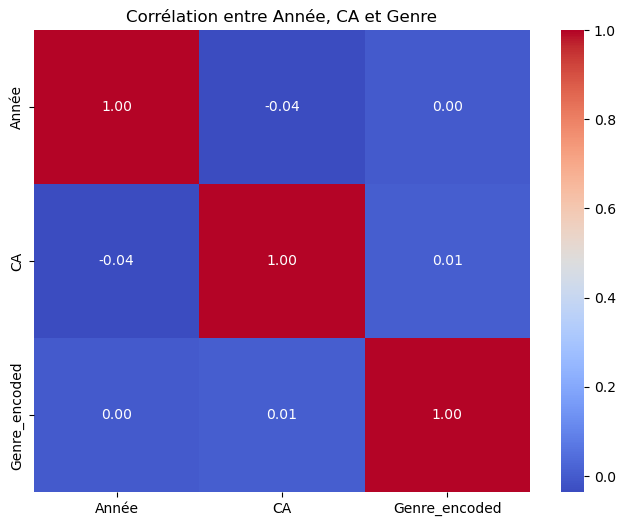

In [124]:
# Calcul de la matrice de corrélation
correlation_matrix = df_long[["Année", "CA", "Genre_encoded"]].corr()

# Affichage avec un heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Corrélation entre Année, CA et Genre")
plt.show()

In [125]:
# Convertir df_total_vente en format long
df_long_vente = df_total_vente.melt(id_vars=["Genre"], var_name="Année", value_name="Ventes")

# Convertir l'année en entier
df_long_vente["Année"] = df_long_vente["Année"].astype(int)

In [126]:
# Fusionner les deux DataFrames sur Genre et Année
df_final = pd.merge(df_long, df_long_vente, on=["Genre", "Année"], how="inner")

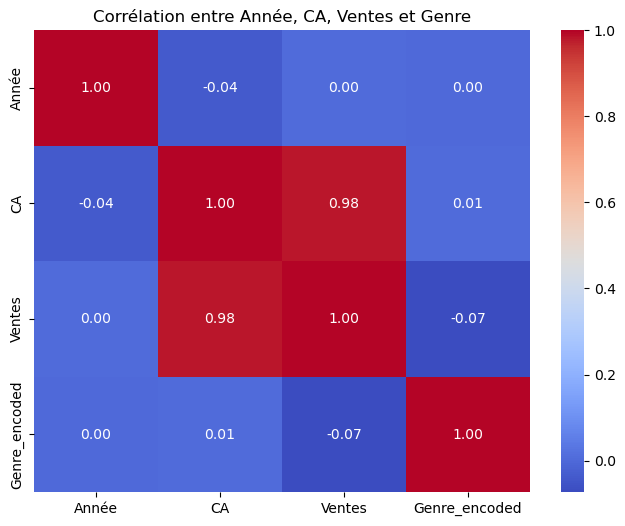

In [127]:
# Ajout de l'encodage du Genre
df_final["Genre_encoded"] = encoder.transform(df_final["Genre"])

# Calcul de la corrélation
correlation_matrix = df_final[["Année", "CA", "Ventes", "Genre_encoded"]].corr()

# Affichage avec un heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Corrélation entre Année, CA, Ventes et Genre")
plt.show()

# Import Données

In [129]:
# Import Data Marché
sheets_dict = pd.read_excel("P10/DATA WIP 032025.xlsx", sheet_name=None)

In [130]:
# Afficher les noms des feuilles
print(sheets_dict.keys())

dict_keys(['Jeux', 'Ventes Jeux', 'Ventes Consoles', 'Feuil6', 'Année Jeux Ventes', 'Genre Jeux Ventes', 'Constructeur', 'GENRE', 'PLATEFORME'])


In [131]:
for sheets_name, df in sheets_dict.items():
    print(f"Feuille : {sheets_name}")
    print(df.head())  # Affiche les premières lignes de chaque feuille

Feuille : Jeux
   Colonne1                         slug                           name  \
0     29498                malvinas-2032                  Malvinas 2032   
1     30825  panzer-campaigns-kharkov-42  Panzer Campaigns: Kharkov '42   
2     32619                      hellboy                        Hellboy   
3     32628                 masque-slots                   Masque Slots   
4     54661                 hoyle-casino                   Hoyle Casino   

   metacritic   released  Annee  rating  rating_top  playtime  \
0         NaN 2000-01-01   2000     0.0         0.0       0.0   
1         NaN 2000-01-01   2000     0.0         0.0       0.0   
2         NaN 2000-01-01   2000     0.0         0.0       0.0   
3         NaN 2000-01-01   2000     0.0         0.0       0.0   
4         NaN 2000-01-01   2000     0.0         0.0       0.0   

   achievements_count  ratings_count  suggestions_count  game_series_count  \
0                 0.0            0.0              210.0          

## Jeux

In [133]:
# Accéder à une feuille spécifique
df_jeux = sheets_dict["Jeux"]
print(df_jeux.head())  # Afficher les premières lignes


   Colonne1                         slug                           name  \
0     29498                malvinas-2032                  Malvinas 2032   
1     30825  panzer-campaigns-kharkov-42  Panzer Campaigns: Kharkov '42   
2     32619                      hellboy                        Hellboy   
3     32628                 masque-slots                   Masque Slots   
4     54661                 hoyle-casino                   Hoyle Casino   

   metacritic   released  Annee  rating  rating_top  playtime  \
0         NaN 2000-01-01   2000     0.0         0.0       0.0   
1         NaN 2000-01-01   2000     0.0         0.0       0.0   
2         NaN 2000-01-01   2000     0.0         0.0       0.0   
3         NaN 2000-01-01   2000     0.0         0.0       0.0   
4         NaN 2000-01-01   2000     0.0         0.0       0.0   

   achievements_count  ratings_count  suggestions_count  game_series_count  \
0                 0.0            0.0              210.0                0.0   
1 

In [134]:
#Afficher les dimensions du dataset historique
print("Le tableau comporte {} observation(s) ou article(s)".format(df_jeux.shape[0]))
print("Le tableau comporte {} colonne(s)".format(df_jeux.shape[1]))
print()

#La nature des données historique dans chacune des colonnes
nature_des_donnees_jeux = df_jeux.dtypes
print("Nature des données de chaque colonne :")
print(nature_des_donnees_jeux)
print()


Le tableau comporte 440896 observation(s) ou article(s)
Le tableau comporte 66 colonne(s)

Nature des données de chaque colonne :
Colonne1                      int64
slug                         object
name                         object
metacritic                  float64
released             datetime64[ns]
                          ...      
Commodore / Amiga           float64
Atari 26                    float64
Atari ST                    float64
Atari 78                    float64
SEGA Saturn                 float64
Length: 66, dtype: object



In [135]:
#Le nombre de valeurs présentes dans chacune des colonnes
nombre_de_valeurs_jeux = df_jeux.count()
print("Nombre de valeurs présentes dans chaque colonne :")
print(nombre_de_valeurs_jeux)
print()

# le nombre de valeurs nulles
df_jeux.isnull().sum()

Nombre de valeurs présentes dans chaque colonne :
Colonne1             440896
slug                 440880
name                 440885
metacritic             4627
released             440896
                      ...  
Commodore / Amiga        19
Atari 26                  7
Atari ST                  6
Atari 78                  2
SEGA Saturn               3
Length: 66, dtype: int64



Colonne1                  0
slug                     16
name                     11
metacritic           436269
released                  0
                      ...  
Commodore / Amiga    440877
Atari 26             440889
Atari ST             440890
Atari 78             440894
SEGA Saturn          440893
Length: 66, dtype: int64

In [136]:
#Nombre de caractéristiques
for col in df_jeux.columns:
    print(f"Occurrences des valeurs uniques dans la colonne '{col}':")
    print(df_jeux[col].value_counts(dropna=False))  # dropna=False pour inclure les NaN
print()

Occurrences des valeurs uniques dans la colonne 'Colonne1':
Colonne1
29498     1
369415    1
367106    1
369418    1
369419    1
         ..
93636     1
174327    1
118525    1
169807    1
9667      1
Name: count, Length: 440896, dtype: int64
Occurrences des valeurs uniques dans la colonne 'slug':
slug
NaN                        16
01/02/2023                  2
-6                          2
malvinas-2032               1
grand-brix-shooter          1
                           ..
greeenhouse-dystopia        1
westwood-hills-hospital     1
galvanica                   1
battery-boy-cihy            1
love-money-rocknroll        1
Name: count, Length: 440879, dtype: int64
Occurrences des valeurs uniques dans la colonne 'name':
name
NaN                         11
1                            3
3                            3
10                           3
0                            3
                            ..
Greeenhouse Dystopia         1
Westwood Hills Hospital      1
Galvanica      

In [137]:
# Statistique descriptif pour les transactions
df_jeux.describe()

,Colonne1,metacritic,released,Annee,rating,rating_top,playtime,achievements_count,ratings_count,suggestions_count,game_series_count,reviews_count,added_status_yet,added_status_owned,added_status_beaten,added_status_toplay,added_status_dropped,added_status_playing,PC,macOS,iOS,Web,Linux,Xbox One,Android,PS Vita,PlayStation 4,Nintendo Switch,PlayStation 2,Wii U,PlayStation 3,Xbox 36,GameCube,Wii,Xbox,Genesis,Neo Geo,Nintendo 3DS,PlayStation,PSP,Nintendo DS,Game Boy Advance,Game Boy Color,Game Boy,Nintendo DSi,SNES,SEGA Master System,Nintendo 64,Classic Macintosh,Apple II,NES,Dreamcast,PlayStation 5,Xbox Series S/X,Commodore / Amiga,Atari 26,Atari ST,Atari 78,SEGA Saturn
count,440896.000000,4627.000000,440896,440896.000000,440833.000000,440833.000000,440833.000000,440833.000000,440833.000000,440833.000000,440833.000000,440833.000000,440792.000000,440792.000000,440792.000000,440792.000000,440792.000000,440792.000000,258865.0,59604.0,67002.0,111506.0,41578.0,3798.0,23084.0,1670.0,5087.0,3758.0,1455.0,1038.0,3177.0,2370.0,598.0,2741.0,6316.0,18.0,20.0,1478.0,9241.0,1281.0,2126.0,672.0,152.0,814.0,22.0,17.0,4.0,64.0,175.0,5.0,46.0,183.0,46.0,43.0,19.0,7.0,6.0,2.0,3.0
mean,271374.207087,72.998271,2017-12-07 11:46:04.602990080,2017.416815,0.078205,0.089635,0.211282,4.627621,2.135571,85.633966,0.038355,2.155469,0.689418,11.502564,1.335321,0.397607,0.669345,0.152519,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
min,1.000000,15.000000,2000-01-01 00:00:00,2000.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
25%,138307.500000,67.000000,2016-11-20 00:00:00,2016.000000,0.000000,0.000000,0.000000,0.000000,0.000000,15.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
50%,274090.500000,75.000000,2018-09-04 00:00:00,2018.000000,0.000000,0.000000,0.000000,0.000000,0.000000,43.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
75%,411493.250000,81.000000,2020-02-05 00:00:00,2020.000000,0.000000,0.000000,0.000000,0.000000,0.000000,110.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
max,525548.000000,97.000000,2020-12-31 00:00:00,2020.000000,4.860000,5.000000,1600.000000,12322.000000,4289.000000,1427.000000,28.000000,4334.000000,635.000000,8298.000000,3533.000000,2325.000000,1092.000000,644.000000,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
std,154278.781394,11.408710,NaN,3.075394,0.517074,0.580517,4.918531,120.248760,37.495964,111.364271,0.716222,37.820067,9.187758,131.500059,29.227626,9.122239,10.750243,4.049147,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [138]:
df_jeux.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 440896 entries, 0 to 440895
Data columns (total 66 columns):
 #   Column                Non-Null Count   Dtype         
---  ------                --------------   -----         
 0   Colonne1              440896 non-null  int64         
 1   slug                  440880 non-null  object        
 2   name                  440885 non-null  object        
 3   metacritic            4627 non-null    float64       
 4   released              440896 non-null  datetime64[ns]
 5   Annee                 440896 non-null  int64         
 6   rating                440833 non-null  float64       
 7   rating_top            440833 non-null  float64       
 8   playtime              440833 non-null  float64       
 9   achievements_count    440833 non-null  float64       
 10  ratings_count         440833 non-null  float64       
 11  suggestions_count     440833 non-null  float64       
 12  game_series_count     440833 non-null  float64       
 13 

In [139]:

df_jeux_filtered = df_jeux[["name","metacritic","released","Annee","developers","genres","publishers","platforms"]]
display(df_jeux_filtered)  # Afficher les premières lignes

,name,metacritic,released,Annee,developers,genres,publishers,platforms
0,Malvinas 2032,NaN,2000-01-01,2000,Sabarasa Entertainment,Strategy,GarageDeveloper International,PC
1,Panzer Campaigns: Kharkov '42,NaN,2000-01-01,2000,HPS Simulations,Strategy,HPS Simulations,PC
2,Hellboy,NaN,2000-01-01,2000,Cryo Studios North America,Action||Adventure,Cryo Interactive Entertainment,PC
3,Masque Slots,NaN,2000-01-01,2000,Masque Publishing,NaN,Masque Publishing,PC
4,Hoyle Casino,NaN,2000-01-01,2000,Encore,NaN,Sierra Attractions,Dreamcast||Classic Macintosh||Game Boy Color||PC
...,...,...,...,...,...,...,...,...
440891,Super Meat Boy Forever,NaN,2020-12-23,2020,Team Meat,Action||Platformer,Team Meat,PC||Nintendo Switch||Xbox One||iOS||Android
440892,Isle of Dinosaurs 2D,NaN,2020-12-24,2020,Gali from Hell,Action||Adventure||Casual||Indie,Gali from Hell,Linux||macOS||PC
440893,Resistance,NaN,2020-12-25,2020,Siarhei Belyahou,Action||Adventure,Siarhei Belyahou,PC
440894,Discoverer,NaN,2020-12-30,2020,GEOMETRIC BYTES,Action||Adventure,GEOMETRIC BYTES,PC


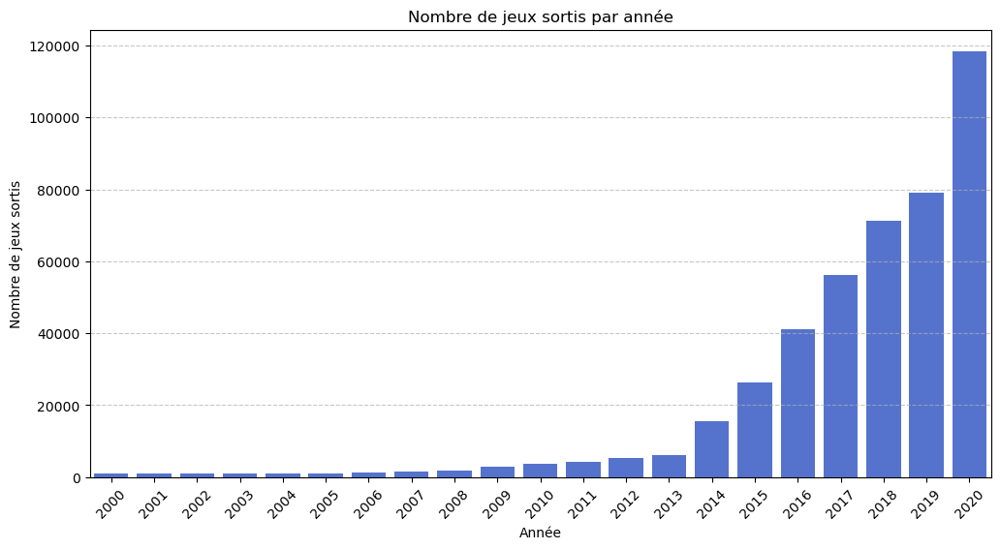

In [140]:
# Compter le nombre d'entrées par année
df_count_by_year = df_jeux_filtered["Annee"].value_counts().sort_index()

# Création du graphique
plt.figure(figsize=(12, 6))
sns.barplot(x=df_count_by_year.index, y=df_count_by_year.values, color="royalblue")

# Ajout des labels et titre
plt.xlabel("Année")
plt.ylabel("Nombre de jeux sortis")
plt.title("Nombre de jeux sortis par année")
plt.xticks(rotation=45)  # Rotation pour meilleure lisibilité
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Affichage du graphique
plt.show()

In [141]:
# S'assurer que la colonne "genres" est bien une chaîne de caractères
df_jeux_filtered["genres"] = df_jeux_filtered["genres"].astype(str)

# Remplacer les valeurs NaN ou vides par une chaîne vide pour éviter les erreurs
df_jeux_filtered["genres"] = df_jeux_filtered["genres"].fillna("")

# Transformer la colonne 'genres' en listes en séparant sur "||"
df_exploded = df_jeux_filtered.assign(genres=df_jeux_filtered["genres"].str.split(r"\|\|"))

# Transformer en un DataFrame avec une ligne par genre
df_genres = df_exploded.explode("genres")

# Supprimer les lignes vides générées accidentellement
df_genres = df_genres[df_genres["genres"].str.strip() != ""]

# Compter le nombre d'entrées par genre
df_genre_count = df_genres["genres"].value_counts().reset_index()

# Renommer les colonnes
df_genre_count.columns = ["Genre", "Nombre de jeux"]

# Afficher le DataFrame
display(df_genre_count)

C:\Users\Shiin\AppData\Local\Temp\ipykernel_29288\4255367360.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_jeux_filtered["genres"] = df_jeux_filtered["genres"].astype(str)
C:\Users\Shiin\AppData\Local\Temp\ipykernel_29288\4255367360.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_jeux_filtered["genres"] = df_jeux_filtered["genres"].fillna("")


,Genre,Nombre de jeux
0,nan,98902
1,Action,94066
2,Adventure,66687
3,Puzzle,53499
4,Platformer,47704
5,Simulation,37592
6,Shooter,30889
7,Strategy,29701
8,RPG,28403
9,Indie,26943


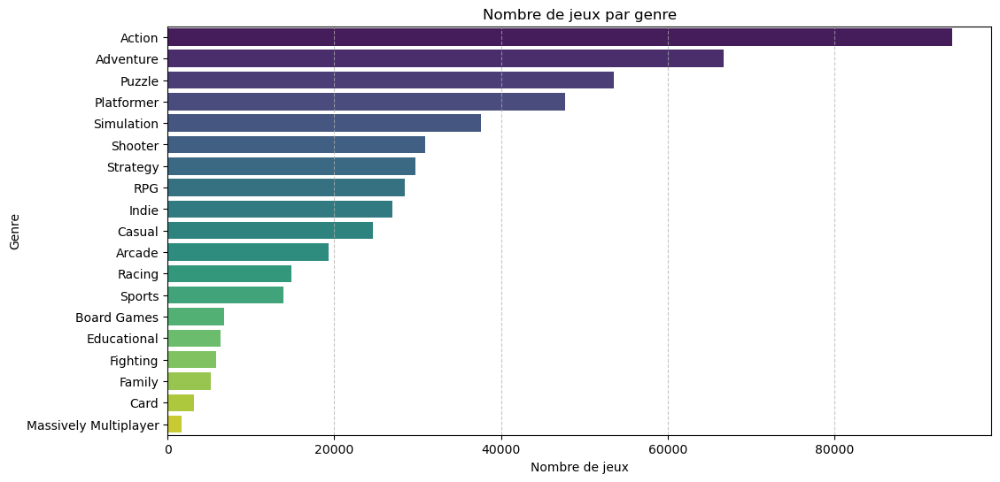

In [142]:
df_genre_count = df_genre_count.loc[df_genre_count["Genre"] != "nan"]

# Création du graphique à barres
plt.figure(figsize=(12, 6))
sns.barplot(data=df_genre_count, x="Nombre de jeux", y="Genre",hue="Genre", palette="viridis", legend=False)

# Ajout des étiquettes et titre
plt.xlabel("Nombre de jeux")
plt.ylabel("Genre")
plt.title("Nombre de jeux par genre")
plt.grid(axis='x', linestyle='--', alpha=0.7)

# Affichage du graphique
plt.show()

In [143]:
# S'assurer que la colonne "genres" est bien une chaîne de caractères
df_jeux_filtered["platforms"] = df_jeux_filtered["platforms"].astype(str)

# Remplacer les valeurs NaN ou vides par une chaîne vide pour éviter les erreurs
df_jeux_filtered["platforms"] = df_jeux_filtered["platforms"].fillna("")

# Transformer la colonne 'genres' en listes en séparant sur "||"
df_exploded = df_jeux_filtered.assign(platforms=df_jeux_filtered["platforms"].str.split(r"\|\|"))

# Transformer en un DataFrame avec une ligne par genre
df_platforms = df_exploded.explode("platforms")

# Supprimer les lignes vides générées accidentellement
df_platforms = df_platforms[df_platforms["platforms"].str.strip() != ""]

# Compter le nombre d'entrées par genre
df_platform_count = df_platforms["platforms"].value_counts().reset_index()

# Renommer les colonnes
df_platform_count.columns = ["Plateforme", "Nombre de jeux"]

# Afficher le DataFrame
display(df_platform_count)

C:\Users\Shiin\AppData\Local\Temp\ipykernel_29288\1910933896.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_jeux_filtered["platforms"] = df_jeux_filtered["platforms"].astype(str)
C:\Users\Shiin\AppData\Local\Temp\ipykernel_29288\1910933896.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_jeux_filtered["platforms"] = df_jeux_filtered["platforms"].fillna("")


,Plateforme,Nombre de jeux
0,PC,258865
1,Web,111506
2,iOS,67002
3,macOS,59604
4,Linux,41578
5,Android,23084
6,PlayStation 4,5087
7,Xbox One,3798
8,Nintendo Switch,3758
9,nan,3423


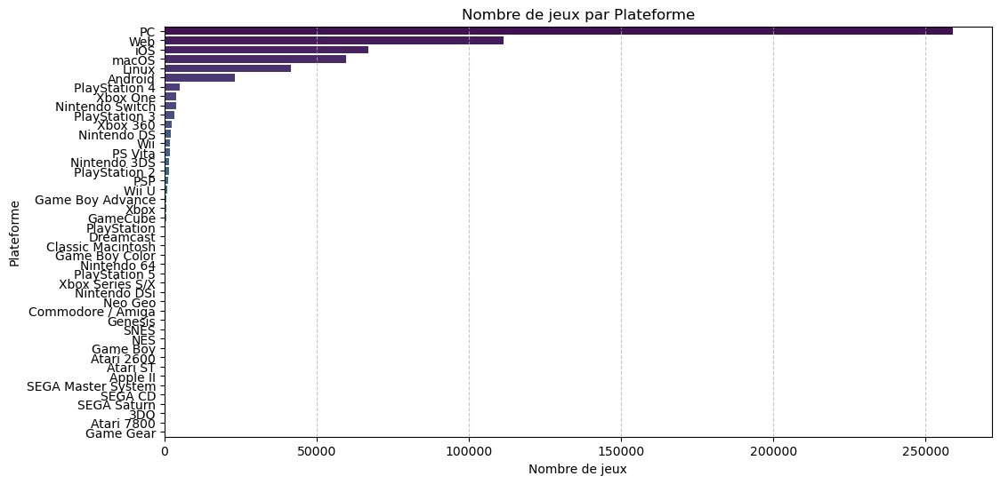

In [144]:
df_platform_count = df_platform_count.loc[df_platform_count["Plateforme"] != "nan"]

# Création du graphique à barres
plt.figure(figsize=(12, 6))
sns.barplot(data=df_platform_count, x="Nombre de jeux", y="Plateforme",hue="Plateforme", palette="viridis", legend=False)

# Ajout des étiquettes et titre
plt.xlabel("Nombre de jeux")
plt.ylabel("Plateforme")
plt.title("Nombre de jeux par Plateforme")
plt.grid(axis='x', linestyle='--', alpha=0.7)

# Affichage du graphique
plt.show()

In [145]:
# Supprimer les NaN et transformer en liste de genres
df_genres_annee = df_jeux_filtered
display(df_genres_annee)

,name,metacritic,released,Annee,developers,genres,publishers,platforms
0,Malvinas 2032,NaN,2000-01-01,2000,Sabarasa Entertainment,Strategy,GarageDeveloper International,PC
1,Panzer Campaigns: Kharkov '42,NaN,2000-01-01,2000,HPS Simulations,Strategy,HPS Simulations,PC
2,Hellboy,NaN,2000-01-01,2000,Cryo Studios North America,Action||Adventure,Cryo Interactive Entertainment,PC
3,Masque Slots,NaN,2000-01-01,2000,Masque Publishing,nan,Masque Publishing,PC
4,Hoyle Casino,NaN,2000-01-01,2000,Encore,nan,Sierra Attractions,Dreamcast||Classic Macintosh||Game Boy Color||PC
...,...,...,...,...,...,...,...,...
440891,Super Meat Boy Forever,NaN,2020-12-23,2020,Team Meat,Action||Platformer,Team Meat,PC||Nintendo Switch||Xbox One||iOS||Android
440892,Isle of Dinosaurs 2D,NaN,2020-12-24,2020,Gali from Hell,Action||Adventure||Casual||Indie,Gali from Hell,Linux||macOS||PC
440893,Resistance,NaN,2020-12-25,2020,Siarhei Belyahou,Action||Adventure,Siarhei Belyahou,PC
440894,Discoverer,NaN,2020-12-30,2020,GEOMETRIC BYTES,Action||Adventure,GEOMETRIC BYTES,PC


<Figure size 1200x800 with 0 Axes>

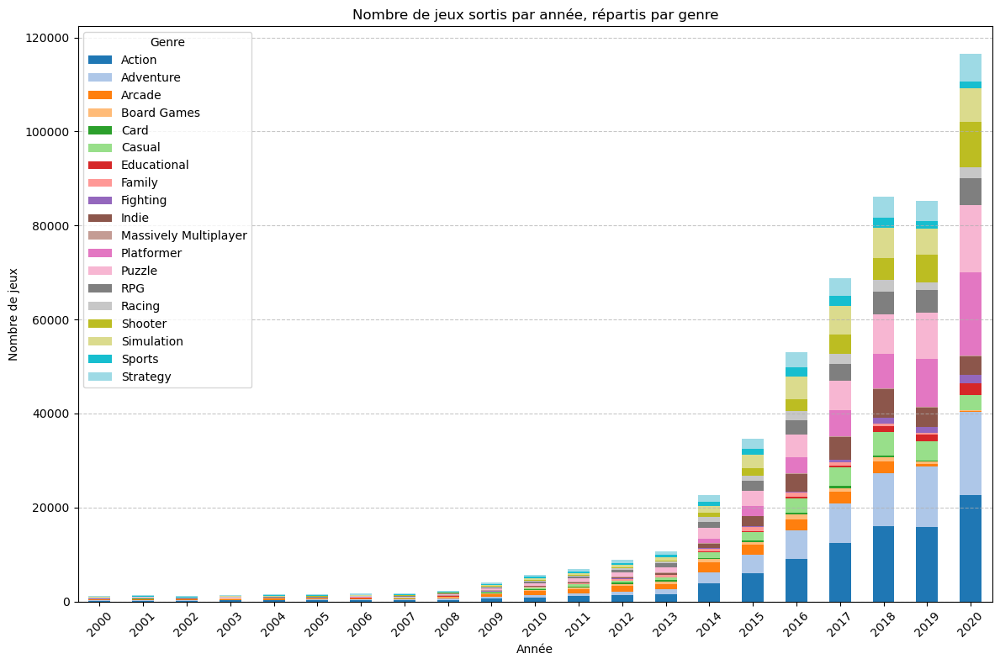

In [146]:
# Suppression des NaN et transformation en liste de genres
df_genres_annee = df_jeux_filtered.dropna(subset=["genres", "Annee"]).copy()
df_genres_annee = df_genres_annee.loc[df_genres_annee["genres"] != "nan"]

# Explosion des genres pour séparer chaque genre
df_genres_annee["genres"] = df_genres_annee["genres"].astype(str).str.split(r"\|\|")

# Suppression des genres vides ou NaN
df_genres_annee = df_genres_annee[df_genres_annee["genres"].apply(lambda x: len(x) > 0 and all(pd.notna(g) and g.strip() != "" for g in x))]

# Convertir Annee en entier
df_genres_annee["Annee"] = df_genres_annee["Annee"].astype(int)

# Explosion des genres pour compter chaque occurrence séparément
df_genres_annee = df_genres_annee.explode("genres")

# Compter le nombre de jeux par année et par genre
df_genre_by_year = df_genres_annee.groupby(["Annee", "genres"]).size().reset_index(name="Nombre de jeux")

# Transformer en table pivot pour un stacked bar chart
df_pivot = df_genre_by_year.pivot(index="Annee", columns="genres", values="Nombre de jeux").fillna(0)

# Création du graphique
plt.figure(figsize=(12, 8))
ax = df_pivot.plot(kind="bar", stacked=True, colormap="tab20", figsize=(12, 8))

# Ajout des étiquettes et titre
plt.xlabel("Année")
plt.ylabel("Nombre de jeux")
plt.title("Nombre de jeux sortis par année, répartis par genre")
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Déplacement de la légende en haut au centre
plt.legend(title="Genre", loc="upper left", ncol=1)

# Affichage du graphique
plt.tight_layout()
plt.show()

<Figure size 1400x800 with 0 Axes>

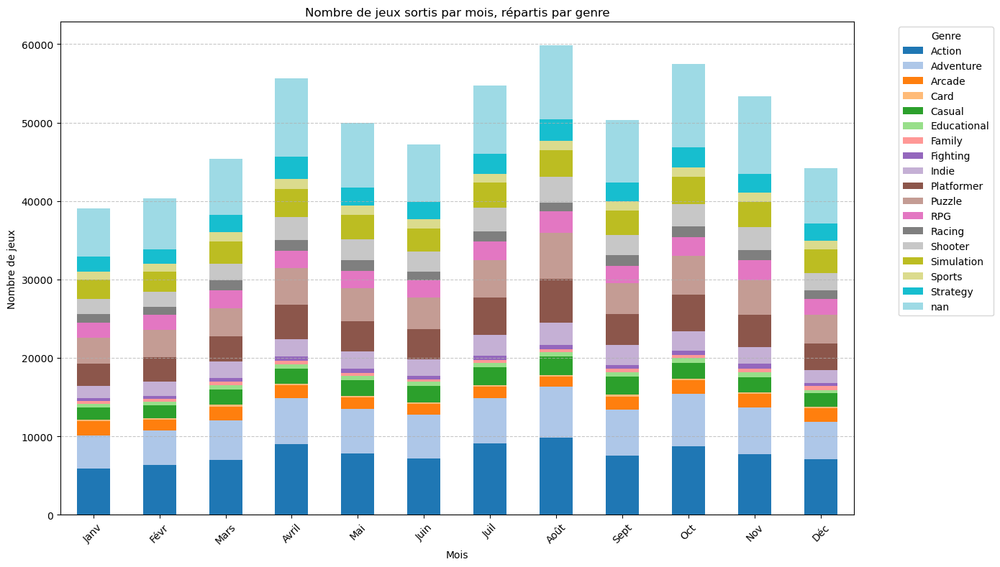

In [148]:
# Suppression des NaN et transformation en liste de genres
df_genres_annee = df_jeux_filtered.dropna(subset=["genres", "released"]).copy()

# Convertir la colonne 'released' en datetime
df_genres_annee['released'] = pd.to_datetime(df_genres_annee['released'], errors='coerce')

# Créer une nouvelle colonne 'released_month' avec uniquement le mois (1 à 12)
df_genres_annee['released_month'] = df_genres_annee['released'].dt.month

# Suppression des genres vides ou NaN
df_genres_annee = df_genres_annee[df_genres_annee["genres"].apply(lambda x: len(x) > 0 and all(pd.notna(g) and g.strip() != "" for g in x))]

# Explosion des genres pour séparer chaque genre
df_genres_annee["genres"] = df_genres_annee["genres"].astype(str).str.split(r"\|\|")

# Explosion des genres pour compter chaque occurrence séparément
df_genres_annee = df_genres_annee.explode("genres")

# Compter le nombre de jeux par mois et par genre
df_genre_by_month = df_genres_annee.groupby(["released_month", "genres"]).size().reset_index(name="Nombre de jeux")

# Transformer en table pivot pour un stacked bar chart
df_pivot = df_genre_by_month.pivot(index="released_month", columns="genres", values="Nombre de jeux").fillna(0)

# Créer une liste des mois en français
mois_francais = ["Janv", "Févr", "Mars", "Avril", "Mai", "Juin", "Juil", "Août", "Sept", "Oct", "Nov", "Déc"]

# Création du graphique
plt.figure(figsize=(14, 8))
ax = df_pivot.plot(kind="bar", stacked=True, colormap="tab20", figsize=(14, 8))

# Ajout des étiquettes et titre
plt.xlabel("Mois")
plt.ylabel("Nombre de jeux")
plt.title("Nombre de jeux sortis par mois, répartis par genre")
plt.xticks(ticks=range(12), labels=mois_francais, rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Déplacement de la légende en haut au centre
plt.legend(bbox_to_anchor=(1.05, 1), title="Genre", loc="upper left", ncol=1)

# Affichage du graphique
plt.tight_layout()
plt.show()

<Figure size 1200x800 with 0 Axes>

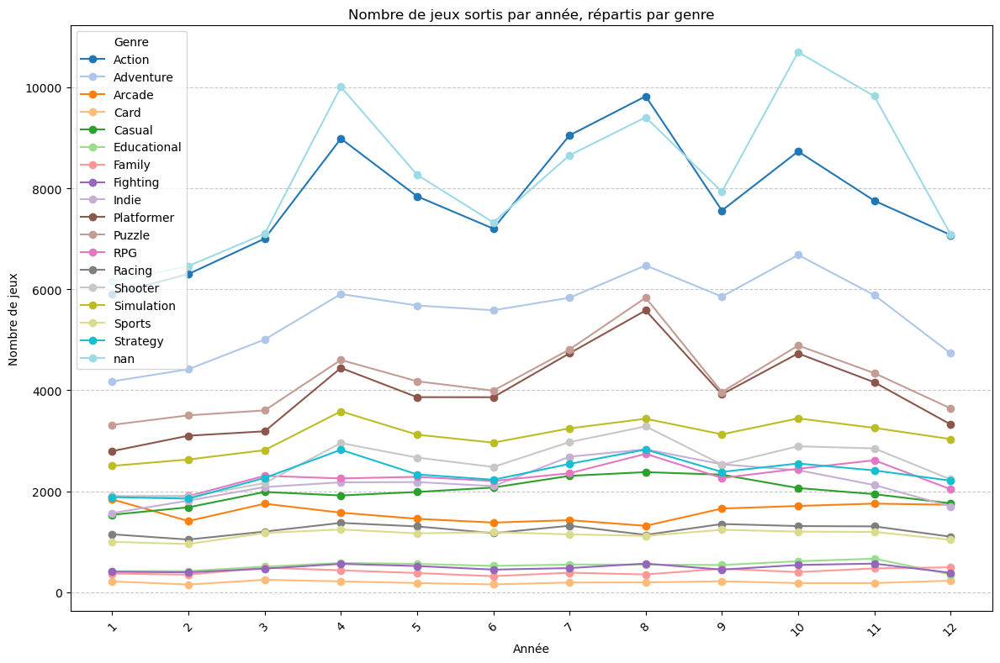

In [149]:
# Création du graphique en lignes
plt.figure(figsize=(12, 8))
ax = df_pivot.plot(kind="line", marker="o", figsize=(12, 8), colormap="tab20")

# Ajout des étiquettes et titre
plt.xlabel("Année")
plt.ylabel("Nombre de jeux")
plt.title("Nombre de jeux sortis par année, répartis par genre")
plt.xticks(df_pivot.index, rotation=45)  # Assurez-vous que toutes les années sont affichées
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Déplacement de la légende en haut au centre
plt.legend(title="Genre", loc="upper left", ncol=1)

# Affichage du graphique
plt.tight_layout()
plt.show()

In [150]:
# Suppression des NaN et transformation en liste de genres
df_platforms_genre = df_jeux_filtered.dropna(subset=["platforms", "genres"]).copy()
df_platforms_genre = df_platforms_genre.loc[df_platforms_genre["genres"] != "nan"]
df_platforms_genre = df_platforms_genre.loc[df_platforms_genre["platforms"] != "nan"]

# Explosion des genres pour séparer chaque genre
df_platforms_genre["genres"] = df_platforms_genre["genres"].astype(str).str.split(r"\|\|")
df_platforms_genre["platforms"] = df_platforms_genre["platforms"].astype(str).str.split(r"\|\|")

# Suppression des genres vides ou NaN
df_platforms_genre = df_platforms_genre[df_platforms_genre["genres"].apply(lambda x: len(x) > 0 and all(pd.notna(g) and g.strip() != "" for g in x))]
df_platforms_genre = df_platforms_genre[df_platforms_genre["platforms"].apply(lambda x: len(x) > 0 and all(pd.notna(g) and g.strip() != "" for g in x))]

# Explosion des genres pour compter chaque occurrence séparément
df_platforms_genre = df_platforms_genre.explode("genres")
df_platforms_genre = df_platforms_genre.explode("platforms")

display(df_platforms_genre)

,name,metacritic,released,Annee,developers,genres,publishers,platforms
0,Malvinas 2032,NaN,2000-01-01,2000,Sabarasa Entertainment,Strategy,GarageDeveloper International,PC
1,Panzer Campaigns: Kharkov '42,NaN,2000-01-01,2000,HPS Simulations,Strategy,HPS Simulations,PC
2,Hellboy,NaN,2000-01-01,2000,Cryo Studios North America,Action,Cryo Interactive Entertainment,PC
2,Hellboy,NaN,2000-01-01,2000,Cryo Studios North America,Adventure,Cryo Interactive Entertainment,PC
5,Evolution: The World of Sacred Device,NaN,2000-01-01,2000,Sting||Sting Entertainment,RPG,Ubisoft Entertainment||Entertainment Software ...,Dreamcast
...,...,...,...,...,...,...,...,...
440895,"Love, Money, Rock'n'Roll",NaN,2020-12-31,2020,Soviet Games||SovietGames,Casual,Soviet Games,Android
440895,"Love, Money, Rock'n'Roll",NaN,2020-12-31,2020,Soviet Games||SovietGames,Indie,Soviet Games,Linux
440895,"Love, Money, Rock'n'Roll",NaN,2020-12-31,2020,Soviet Games||SovietGames,Indie,Soviet Games,macOS
440895,"Love, Money, Rock'n'Roll",NaN,2020-12-31,2020,Soviet Games||SovietGames,Indie,Soviet Games,PC


<Figure size 1200x800 with 0 Axes>

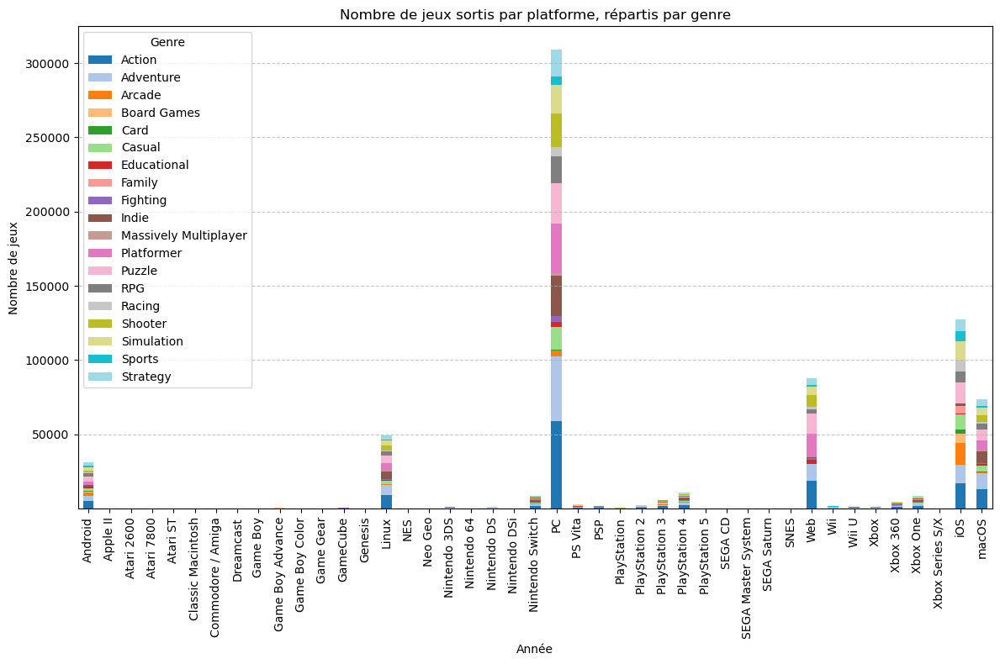

In [151]:
# Compter le nombre de jeux par année et par genre
df_genre_by_platform = df_platforms_genre.groupby(["platforms", "genres"]).size().reset_index(name="Nombre de jeux")

# Transformer en table pivot pour un stacked bar chart
df_pivot = df_genre_by_platform.pivot(index="platforms", columns="genres", values="Nombre de jeux").fillna(0)

# Création du graphique
plt.figure(figsize=(12, 8))
ax = df_pivot.plot(kind="bar", stacked=True, colormap="tab20", figsize=(12, 8))

# Ajout des étiquettes et titre
plt.xlabel("Année")
plt.ylabel("Nombre de jeux")
plt.title("Nombre de jeux sortis par platforme, répartis par genre")
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Déplacement de la légende en haut au centre
plt.legend(title="Genre", loc="upper left", ncol=1)

# Affichage du graphique
plt.tight_layout()
plt.show()

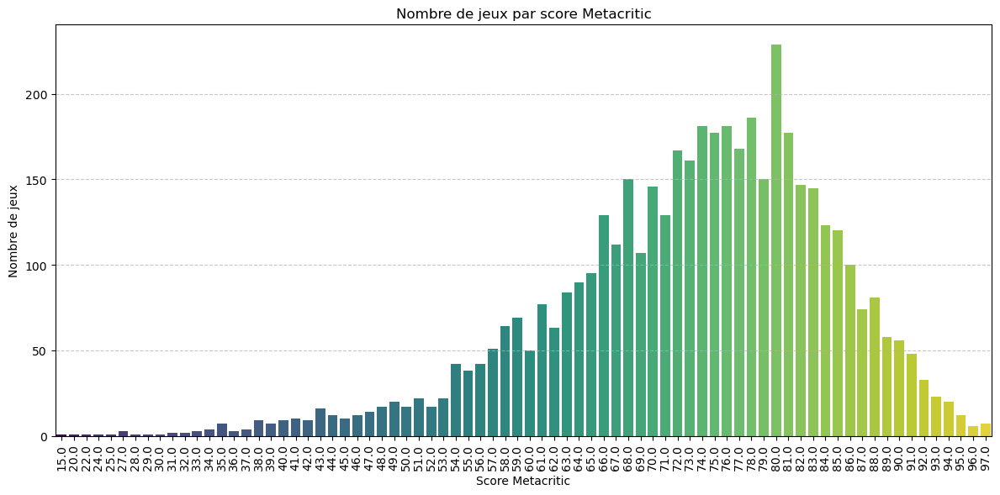

In [152]:

# Comptage du nombre d'entrées par Metacritic
df_metacritic_count = df_jeux_filtered['metacritic'].value_counts().reset_index()
df_metacritic_count.columns = ['Metacritic', 'Nombre de jeux']

# Création du graphique à barres
plt.figure(figsize=(12, 6))
sns.barplot(data=df_metacritic_count, x='Metacritic', y='Nombre de jeux',hue='Metacritic', palette='viridis', legend=False)

# Ajout des étiquettes et titre
plt.xlabel("Score Metacritic")
plt.ylabel("Nombre de jeux")
plt.title("Nombre de jeux par score Metacritic")
plt.xticks(rotation=90)  # Rotation des ticks pour la lisibilité
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Affichage du graphique
plt.tight_layout()
plt.show()

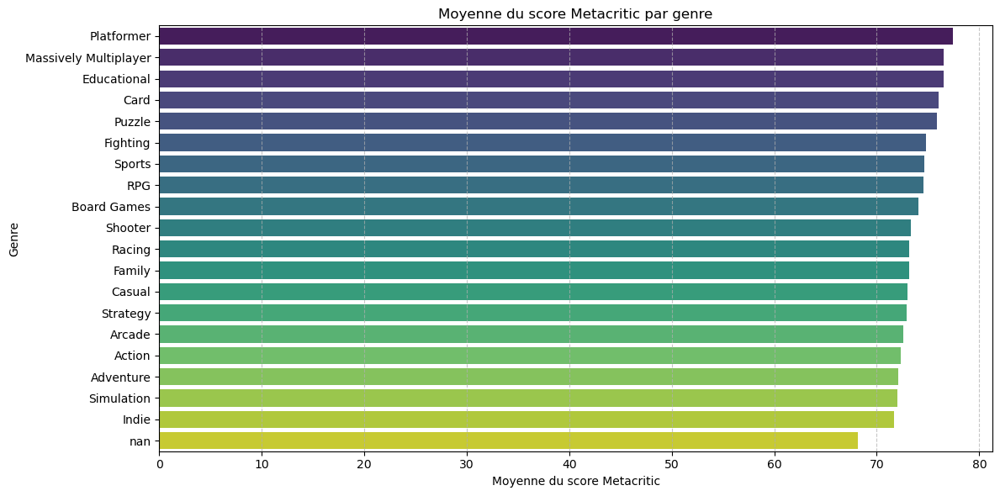

In [153]:

# Suppression des NaN et transformation en liste de genres
df_genres = df_jeux_filtered.dropna(subset=["genres", "metacritic"]).copy()

# Explosion des genres pour séparer chaque genre
df_genres["genres"] = df_genres["genres"].astype(str).str.split(r"\|\|")
df_genres = df_genres.explode("genres")

# Suppression des genres vides
df_genres = df_genres[df_genres["genres"].str.strip() != ""]

# Calcul de la moyenne du score Metacritic par genre
df_genre_metacritic = df_genres.groupby("genres")["metacritic"].mean().reset_index()

# Tri des genres par score Metacritic moyen décroissant
df_genre_metacritic = df_genre_metacritic.sort_values(by="metacritic", ascending=False)

# Création du graphique à barres
plt.figure(figsize=(12, 6))
sns.barplot(data=df_genre_metacritic, x="metacritic", y="genres", palette="viridis", hue="genres", legend=False)

# Ajout des étiquettes et titre
plt.xlabel("Moyenne du score Metacritic")
plt.ylabel("Genre")
plt.title("Moyenne du score Metacritic par genre")
plt.grid(axis='x', linestyle='--', alpha=0.7)

# Affichage du graphique
plt.tight_layout()
plt.show()

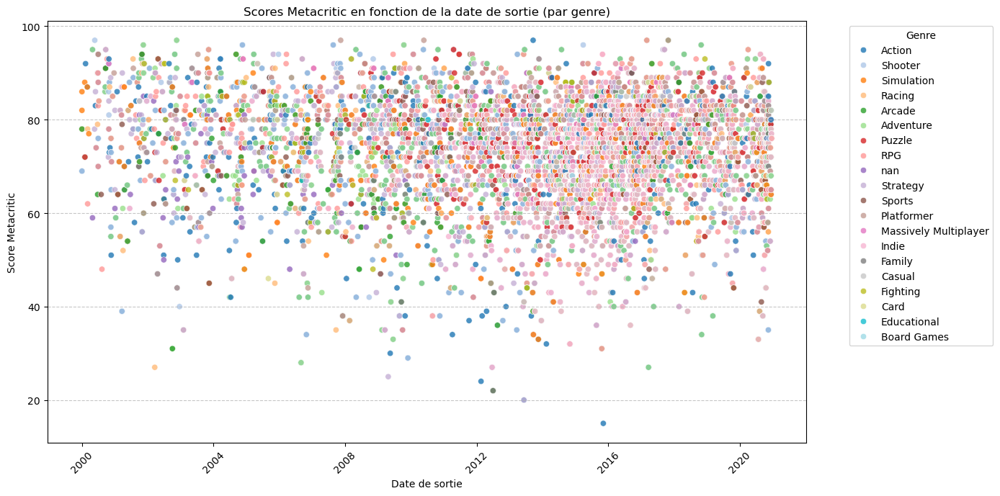

In [154]:
# Suppression des NaN pour released, metacritic et genres
df_metacritic_genres = df_jeux_filtered.dropna(subset=["released", "metacritic", "genres"]).copy()

# Conversion de la colonne released en format datetime
df_metacritic_genres["released"] = pd.to_datetime(df_metacritic_genres["released"], errors='coerce')

# Suppression des valeurs non convertibles (NaT)
df_metacritic_genres = df_metacritic_genres.dropna(subset=["released"])

# Explosion des genres (certains jeux ont plusieurs genres séparés par "||")
df_metacritic_genres["genres"] = df_metacritic_genres["genres"].astype(str).str.split(r"\|\|")
df_metacritic_genres = df_metacritic_genres.explode("genres")

# Création d'une palette avec suffisamment de couleurs pour 20+ genres
unique_genres = df_metacritic_genres["genres"].unique()
palette = sns.color_palette("tab20", len(unique_genres))  # tab20 a 20 couleurs bien contrastées
genre_color_map = dict(zip(unique_genres, palette))  # Associer chaque genre à une couleur

# Création du scatterplot
plt.figure(figsize=(14, 7))
sns.scatterplot(data=df_metacritic_genres, x="released", y="metacritic", hue="genres", alpha=0.8, palette=genre_color_map)

# Ajout des étiquettes et titre
plt.xlabel("Date de sortie")
plt.ylabel("Score Metacritic")
plt.title("Scores Metacritic en fonction de la date de sortie (par genre)")
plt.xticks(rotation=45)  # Rotation des dates pour plus de lisibilité
plt.legend(title="Genre", bbox_to_anchor=(1.05, 1), loc='upper left')  # Légende à droite
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Affichage du graphique
plt.tight_layout()
plt.show()

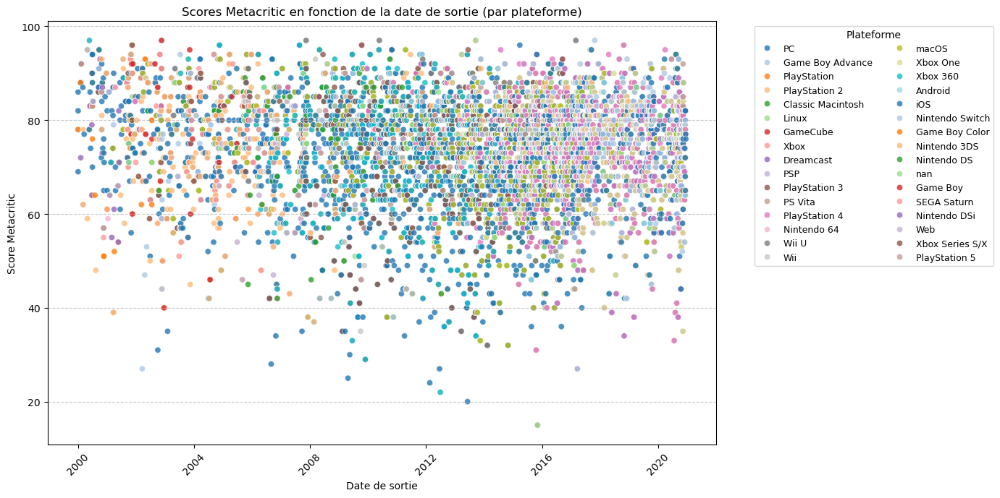

In [155]:

# Suppression des NaN pour released, metacritic et platforms
df_metacritic_platforms = df_jeux_filtered.dropna(subset=["released", "metacritic", "platforms"]).copy()

# Conversion de la colonne released en format datetime
df_metacritic_platforms["released"] = pd.to_datetime(df_metacritic_platforms["released"], errors='coerce')

# Suppression des valeurs non convertibles (NaT)
df_metacritic_platforms = df_metacritic_platforms.dropna(subset=["released"])

# Explosion des plateformes (certains jeux sont sur plusieurs plateformes séparées par "||")
df_metacritic_platforms["platforms"] = df_metacritic_platforms["platforms"].astype(str).str.split(r"\|\|")
df_metacritic_platforms = df_metacritic_platforms.explode("platforms")

# Création d'une palette avec suffisamment de couleurs pour les plateformes
unique_platforms = df_metacritic_platforms["platforms"].unique()
palette = sns.color_palette("tab20", len(unique_platforms))  # tab20 a 20 couleurs contrastées
platform_color_map = dict(zip(unique_platforms, palette))  # Associer chaque plateforme à une couleur

# Création du scatterplot
plt.figure(figsize=(14, 7))
sns.scatterplot(
    data=df_metacritic_platforms, 
    x="released", 
    y="metacritic", 
    hue="platforms", 
    palette=platform_color_map, 
    alpha=0.8,
)

# Ajout des étiquettes et titre
plt.xlabel("Date de sortie")
plt.ylabel("Score Metacritic")
plt.title("Scores Metacritic en fonction de la date de sortie (par plateforme)")
plt.xticks(rotation=45)  # Rotation des dates pour plus de lisibilité
plt.legend(title="Plateforme", bbox_to_anchor=(1.05, 1), loc='upper left', ncol=2, fontsize=9)  # Légende optimisée
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Affichage du graphique
plt.tight_layout()
plt.show()

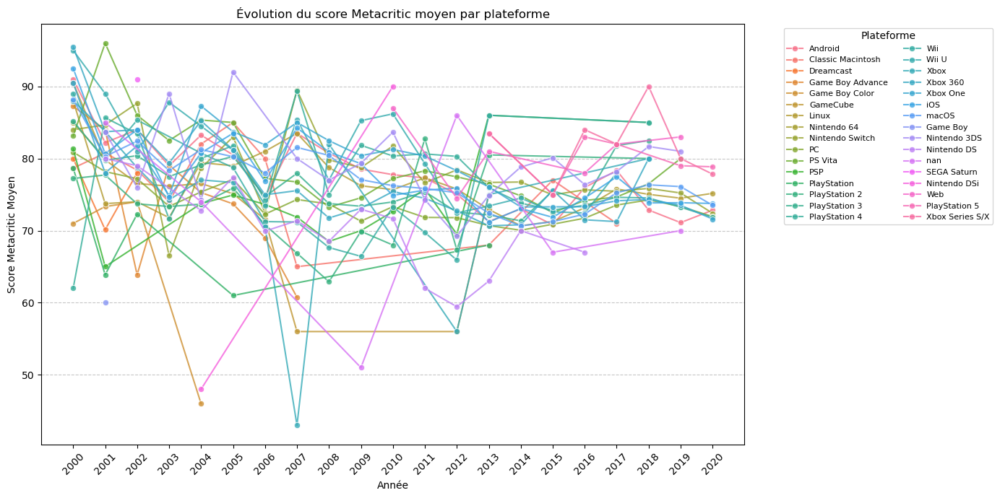

In [157]:

# Suppression des NaN pour released, metacritic et platforms
df_metacritic_platforms = df_jeux_filtered.dropna(subset=["released", "metacritic", "platforms"]).copy()

# Conversion de la colonne released en format datetime
df_metacritic_platforms["released"] = pd.to_datetime(df_metacritic_platforms["released"], errors='coerce')

# Suppression des valeurs non convertibles (NaT)
df_metacritic_platforms = df_metacritic_platforms.dropna(subset=["released"])

# Format Mois-Année pour l'axe X
df_metacritic_platforms["Année"] = df_metacritic_platforms["Annee"]

# Explosion des plateformes (certains jeux sortent sur plusieurs plateformes)
df_metacritic_platforms["platforms"] = df_metacritic_platforms["platforms"].astype(str).str.split(r"\|\|")
df_metacritic_platforms = df_metacritic_platforms.explode("platforms")

# Calcul de la moyenne des scores Metacritic par Mois-Année et par plateforme
df_avg_metacritic = df_metacritic_platforms.groupby(["Année", "platforms"])["metacritic"].mean().reset_index()

# Conversion en string pour un affichage correct
df_avg_metacritic["Année"] = df_avg_metacritic["Année"].astype(str)

# Génération d'une palette de couleurs pour chaque plateforme (unique et lisible)
unique_platforms = df_avg_metacritic["platforms"].unique()
num_platforms = len(unique_platforms)

# Générer une palette avec suffisamment de couleurs
palette = sns.color_palette("husl", num_platforms)  # husl offre une bonne différenciation des couleurs
platform_color_map = dict(zip(unique_platforms, palette))  # Associer chaque plateforme à une couleur

# Création du graphique
plt.figure(figsize=(14, 7))
sns.lineplot(
    data=df_avg_metacritic, 
    x="Année", 
    y="metacritic", 
    hue="platforms", 
    palette=platform_color_map, 
    marker="o",
    alpha=0.8  # Améliore la lisibilité en cas de superposition
)

# Ajout des étiquettes et titre
plt.xlabel("Année")
plt.ylabel("Score Metacritic Moyen")
plt.title("Évolution du score Metacritic moyen par plateforme")
plt.xticks(rotation=45)  # Rotation pour la lisibilité
plt.legend(title="Plateforme", bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=8, ncol=2)  # Légende optimisée
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Affichage du graphique
plt.tight_layout()
plt.show()

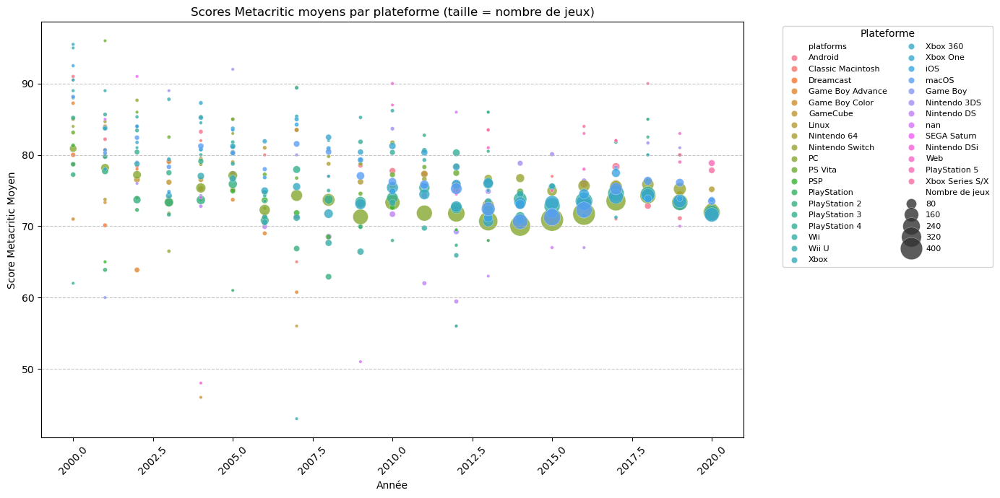

In [158]:
# Suppression des NaN pour Année, metacritic et platforms
df_metacritic_platforms = df_jeux_filtered.dropna(subset=["Annee", "metacritic", "platforms"]).copy()

# Explosion des plateformes (certains jeux sortent sur plusieurs plateformes)
df_metacritic_platforms["platforms"] = df_metacritic_platforms["platforms"].astype(str).str.split(r"\|\|")
df_metacritic_platforms = df_metacritic_platforms.explode("platforms")

# Comptage du nombre de jeux par Année et par plateforme
df_count = df_metacritic_platforms.groupby(["Annee", "platforms"]).size().reset_index(name="Nombre de jeux")

# Moyenne des scores Metacritic par Année et par plateforme
df_avg_metacritic = df_metacritic_platforms.groupby(["Annee", "platforms"])["metacritic"].mean().reset_index()

# Fusion des deux DataFrames
df_final = pd.merge(df_avg_metacritic, df_count, on=["Annee", "platforms"])

# Génération d'une palette de couleurs pour chaque plateforme
unique_platforms = df_final["platforms"].unique()
num_platforms = len(unique_platforms)
palette = sns.color_palette("husl", num_platforms)  # husl = bonne différenciation des couleurs
platform_color_map = dict(zip(unique_platforms, palette))  # Associer chaque plateforme à une couleur

# Création du scatterplot
plt.figure(figsize=(14, 7))
sns.scatterplot(
    data=df_final, 
    x="Annee", 
    y="metacritic", 
    hue="platforms", 
    size="Nombre de jeux", 
    sizes=(10, 500),  # Ajustement de la taille des points
    palette=platform_color_map, 
    alpha=0.8
)

# Ajout des étiquettes et titre
plt.xlabel("Année")
plt.ylabel("Score Metacritic Moyen")
plt.title("Scores Metacritic moyens par plateforme (taille = nombre de jeux)")
plt.xticks(rotation=45)
plt.legend(title="Plateforme", bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=8, ncol=2)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Affichage du graphique
plt.tight_layout()
plt.show()

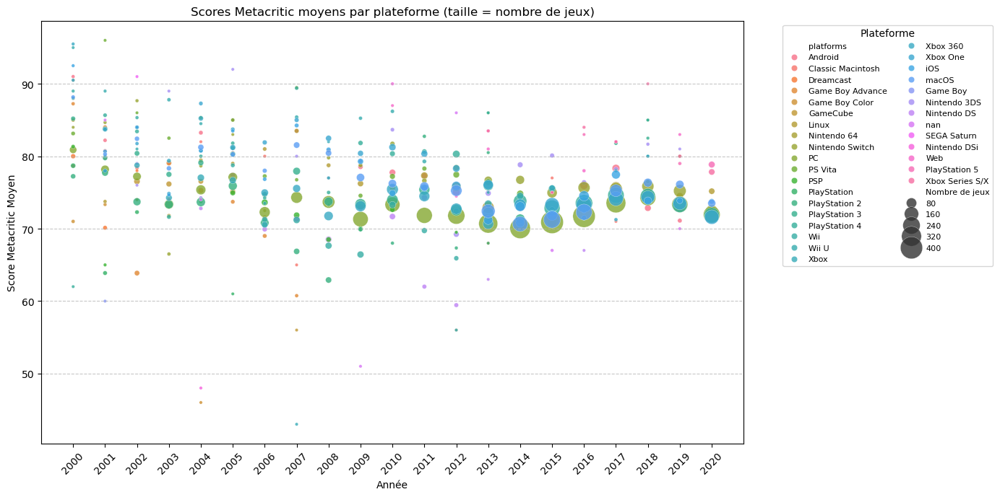

In [159]:
# Suppression des NaN pour Annee, metacritic et platforms
df_metacritic_platforms = df_jeux_filtered.dropna(subset=["Annee", "metacritic", "platforms"]).copy()

# Conversion de l'année en entier pour éviter les valeurs décimales
df_metacritic_platforms["Annee"] = df_metacritic_platforms["Annee"].astype(int)

# Explosion des plateformes (certains jeux sortent sur plusieurs plateformes)
df_metacritic_platforms["platforms"] = df_metacritic_platforms["platforms"].astype(str).str.split(r"\|\|")
df_metacritic_platforms = df_metacritic_platforms.explode("platforms")

# Comptage du nombre de jeux par Année et par plateforme
df_count = df_metacritic_platforms.groupby(["Annee", "platforms"]).size().reset_index(name="Nombre de jeux")

# Moyenne des scores Metacritic par Année et par plateforme
df_avg_metacritic = df_metacritic_platforms.groupby(["Annee", "platforms"])["metacritic"].mean().reset_index()

# Fusion des deux DataFrames
df_final = pd.merge(df_avg_metacritic, df_count, on=["Annee", "platforms"])

# Génération d'une palette de couleurs pour chaque plateforme
unique_platforms = df_final["platforms"].unique()
num_platforms = len(unique_platforms)
palette = sns.color_palette("husl", num_platforms)  # husl = bonne différenciation des couleurs
platform_color_map = dict(zip(unique_platforms, palette))  # Associer chaque plateforme à une couleur

# Création du scatterplot
plt.figure(figsize=(14, 7))
sns.scatterplot(
    data=df_final, 
    x="Annee", 
    y="metacritic", 
    hue="platforms", 
    size="Nombre de jeux", 
    sizes=(10, 500),  # Ajustement de la taille des points
    palette=platform_color_map, 
    alpha=0.8
)

# Ajout des étiquettes et titre
plt.xlabel("Année")
plt.ylabel("Score Metacritic Moyen")
plt.title("Scores Metacritic moyens par plateforme (taille = nombre de jeux)")
plt.xticks(df_final["Annee"].unique(), rotation=45)  # Affichage des années sans décimales
plt.legend(title="Plateforme", bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=8, ncol=2)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Affichage du graphique
plt.tight_layout()
plt.show()

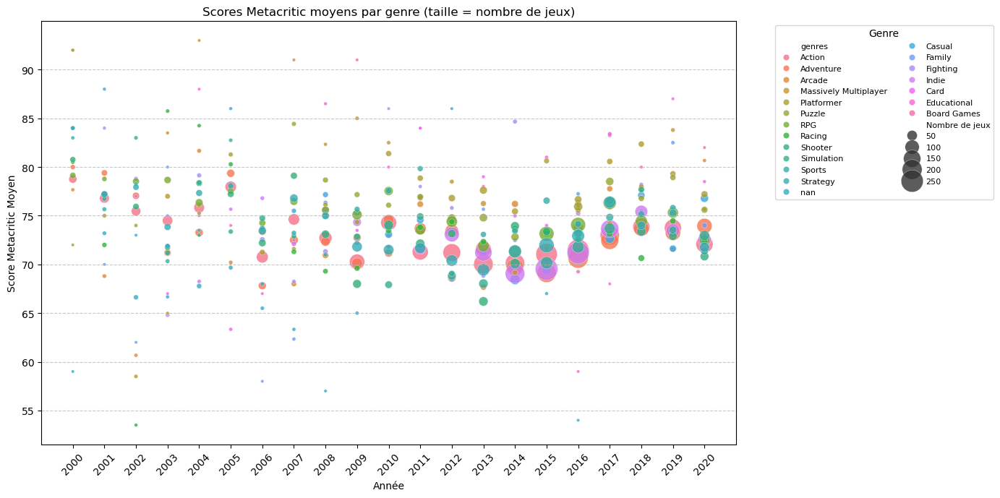

In [160]:
# Suppression des NaN pour Annee, metacritic et genres
df_metacritic_genres = df_jeux_filtered.dropna(subset=["Annee", "metacritic", "genres"]).copy()

# Conversion de l'année en entier pour éviter les valeurs décimales
df_metacritic_genres["Annee"] = df_metacritic_genres["Annee"].astype(int)

# Explosion des genres (certains jeux ont plusieurs genres)
df_metacritic_genres["genres"] = df_metacritic_genres["genres"].astype(str).str.split(r"\|\|")
df_metacritic_genres = df_metacritic_genres.explode("genres")

# Comptage du nombre de jeux par Année et par genre
df_count = df_metacritic_genres.groupby(["Annee", "genres"]).size().reset_index(name="Nombre de jeux")

# Moyenne des scores Metacritic par Année et par genre
df_avg_metacritic = df_metacritic_genres.groupby(["Annee", "genres"])["metacritic"].mean().reset_index()

# Fusion des deux DataFrames
df_final = pd.merge(df_avg_metacritic, df_count, on=["Annee", "genres"])

# Génération d'une palette de couleurs pour chaque genre
unique_genres = df_final["genres"].unique()
num_genres = len(unique_genres)
palette = sns.color_palette("husl", num_genres)  # husl = bonne différenciation des couleurs
genre_color_map = dict(zip(unique_genres, palette))  # Associer chaque genre à une couleur

# Création du scatterplot
plt.figure(figsize=(14, 7))
sns.scatterplot(
    data=df_final, 
    x="Annee", 
    y="metacritic", 
    hue="genres", 
    size="Nombre de jeux", 
    sizes=(10, 500),  # Ajustement de la taille des points
    palette=genre_color_map, 
    alpha=0.8
)

# Ajout des étiquettes et titre
plt.xlabel("Année")
plt.ylabel("Score Metacritic Moyen")
plt.title("Scores Metacritic moyens par genre (taille = nombre de jeux)")
plt.xticks(df_final["Annee"].unique(), rotation=45)  # Affichage des années sans décimales
plt.legend(title="Genre", bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=8, ncol=2)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Affichage du graphique
plt.tight_layout()
plt.show()

In [161]:
df_jeux.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 440896 entries, 0 to 440895
Data columns (total 66 columns):
 #   Column                Non-Null Count   Dtype         
---  ------                --------------   -----         
 0   Colonne1              440896 non-null  int64         
 1   slug                  440880 non-null  object        
 2   name                  440885 non-null  object        
 3   metacritic            4627 non-null    float64       
 4   released              440896 non-null  datetime64[ns]
 5   Annee                 440896 non-null  int64         
 6   rating                440833 non-null  float64       
 7   rating_top            440833 non-null  float64       
 8   playtime              440833 non-null  float64       
 9   achievements_count    440833 non-null  float64       
 10  ratings_count         440833 non-null  float64       
 11  suggestions_count     440833 non-null  float64       
 12  game_series_count     440833 non-null  float64       
 13 

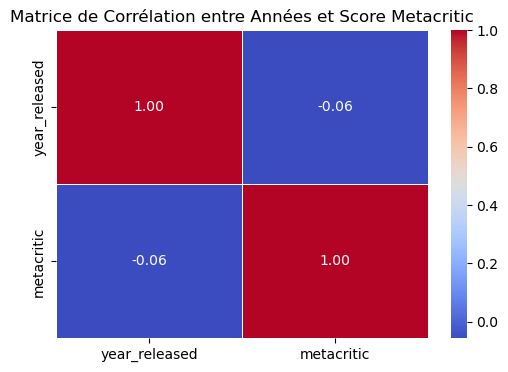

In [162]:
# Convertir la colonne 'released' en format datetime et extraire l'année
df_jeux['year_released'] = pd.to_datetime(df_jeux['released'], errors='coerce').dt.year

# Garder seulement les colonnes 'year_released' et 'metacritic'
df_corr = df_jeux[['year_released', 'metacritic']]

# Supprimer les lignes avec des valeurs NaN dans ces deux colonnes
df_corr = df_corr.dropna()

# Calculer la matrice de corrélation entre 'year_released' et 'metacritic'
correlation_matrix = df_corr.corr()

# Affichage de la matrice de corrélation sous forme de heatmap
plt.figure(figsize=(6, 4))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title("Matrice de Corrélation entre Années et Score Metacritic")
plt.show()

C:\Users\Shiin\AppData\Local\Temp\ipykernel_29288\2533780067.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_jeux['genres'] = df_jeux['genres'].astype(str).str.split(r"\|\|")


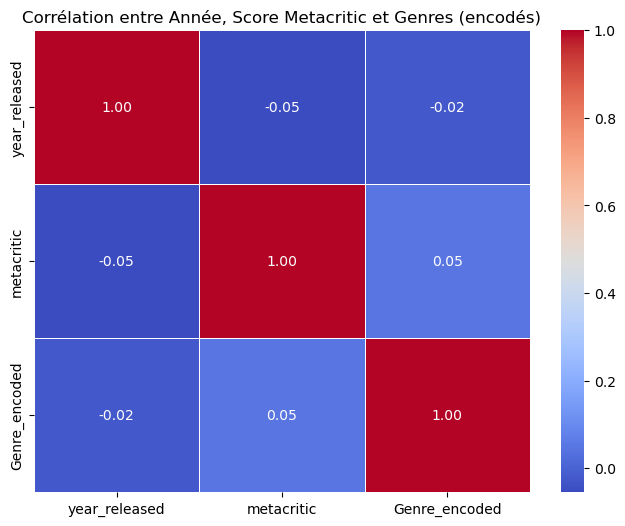

In [163]:
# Conversion de la colonne 'released' en datetime et extraction de l'année
df_jeux['year_released'] = pd.to_datetime(df_jeux['released'], errors='coerce').dt.year

# Supprimer les lignes avec des années ou des scores Metacritic manquants
df_jeux = df_jeux.dropna(subset=['year_released', 'metacritic', 'genres'])

# Explosion des genres pour attribuer un encodage unique à chaque genre principal
df_jeux['genres'] = df_jeux['genres'].astype(str).str.split(r"\|\|")
df_genres = df_jeux.explode('genres')

# Encoder les genres en valeurs numériques
encoder = LabelEncoder()
df_genres['Genre_encoded'] = encoder.fit_transform(df_genres['genres'])

# Garder uniquement les colonnes utiles
df_corr = df_genres[['year_released', 'metacritic', 'Genre_encoded']]

# Calcul de la matrice de corrélation
correlation_matrix = df_corr.corr()

# Affichage de la matrice de corrélation sous forme de heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Corrélation entre Année, Score Metacritic et Genres (encodés)")
plt.show()


## Ventes Jeux

In [165]:
# Accéder à une feuille spécifique
df_jeux_ventes = sheets_dict["Ventes Jeux"]
print(df_jeux_ventes.head())  # Afficher les premières lignes


   Rank                                     Name Platform    Year  \
0  8359               .hack//G.U. Vol.1//Rebirth      PS2  2006.0   
1  7109             .hack//G.U. Vol.2//Reminisce      PS2  2006.0   
2  8604  .hack//G.U. Vol.2//Reminisce (jp sales)      PS2  2006.0   
3  8306            .hack//G.U. Vol.3//Redemption      PS2  2007.0   
4  1565                  .hack//Infection Part 1      PS2  2002.0   

          Genre           Publisher Constructeur Portable  NA_Sales EU_Sales  \
0  Role-Playing  Namco Bandai Games         Sony       Non        0        0   
1  Role-Playing  Namco Bandai Games         Sony       Non   0,1133   0,0936   
2  Role-Playing  Namco Bandai Games         Sony       Non        0        0   
3  Role-Playing  Namco Bandai Games         Sony       Non        0        0   
4  Role-Playing               Atari         Sony       Non   0,4802   0,3686   

  JP_Sales Other_Sales Global_Sales  
0   0,1751           0       0,1751  
1        0      0,0303      

In [166]:
#Afficher les dimensions du dataset historique
print("Le tableau comporte {} observation(s) ou article(s)".format(df_jeux_ventes.shape[0]))
print("Le tableau comporte {} colonne(s)".format(df_jeux_ventes.shape[1]))
print()

#La nature des données historique dans chacune des colonnes
nature_des_donnees_jeux_ventes = df_jeux_ventes.dtypes
print("Nature des données de chaque colonne :")
print(nature_des_donnees_jeux_ventes)
print()


Le tableau comporte 16545 observation(s) ou article(s)
Le tableau comporte 13 colonne(s)

Nature des données de chaque colonne :
Rank              int64
Name             object
Platform         object
Year            float64
Genre            object
Publisher        object
Constructeur     object
Portable         object
NA_Sales         object
EU_Sales         object
JP_Sales         object
Other_Sales      object
Global_Sales     object
dtype: object



In [167]:

df_jeux_ventes.head(20)

,Rank,Name,Platform,Year,Genre,Publisher,Constructeur,Portable,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales
0,8359,.hack//G.U. Vol.1//Rebirth,PS2,2006.0,Role-Playing,Namco Bandai Games,Sony,Non,0,0,"0,1751",0,"0,1751"
1,7109,.hack//G.U. Vol.2//Reminisce,PS2,2006.0,Role-Playing,Namco Bandai Games,Sony,Non,"0,1133","0,0936",0,"0,0303","0,2372"
2,8604,.hack//G.U. Vol.2//Reminisce (jp sales),PS2,2006.0,Role-Playing,Namco Bandai Games,Sony,Non,0,0,"0,1568",0,"0,1568"
3,8306,.hack//G.U. Vol.3//Redemption,PS2,2007.0,Role-Playing,Namco Bandai Games,Sony,Non,0,0,"0,1751",0,"0,1751"
4,1565,.hack//Infection Part 1,PS2,2002.0,Role-Playing,Atari,Sony,Non,"0,4802","0,3686","0,273","0,1274","1,2492"
5,9076,.hack//Link,PSP,2010.0,Role-Playing,Namco Bandai Games,Sony,Oui,0,0,"0,1428",0,"0,1428"
6,3004,.hack//Mutation Part 2,PS2,2002.0,Role-Playing,Atari,Sony,Non,"0,2277","0,1836","0,21","0,0606","0,6819"
7,4296,.hack//Outbreak Part 3,PS2,2002.0,Role-Playing,Atari,Sony,Non,"0,1442","0,1056","0,1785","0,0388","0,4671"
8,8009,.hack//Quarantine Part 4: The Final Chapter,PS2,2003.0,Role-Playing,Atari,Sony,Non,"0,0918","0,0686",0,"0,0194","0,1798"
9,14279,.hack: Sekai no Mukou ni + Versus,PS3,2012.0,Action,Namco Bandai Games,Sony,Non,0,0,"0,0297",0,"0,0297"


In [168]:
colonnes_a_convertir = ["Year", "NA_Sales", "EU_Sales", "JP_Sales", "Other_Sales", "Global_Sales"]

# Remplacer les virgules par des points et convertir en numérique
df_jeux_ventes[colonnes_a_convertir] = df_jeux_ventes[colonnes_a_convertir].replace(",", ".", regex=True).apply(pd.to_numeric, errors="coerce")

# Vérifier les types après conversion
print(df_jeux_ventes.dtypes)

df_jeux_ventes.head(20)

Rank              int64
Name             object
Platform         object
Year            float64
Genre            object
Publisher        object
Constructeur     object
Portable         object
NA_Sales        float64
EU_Sales        float64
JP_Sales        float64
Other_Sales     float64
Global_Sales    float64
dtype: object


,Rank,Name,Platform,Year,Genre,Publisher,Constructeur,Portable,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales
0,8359,.hack//G.U. Vol.1//Rebirth,PS2,2006.0,Role-Playing,Namco Bandai Games,Sony,Non,0.0000,0.0000,0.1751,0.0000,0.1751
1,7109,.hack//G.U. Vol.2//Reminisce,PS2,2006.0,Role-Playing,Namco Bandai Games,Sony,Non,0.1133,0.0936,0.0000,0.0303,0.2372
2,8604,.hack//G.U. Vol.2//Reminisce (jp sales),PS2,2006.0,Role-Playing,Namco Bandai Games,Sony,Non,0.0000,0.0000,0.1568,0.0000,0.1568
3,8306,.hack//G.U. Vol.3//Redemption,PS2,2007.0,Role-Playing,Namco Bandai Games,Sony,Non,0.0000,0.0000,0.1751,0.0000,0.1751
4,1565,.hack//Infection Part 1,PS2,2002.0,Role-Playing,Atari,Sony,Non,0.4802,0.3686,0.2730,0.1274,1.2492
5,9076,.hack//Link,PSP,2010.0,Role-Playing,Namco Bandai Games,Sony,Oui,0.0000,0.0000,0.1428,0.0000,0.1428
6,3004,.hack//Mutation Part 2,PS2,2002.0,Role-Playing,Atari,Sony,Non,0.2277,0.1836,0.2100,0.0606,0.6819
7,4296,.hack//Outbreak Part 3,PS2,2002.0,Role-Playing,Atari,Sony,Non,0.1442,0.1056,0.1785,0.0388,0.4671
8,8009,.hack//Quarantine Part 4: The Final Chapter,PS2,2003.0,Role-Playing,Atari,Sony,Non,0.0918,0.0686,0.0000,0.0194,0.1798
9,14279,.hack: Sekai no Mukou ni + Versus,PS3,2012.0,Action,Namco Bandai Games,Sony,Non,0.0000,0.0000,0.0297,0.0000,0.0297


In [169]:
df_jeux_ventes.describe()

,Rank,Year,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales
count,16545.000000,16274.000000,16545.000000,16545.000000,16545.000000,16545.000000,16545.000000
mean,8289.703959,2006.414649,0.269274,0.150565,0.078359,0.049447,0.547645
std,4791.589155,5.815555,0.863085,0.572444,0.311484,0.216729,1.684157
min,1.000000,1980.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,4140.000000,2003.000000,0.000000,0.000000,0.000000,0.000000,0.060500
50%,8285.000000,2007.000000,0.079200,0.020800,0.000000,0.010100,0.172800
75%,12436.000000,2010.000000,0.241500,0.112200,0.038400,0.038400,0.480300
max,16600.000000,2020.000000,41.490000,27.859200,9.811200,12.098600,81.296900


In [170]:
#Le nombre de valeurs présentes dans chacune des colonnes
nombre_de_valeurs_jeux_ventes = df_jeux_ventes.count()
print("Nombre de valeurs présentes dans chaque colonne :")
print(nombre_de_valeurs_jeux_ventes)
print()

# le nombre de valeurs nulles
df_jeux_ventes.isnull().sum()

Nombre de valeurs présentes dans chaque colonne :
Rank            16545
Name            16545
Platform        16545
Year            16274
Genre           16545
Publisher       16487
Constructeur    16545
Portable        16545
NA_Sales        16545
EU_Sales        16545
JP_Sales        16545
Other_Sales     16545
Global_Sales    16545
dtype: int64



Rank              0
Name              0
Platform          0
Year            271
Genre             0
Publisher        58
Constructeur      0
Portable          0
NA_Sales          0
EU_Sales          0
JP_Sales          0
Other_Sales       0
Global_Sales      0
dtype: int64

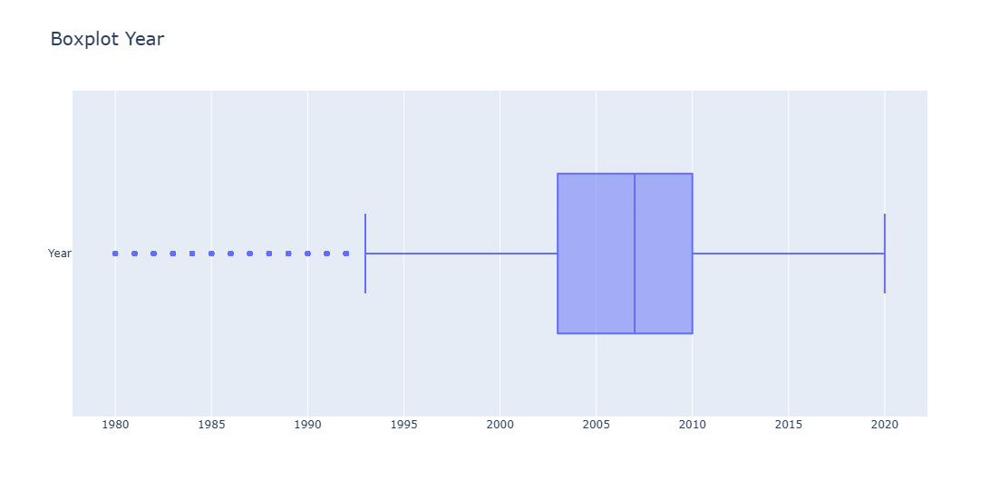

In [171]:
# Boxplot Surface
fig = go.Figure()

fig.add_trace(go.Box(x=df_jeux_ventes['Year'], name="Year"))

fig.update_layout(
    title="Boxplot Year",
    width=1150,
    height=540,
    title_font=dict(size=20)
)
fig.show()

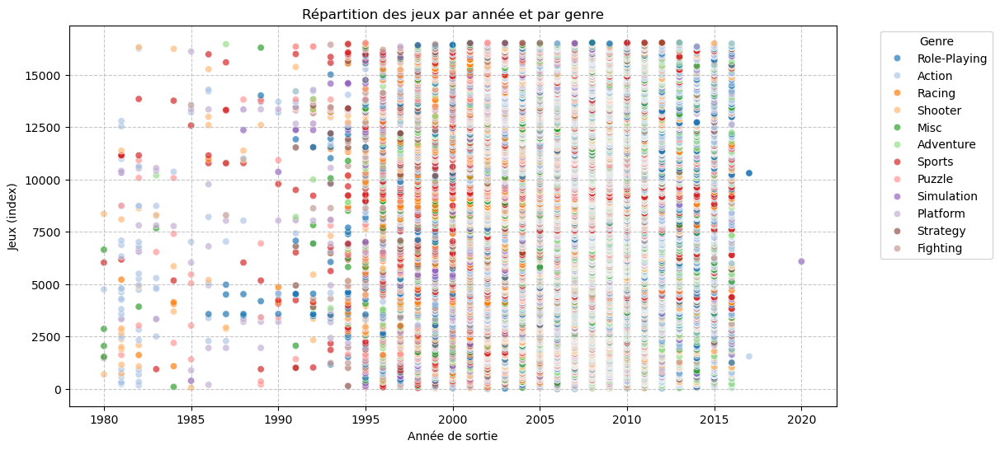

In [172]:
# Définir une palette de couleurs distinctes
palette = sns.color_palette("tab20", n_colors=df_jeux_ventes["Genre"].nunique())

# Création du scatter plot avec coloration par genre
plt.figure(figsize=(12, 6))
sns.scatterplot(data=df_jeux_ventes, x="Year", y=df_jeux_ventes.index, hue="Genre", palette=palette, alpha=0.7)

# Ajout des labels et titre
plt.xlabel("Année de sortie")
plt.ylabel("Jeux (index)")
plt.title("Répartition des jeux par année et par genre")
plt.legend(title="Genre", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.grid(True, linestyle="--", alpha=0.7)

# Affichage du graphique
plt.show()

<Figure size 1200x600 with 0 Axes>

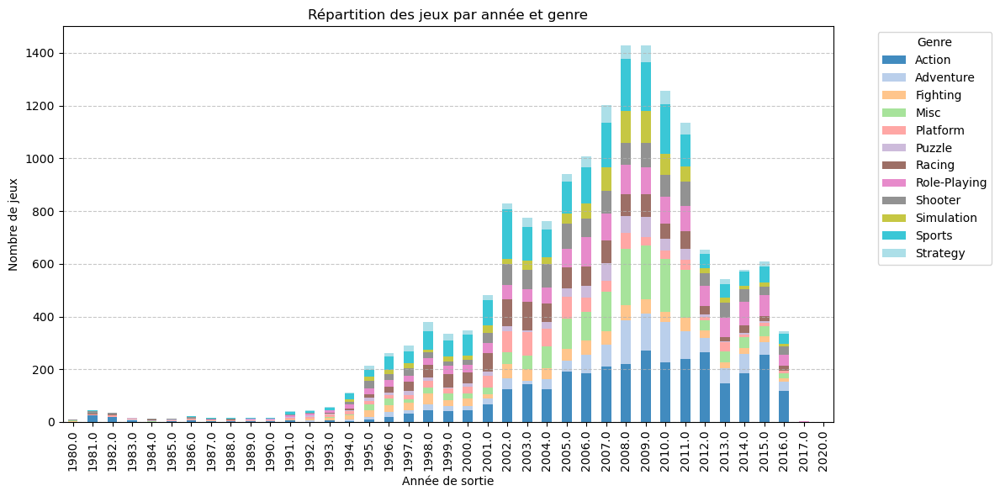

In [173]:

# Regrouper les données pour compter le nombre de jeux par genre et année
df_count = df_jeux_ventes.groupby(["Year", "Genre"]).size().reset_index(name="Count")

# Pivot des données pour avoir les genres en colonnes (facilite le stacked bar chart)
df_pivot = df_count.pivot(index="Year", columns="Genre", values="Count").fillna(0)

# Création du graphique en barres empilées
plt.figure(figsize=(12, 6))
df_pivot.plot(kind="bar", stacked=True, colormap="tab20", figsize=(12, 6), alpha=0.85)

# Ajout des labels et titre
plt.xlabel("Année de sortie")
plt.ylabel("Nombre de jeux")
plt.title("Répartition des jeux par année et genre")
plt.legend(title="Genre", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.grid(axis="y", linestyle="--", alpha=0.7)

# Affichage du graphique
plt.tight_layout()
plt.show()

#### Ventes Région / Console

In [175]:
# Colonnes à agréger
colonnes_ventes = ["NA_Sales", "EU_Sales", "JP_Sales", "Other_Sales", "Global_Sales"]

df_sales_by_platform  = df_jeux_ventes.groupby('Platform')[colonnes_ventes].sum().reset_index()

# Afficher les résultats triés par ventes décroissantes
df_sales_by_platform = df_sales_by_platform.sort_values(by="Global_Sales", ascending=False)

print(df_sales_by_platform)

   Platform  NA_Sales  EU_Sales  JP_Sales  Other_Sales  Global_Sales
14      PS2  586.1000  340.9652  140.3691     194.4819     1261.9162
23     X360  621.9389  293.5538   12.3175      88.5628     1016.3730
15      PS3  406.9458  364.4404   82.4446     150.9316     1004.7624
21      Wii  508.8321  268.2849   69.4771      81.1875      927.7816
4        DS  392.1311  194.9440  176.9723      61.1163      825.1637
13       PS  337.6760  214.4653  140.6483      41.0980      733.8876
6       GBA  188.3509   75.7822   47.6206       7.7923      319.5460
16      PS4  105.5771  135.9887   14.8128      47.5403      303.9189
17      PSP  109.7888   68.6339   77.1829      42.3411      297.9467
12       PC   94.8780  141.9871    0.1712      25.2679      262.3042
24       XB  187.2778   61.2463    1.3781       8.7708      258.6730
5        GB  114.4011   47.8653   84.9583       8.2054      255.4301
11      NES  127.4576   21.1634   98.7543       5.2900      252.6653
2       3DS   79.5021   58.4685   

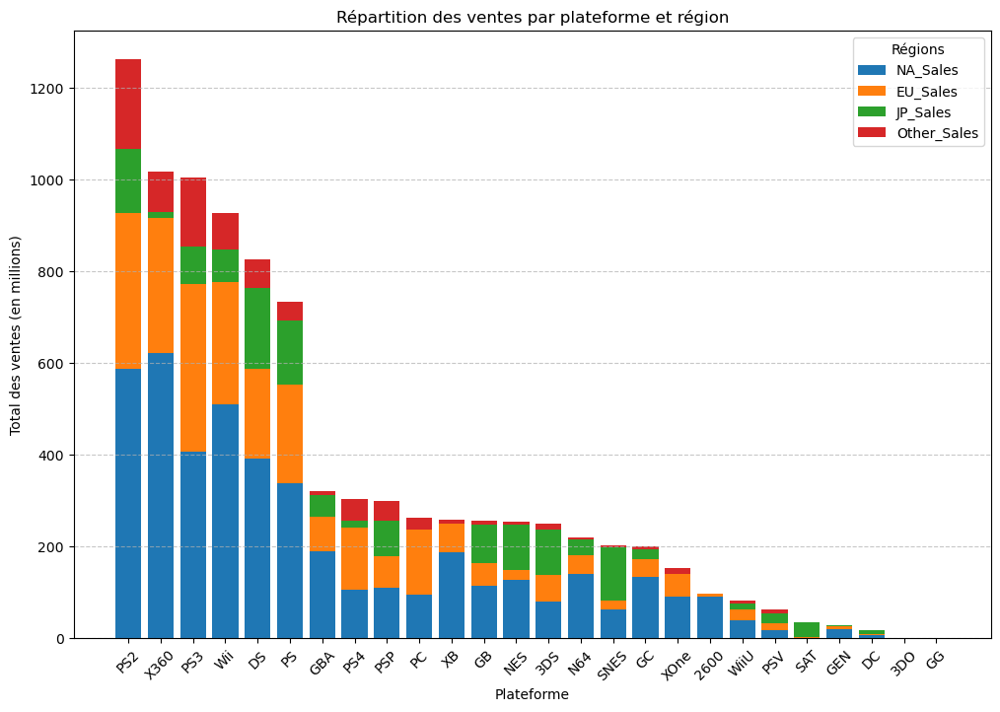

In [176]:
# Définition des plateformes et des ventes régionales
platforms = df_sales_by_platform["Platform"]
sales_regions = ["NA_Sales", "EU_Sales", "JP_Sales", "Other_Sales"]
colors = ["#1f77b4", "#ff7f0e", "#2ca02c", "#d62728"]  # Palette de couleurs

# Création du graphique en barres empilées
plt.figure(figsize=(12, 8))

# Initialisation des valeurs de base (pour empiler les barres)
bottom_values = [0] * len(platforms)

# Boucle pour tracer chaque segment des ventes régionales
for i, region in enumerate(sales_regions):
    plt.bar(platforms, df_sales_by_platform[region], bottom=bottom_values, 
            label=region, color=colors[i])
    
    # Mise à jour des bases pour la prochaine région (empilement)
    bottom_values += df_sales_by_platform[region]

# Ajout des légendes et styles
plt.xlabel("Plateforme")
plt.ylabel("Total des ventes (en millions)")
plt.title("Répartition des ventes par plateforme et région")
plt.xticks(rotation=45)  # Rotation des étiquettes pour plus de lisibilité
plt.legend(title="Régions")
plt.grid(axis="y", linestyle="--", alpha=0.7)

# Affichage du graphique
plt.show()

C:\Users\Shiin\AppData\Local\Temp\ipykernel_29288\3363590336.py:19: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



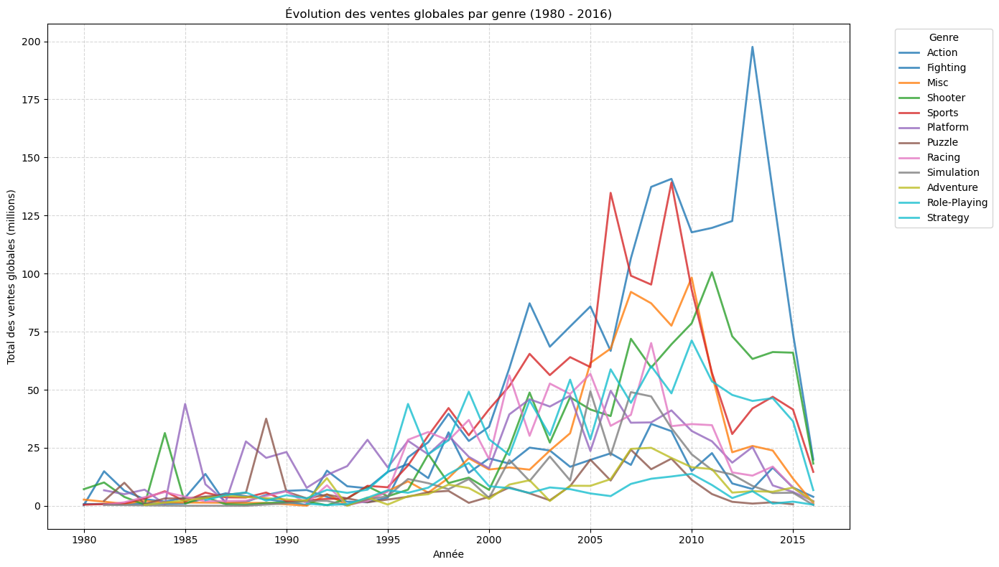

In [177]:

# Vérifier si la colonne Global_Sales existe, sinon la calculer
if "Global_Sales" not in df_jeux_ventes.columns:
    df_jeux_ventes["Global_Sales"] = df_jeux_ventes[sales_regions].sum(axis=1)

# Agréger les ventes globales par année et genre
df_genre_sales = df_jeux_ventes.groupby(["Year", "Genre"])["Global_Sales"].sum().reset_index()

# Filtrer les années entre 1980 et 2016
df_genre_sales = df_genre_sales.dropna()
df_genre_sales = df_genre_sales[(df_genre_sales["Year"] >= 1980) & (df_genre_sales["Year"] <= 2016)]

# Création de la figure
plt.figure(figsize=(14, 8))

# Liste des genres uniques
genres = df_genre_sales["Genre"].unique()

# Générer des couleurs automatiquement
colors = plt.cm.get_cmap("tab10", len(genres))

# Tracer une courbe pour chaque genre
for i, genre in enumerate(genres):
    data_genre = df_genre_sales[df_genre_sales["Genre"] == genre]
    plt.plot(data_genre["Year"], data_genre["Global_Sales"], 
             label=genre, color=colors(i), linewidth=2, alpha=0.8)

# Configuration des axes
plt.xlabel('Année')
plt.ylabel('Total des ventes globales (millions)')

# Ajout du titre et de la légende
plt.title('Évolution des ventes globales par genre (1980 - 2016)')
plt.legend(title="Genre", bbox_to_anchor=(1.05, 1), loc="upper left")

# Ajout de la grille pour plus de lisibilité
plt.grid(which='both', linestyle="--", alpha=0.5)

# Affichage du graphique
plt.tight_layout()
plt.show()

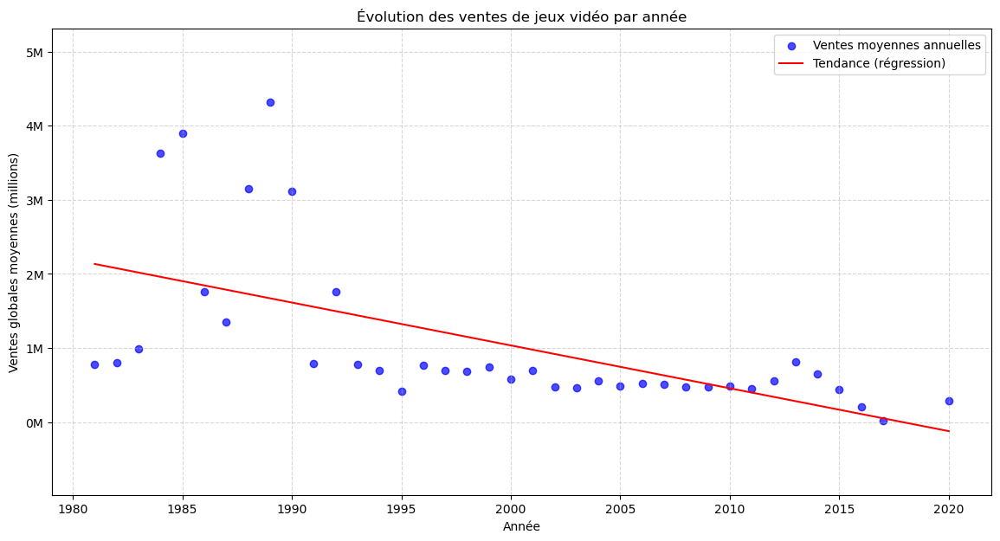

In [178]:
# Calculer les ventes globales si elles ne sont pas déjà présentes
df_jeux_ventes["Global_Sales"] = df_jeux_ventes[sales_regions].sum(axis=1)

# Agréger les ventes globales par année
yearly_sales = df_jeux_ventes.groupby("Year")["Global_Sales"].mean().reset_index()

# Supprimer les années nulles ou aberrantes
yearly_sales = yearly_sales.dropna()
yearly_sales = yearly_sales[yearly_sales["Year"] > 1980]  # Filtre pour éviter les années incorrectes

# Création de la figure
plt.figure(figsize=(14, 7))

# Scatter plot : Année vs Moyenne des ventes globales
plt.scatter(yearly_sales["Year"], yearly_sales["Global_Sales"], alpha=0.7, label='Ventes moyennes annuelles', color='blue')

# Ajout de la régression linéaire
x = yearly_sales["Year"]
y = yearly_sales["Global_Sales"]
m, b = np.polyfit(x, y, 1)  # Régression linéaire
plt.plot(x, m * x + b, color='red', label='Tendance (régression)')

# Configuration des axes
plt.xlabel('Année')
plt.ylabel('Ventes globales moyennes (millions)')

# Formatage de l'axe des ordonnées pour afficher les ventes en millions
formatter = ticker.FormatStrFormatter('%dM')
plt.gca().yaxis.set_major_formatter(formatter)

# Ajustement des limites pour plus de clarté
plt.ylim(y.min() - 1, y.max() + 1)

# Ajout de la grille, du titre et de la légende
plt.grid(which='both', linestyle="--", alpha=0.5)
plt.title('Évolution des ventes de jeux vidéo par année')
plt.legend()

# Affichage du graphique
plt.show()

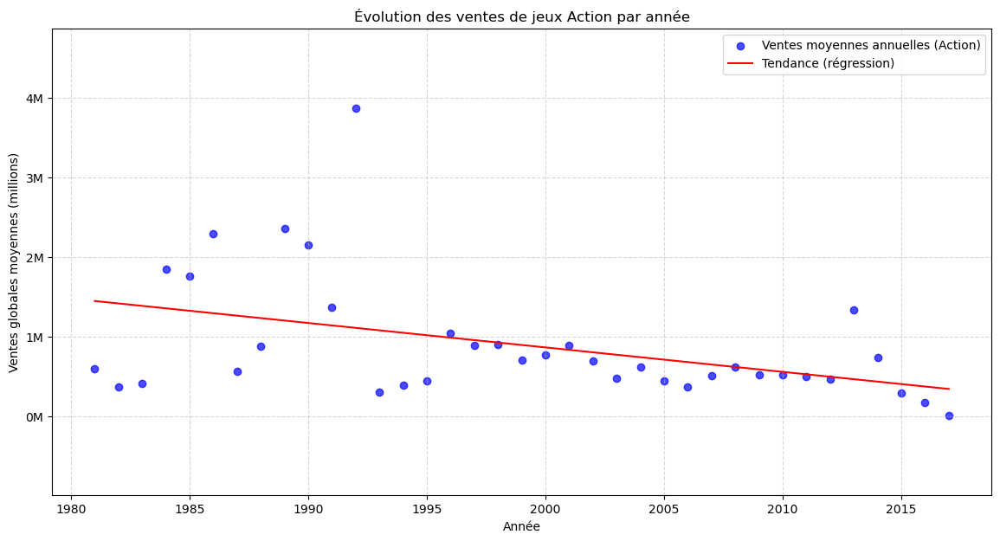

In [179]:

# Filtrer uniquement les jeux de genre "Action"
df_action = df_jeux_ventes[df_jeux_ventes["Genre"] == "Action"].copy()

# Vérifier si la colonne Global_Sales existe, sinon la calculer
if "Global_Sales" not in df_action.columns:
    df_action["Global_Sales"] = df_action[sales_regions].sum(axis=1)

# Agréger les ventes globales par année
yearly_sales_action = df_action.groupby("Year")["Global_Sales"].mean().reset_index()

# Supprimer les années nulles ou aberrantes
yearly_sales_action = yearly_sales_action.dropna()
yearly_sales_action = yearly_sales_action[yearly_sales_action["Year"] > 1980]  # Filtrage des années erronées

# Création de la figure
plt.figure(figsize=(14, 7))

# Scatter plot : Année vs Moyenne des ventes globales (genre Action)
plt.scatter(yearly_sales_action["Year"], yearly_sales_action["Global_Sales"], 
            alpha=0.7, label='Ventes moyennes annuelles (Action)', color='blue')

# Ajout de la régression linéaire
x = yearly_sales_action["Year"]
y = yearly_sales_action["Global_Sales"]
m, b = np.polyfit(x, y, 1)  # Régression linéaire
plt.plot(x, m * x + b, color='red', label='Tendance (régression)')

# Configuration des axes
plt.xlabel('Année')
plt.ylabel('Ventes globales moyennes (millions)')

# Formatage de l'axe des ordonnées pour afficher les ventes en millions
formatter = ticker.FormatStrFormatter('%dM')
plt.gca().yaxis.set_major_formatter(formatter)

# Ajustement des limites pour plus de clarté
plt.ylim(y.min() - 1, y.max() + 1)

# Ajout de la grille, du titre et de la légende
plt.grid(which='both', linestyle="--", alpha=0.5)
plt.title('Évolution des ventes de jeux Action par année')
plt.legend()

# Affichage du graphique
plt.show()

#### Ventes Région / Genre

In [181]:
df_sales_by_genre  = df_jeux_ventes.groupby('Genre')[colonnes_ventes].sum().reset_index()

# Afficher les résultats triés par ventes décroissantes
df_sales_by_genre = df_sales_by_genre.sort_values(by="Global_Sales", ascending=False)

print(df_sales_by_genre)

           Genre  NA_Sales  EU_Sales  JP_Sales  Other_Sales  Global_Sales
0         Action  926.4290  575.8090  163.5549     204.6861     1870.4790
10        Sports  684.8693  377.8736  136.4241     135.8755     1335.0425
8        Shooter  586.3094  314.8729   38.2339     102.8114     1042.2276
7   Role-Playing  329.5338  189.0062  354.3499      59.7687      932.6586
4       Platform  446.5510  202.2651  130.5823      52.1227      831.5211
3           Misc  413.5053  216.4458  107.8913      75.6755      813.5179
6         Racing  360.5761  239.2042   56.5835      77.5241      733.8879
2       Fighting  224.0432  101.7961   86.3600      36.8610      449.0603
9     Simulation  184.4192  112.7183   64.5886      31.9120      393.6381
5         Puzzle  123.6804   51.3262   57.4250      12.5875      245.0191
1      Adventure  105.9325   64.1786   51.0600      16.8632      238.0343
11      Strategy   69.2849   45.6054   49.3966      11.4174      175.7043


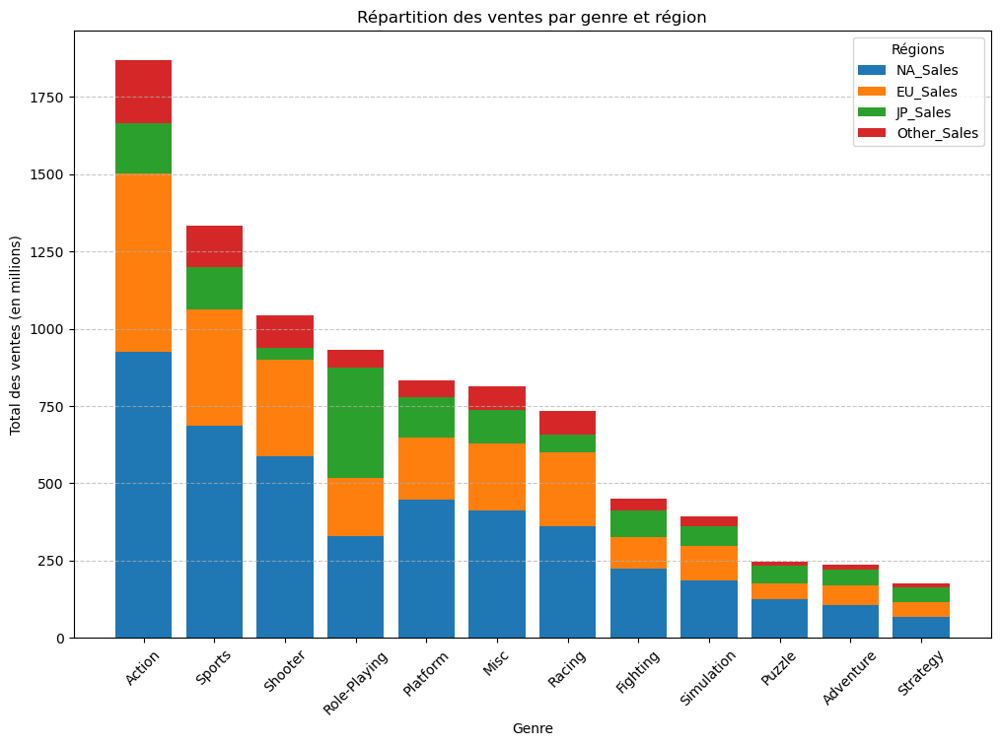

In [182]:
# Définition des genres et des ventes régionales
genres = df_sales_by_genre["Genre"]
sales_regions = ["NA_Sales", "EU_Sales", "JP_Sales", "Other_Sales"]
colors = ["#1f77b4", "#ff7f0e", "#2ca02c", "#d62728"]  # Palette de couleurs

# Création du graphique en barres empilées
plt.figure(figsize=(12, 8))

# Initialisation des valeurs de base (pour empiler les barres)
bottom_values = [0] * len(genres)

# Boucle pour tracer chaque segment des ventes régionales
for i, region in enumerate(sales_regions):
    plt.bar(genres, df_sales_by_genre[region], bottom=bottom_values, 
            label=region, color=colors[i])
    
    # Mise à jour des bases pour la prochaine région (empilement)
    bottom_values += df_sales_by_genre[region]

# Ajout des légendes et styles
plt.xlabel("Genre")
plt.ylabel("Total des ventes (en millions)")
plt.title("Répartition des ventes par genre et région")
plt.xticks(rotation=45)  # Rotation des étiquettes pour plus de lisibilité
plt.legend(title="Régions")
plt.grid(axis="y", linestyle="--", alpha=0.7)

# Affichage du graphique
plt.show()

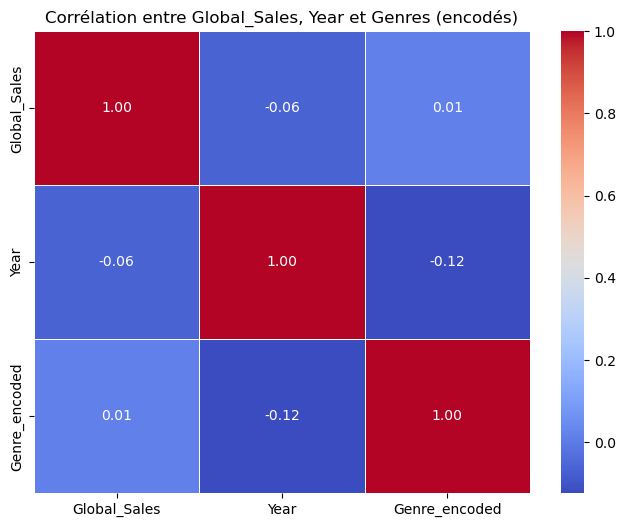

In [183]:

# Création de la colonne Global_Sales
df_jeux_ventes["Global_Sales"] = df_jeux_ventes[sales_regions].sum(axis=1)

# Explosion des genres (certains jeux ont plusieurs genres séparés par "||")
df_jeux_ventes['Genre'] = df_jeux_ventes['Genre'].astype(str).str.split(r"\|\|")
df_genres = df_jeux_ventes.explode('Genre')

# Supprimer les lignes avec valeurs manquantes sur les colonnes clés
df_genres = df_genres.dropna(subset=['Genre', 'Year', 'Global_Sales'])

# Encoder les genres en valeurs numériques
encoder = LabelEncoder()
df_genres['Genre_encoded'] = encoder.fit_transform(df_genres['Genre'])

# Sélection des colonnes pour l'analyse de corrélation
df_corr = df_genres[['Global_Sales', 'Year', 'Genre_encoded']]

# Calcul de la matrice de corrélation
correlation_matrix = df_corr.corr()

# Affichage de la heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Corrélation entre Global_Sales, Year et Genres (encodés)")
plt.show()

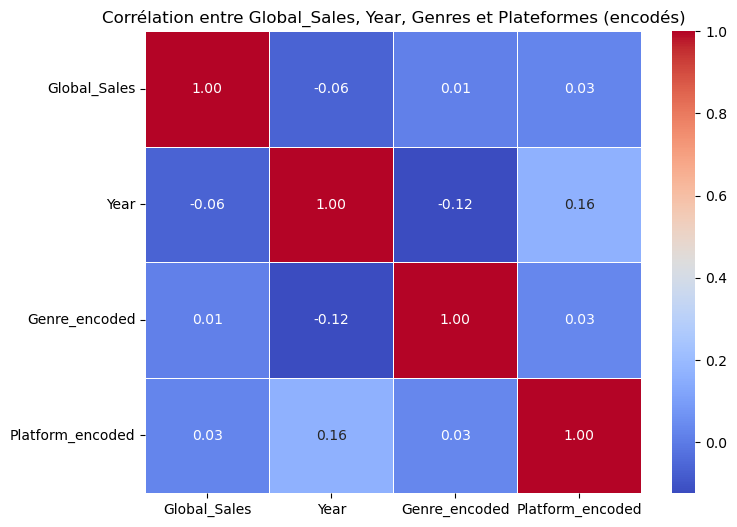

In [184]:
# Création de la colonne Global_Sales
df_jeux_ventes["Global_Sales"] = df_jeux_ventes[sales_regions].sum(axis=1)

# Explosion des genres et plateformes (certains jeux en ont plusieurs)
df_jeux_ventes['Genre'] = df_jeux_ventes['Genre'].astype(str).str.split(r"\|\|")
df_jeux_ventes['Platform'] = df_jeux_ventes['Platform'].astype(str).str.split(r"\|\|")

df_exploded = df_jeux_ventes.explode('Genre').explode('Platform')

# Supprimer les lignes avec valeurs manquantes sur les colonnes clés
df_exploded = df_exploded.dropna(subset=['Genre', 'Platform', 'Year', 'Global_Sales'])

# Encoder les genres et plateformes en valeurs numériques
encoder_genre = LabelEncoder()
encoder_platform = LabelEncoder()
df_exploded['Genre_encoded'] = encoder_genre.fit_transform(df_exploded['Genre'])
df_exploded['Platform_encoded'] = encoder_platform.fit_transform(df_exploded['Platform'])

# Sélection des colonnes pour l'analyse de corrélation
df_corr = df_exploded[['Global_Sales', 'Year', 'Genre_encoded', 'Platform_encoded']]

# Calcul de la matrice de corrélation
correlation_matrix = df_corr.corr()

# Affichage de la heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Corrélation entre Global_Sales, Year, Genres et Plateformes (encodés)")
plt.show()

## Ventes Consoles

In [186]:
# Accéder à une feuille spécifique
df_consoles_ventes = sheets_dict["Ventes Consoles"]
print(df_consoles_ventes.head())  # Afficher les premières lignes


                 Console Constructeur  Génération Console  Date de Sortie  \
0             Atari 2600        Atari                 2.0          1977.0   
1                    NES     Nintendo                 3.0          1983.0   
2             Mega Drive         Sega                 4.0          1988.0   
3  Game Boy (avec Color)     Nintendo                 NaN          1989.0   
4         Super Nintendo     Nintendo                 4.0          1990.0   

   Vente (en million)  Unnamed: 5  Unnamed: 6  Unnamed: 7  Unnamed: 8  \
0             30.6000         NaN         NaN         NaN         NaN   
1             60.6718         NaN         NaN         NaN         NaN   
2             31.0575         NaN         NaN         NaN         NaN   
3            118.6900         NaN         NaN         NaN         NaN   
4             47.1360         NaN         NaN         NaN         NaN   

   Unnamed: 9 Platform Correspondance Nom Console Présence Platform Console  \
0         NaN      

In [187]:
df_consoles_ventes = df_consoles_ventes.reset_index()
df_consoles_ventes = df_consoles_ventes.iloc[:, :6]
print(df_consoles_ventes.head())  # Afficher les premières lignes

   index                Console Constructeur  Génération Console  \
0      0             Atari 2600        Atari                 2.0   
1      1                    NES     Nintendo                 3.0   
2      2             Mega Drive         Sega                 4.0   
3      3  Game Boy (avec Color)     Nintendo                 NaN   
4      4         Super Nintendo     Nintendo                 4.0   

   Date de Sortie  Vente (en million)  
0          1977.0             30.6000  
1          1983.0             60.6718  
2          1988.0             31.0575  
3          1989.0            118.6900  
4          1990.0             47.1360  


#### Graphique

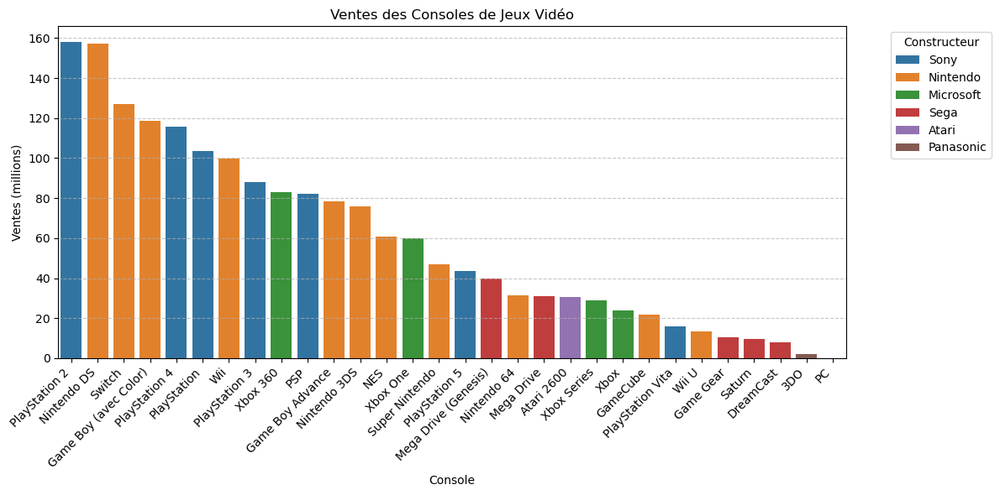

In [189]:
# Trier les consoles par ventes (optionnel, pour un affichage plus clair)
df_consoles_ventes_sorted = df_consoles_ventes.sort_values(by="Vente (en million)", ascending=False)

# Création du graphique
plt.figure(figsize=(12, 6))
sns.barplot(data=df_consoles_ventes_sorted, x="Console", y="Vente (en million)", hue="Constructeur", dodge=False)

# Ajout des étiquettes et titre
plt.xlabel("Console")
plt.ylabel("Ventes (millions)")
plt.title("Ventes des Consoles de Jeux Vidéo")
plt.xticks(rotation=45, ha="right")  # Rotation des noms de console pour lisibilité
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.legend(title="Constructeur", bbox_to_anchor=(1.05, 1), loc="upper left")  # Légende déportée

# Affichage du graphique
plt.tight_layout()
plt.show()

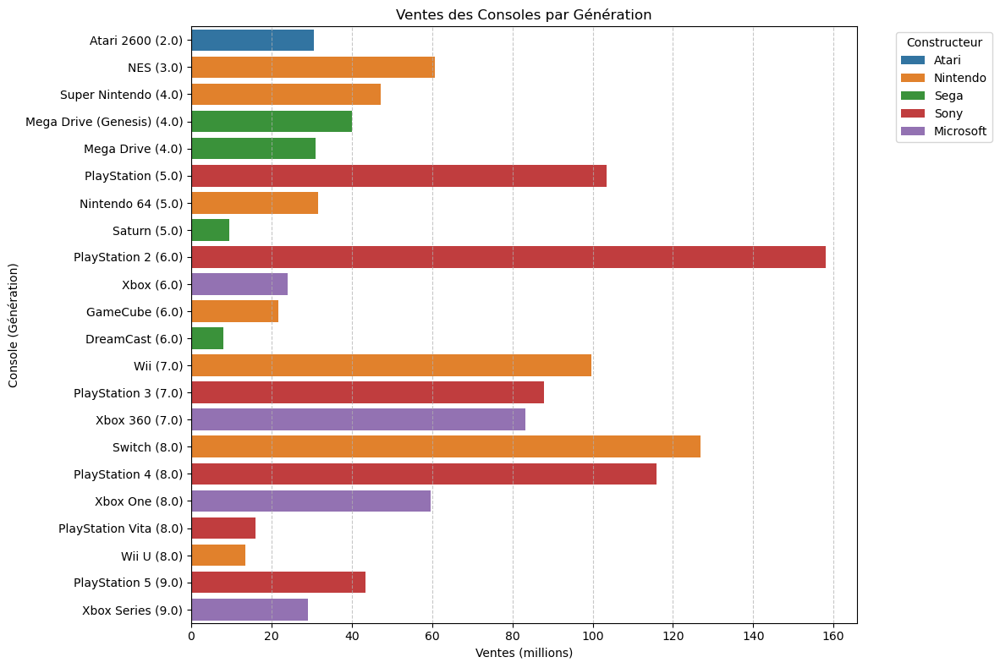

In [190]:
# Filtrer les données pour ne garder que les lignes où la colonne "Génération Console" n'est pas vide
df_consoles_ventes_filtered = df_consoles_ventes.dropna(subset=["Génération Console"])

# Trier les consoles par génération (ordre croissant), puis par ventes (ordre décroissant)
df_consoles_ventes_sorted = df_consoles_ventes_filtered.sort_values(by=["Génération Console", "Vente (en million)"], ascending=[True, False])

# Créer une nouvelle colonne combinant Génération + Console
df_consoles_ventes_sorted["Console (Génération)"] = df_consoles_ventes_sorted["Console"] + " (" + df_consoles_ventes_sorted["Génération Console"].astype(str) + ")"

# Création du graphique
plt.figure(figsize=(12, 8))
sns.barplot(
    data=df_consoles_ventes_sorted, 
    y="Console (Génération)",  # On affiche les consoles sur l'axe Y
    x="Vente (en million)", 
    hue="Constructeur", 
    dodge=False, 
    palette="tab10"  # Palette de couleurs pour distinguer les constructeurs
)

# Ajouter des étiquettes et un titre
plt.ylabel("Console (Génération)")
plt.xlabel("Ventes (millions)")
plt.title("Ventes des Consoles par Génération")
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.legend(title="Constructeur", bbox_to_anchor=(1.05, 1), loc="upper left")  # Légende à droite

# Affichage du graphique
plt.tight_layout()
plt.show()

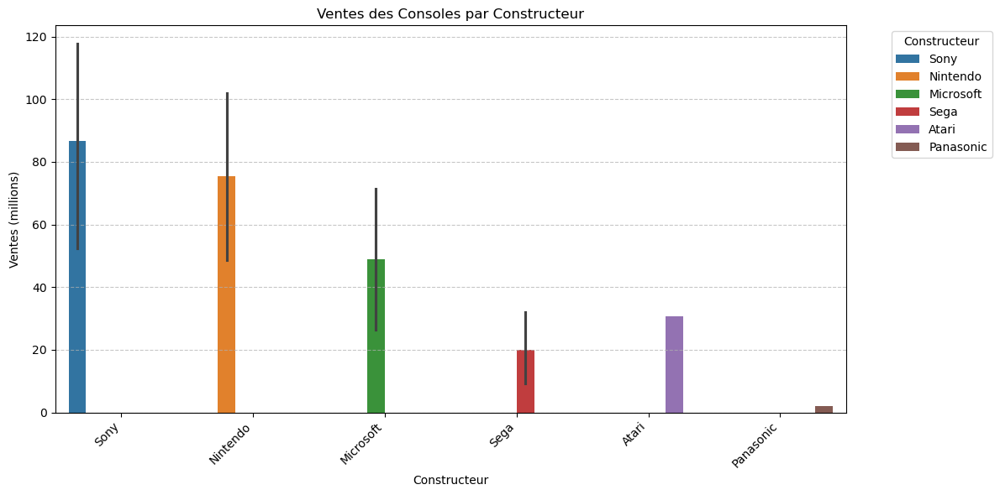

In [191]:
# Trier les consoles par ventes (optionnel, pour un affichage plus clair)
df_consoles_ventes_sorted = df_consoles_ventes.sort_values(by="Vente (en million)", ascending=False)

# Création du graphique avec un groupement par "Constructeur"
plt.figure(figsize=(12, 6))
sns.barplot(data=df_consoles_ventes_sorted, x="Constructeur", y="Vente (en million)", hue="Constructeur", dodge=True)

# Ajout des étiquettes et titre
plt.xlabel("Constructeur")
plt.ylabel("Ventes (millions)")
plt.title("Ventes des Consoles par Constructeur")
plt.xticks(rotation=45, ha="right")  # Rotation des noms de constructeur pour lisibilité
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Légende et déportation de celle-ci
plt.legend(title="Constructeur", bbox_to_anchor=(1.05, 1), loc="upper left")

# Affichage du graphique
plt.tight_layout()
plt.show()

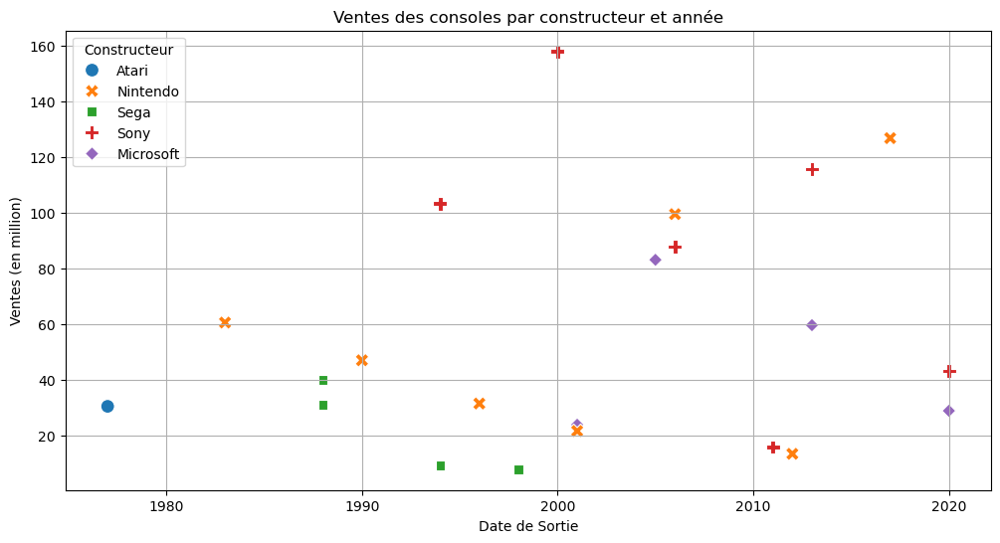

In [192]:
# Filtrer les données : exclure les lignes sans génération de console
df_filtre = df_consoles_ventes.dropna(subset=['Génération Console']).copy()

# Tracer le graphique sans regrouper les ventes
plt.figure(figsize=(12, 6))
sns.scatterplot(data=df_filtre, x='Date de Sortie', y='Vente (en million)', hue='Constructeur', style='Constructeur', s=100)

plt.title("Ventes des consoles par constructeur et année")
plt.xlabel("Date de Sortie")
plt.ylabel("Ventes (en million)")
plt.legend(title="Constructeur")
plt.grid(True)
plt.show()

In [193]:
# Assurez-vous que les colonnes ont le même type de données (str)
df_consoles_ventes["Console"] = df_consoles_ventes["Console"].astype(str)
df_jeux_ventes["Platform"] = df_jeux_ventes["Platform"].astype(str)

# Effectuer la jointure (merge) entre les deux DataFrames
df_merged_ventes_jeux_console = df_jeux_ventes.merge(df_consoles_ventes, left_on="Platform", right_on="Console", how="inner")

# Afficher un aperçu des données fusionnées
print(df_merged_ventes_jeux_console.head())

Empty DataFrame
Columns: [Rank, Name, Platform, Year, Genre, Publisher, Constructeur_x, Portable , NA_Sales, EU_Sales, JP_Sales, Other_Sales, Global_Sales, index, Console, Constructeur_y, Génération Console, Date de Sortie, Vente (en million)]
Index: []


In [194]:
df_jeux.head()

,Colonne1,slug,name,metacritic,released,Annee,rating,rating_top,playtime,achievements_count,ratings_count,suggestions_count,game_series_count,reviews_count,developers,genres,publishers,esrb_rating,added_status_yet,added_status_owned,added_status_beaten,added_status_toplay,added_status_dropped,added_status_playing,platforms,PC,macOS,iOS,Web,Linux,Xbox One,Android,PS Vita,PlayStation 4,Nintendo Switch,PlayStation 2,Wii U,PlayStation 3,Xbox 36,GameCube,Wii,Xbox,Genesis,Neo Geo,Nintendo 3DS,PlayStation,PSP,Nintendo DS,Game Boy Advance,Game Boy Color,Game Boy,Nintendo DSi,SNES,SEGA Master System,Nintendo 64,Classic Macintosh,Apple II,NES,Dreamcast,PlayStation 5,Xbox Series S/X,Commodore / Amiga,Atari 26,Atari ST,Atari 78,SEGA Saturn,year_released
93,32902,star-trek-voyager-elite-force,Star Trek: Voyager - Elite Force,69.0,2000-01-01,2000,3.86,4.0,0.0,0.0,14.0,417.0,0.0,14.0,Raven Software,"[Action, Shooter]",Activision Blizzard,NaN,1.0,3.0,17.0,2.0,2.0,0.0,PC,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2000
146,13803,b-17-flying-fortress-the-mighty-8th,B-17 Flying Fortress: The Mighty 8th,82.0,2000-01-01,2000,0.00,0.0,1.0,0.0,3.0,431.0,0.0,3.0,Wayward Design,[Simulation],Nightdive Studios||Retroism||MicroProse Software,Mature,0.0,59.0,2.0,2.0,1.0,0.0,PC,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2000
240,31412,need-for-speed-porsche-unleashed,Need for Speed: Porsche Unleashed,78.0,2000-01-01,2000,4.30,5.0,36.0,0.0,148.0,409.0,23.0,149.0,Electronic Arts Canada||Eden Games||Eden Studi...,"[Racing, Arcade]",Electronic Arts||ZOO Digital Publishing||Desti...,Everyone,8.0,42.0,123.0,8.0,82.0,3.0,PC||Game Boy Advance||PlayStation,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,1.0,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2000
280,34399,allegiance,Allegiance,86.0,2000-01-01,2000,0.00,0.0,0.0,0.0,1.0,481.0,0.0,1.0,Microsoft Research Games,[Simulation],Microsoft Studios,NaN,0.0,1.0,0.0,2.0,0.0,0.0,PC,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2000
362,31080,the-sims,The Sims,88.0,2000-02-01,2000,4.27,4.0,12.0,0.0,252.0,500.0,7.0,254.0,Maxis||The Sims Studio,[Simulation],Electronic Arts,Teen,6.0,96.0,225.0,11.0,118.0,1.0,PlayStation 2||Classic Macintosh||Linux||GameC...,1.0,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,1.0,NaN,1.0,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2000


In [195]:
import itertools

# Convertir les listes en une liste de genres uniques pour df_jeux
genres_jeux = set(itertools.chain.from_iterable(df_jeux["genres"]))

# Convertir l'ensemble en liste triée
genres_jeux = sorted(list(genres_jeux), reverse=False)

# Récupérer les valeurs uniques de df_merged_ventes_jeux_console["Genre"]
genres_merged = df_merged_ventes_jeux_console["Genre"].unique()

genres_merged = sorted(list(genres_merged), reverse=False)

# Affichage des résultats
print("Genres uniques dans df_jeux :", genres_jeux)
print()
print("Genres uniques dans df_merged_ventes_jeux_console :", genres_merged)

Genres uniques dans df_jeux : ['Action', 'Adventure', 'Arcade', 'Board Games', 'Card', 'Casual', 'Educational', 'Family', 'Fighting', 'Indie', 'Massively Multiplayer', 'Platformer', 'Puzzle', 'RPG', 'Racing', 'Shooter', 'Simulation', 'Sports', 'Strategy']

Genres uniques dans df_merged_ventes_jeux_console : []


In [196]:
# Dictionnaire de remplacement pour les genres
genre_remap = {
    'Arcade': 'Misc',
    'Board Games': 'Misc',
    'Card': 'Misc',
    'Casual': 'Misc',
    'Educational': 'Misc',
    'Family': 'Misc',
    'Indie': 'Misc',
    'Massively Multiplayer': 'Misc',
    'Puzzle': 'Misc',
    'Platformer': 'Platform',
    'RPG': 'Role-Playing'
}

# Appliquer les remplacements à la colonne 'genres' de df_jeux
df_jeux['genres'] = df_jeux['genres'].apply(lambda genres: [genre_remap.get(genre, genre) for genre in genres])

# Afficher les genres uniques après remplacement
genres_jeux_updated = sorted(set(itertools.chain.from_iterable(df_jeux['genres'])), reverse=False)

# Affichage des résultats
print("Genres uniques dans df_jeux après remplacement :", genres_jeux_updated)

Genres uniques dans df_jeux après remplacement : ['Action', 'Adventure', 'Fighting', 'Misc', 'Platform', 'Racing', 'Role-Playing', 'Shooter', 'Simulation', 'Sports', 'Strategy']


C:\Users\Shiin\AppData\Local\Temp\ipykernel_29288\515849182.py:17: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [197]:
# Assurez-vous que les colonnes ont le même type de données (str)
df_merged_ventes_jeux_console["Genre"] = df_merged_ventes_jeux_console["Genre"].astype(str)
df_jeux["genres"] = df_jeux["genres"].astype(str)

# Effectuer la jointure (merge) entre les deux DataFrames
df_merged = df_merged_ventes_jeux_console.merge(df_jeux, left_on="Genre", right_on="genres", how="left")

# Afficher un aperçu des données fusionnées
print(df_merged.head())

Empty DataFrame
Columns: [Rank, Name, Platform, Year, Genre, Publisher, Constructeur_x, Portable , NA_Sales, EU_Sales, JP_Sales, Other_Sales, Global_Sales, index, Console, Constructeur_y, Génération Console, Date de Sortie, Vente (en million), Colonne1, slug, name, metacritic, released, Annee, rating, rating_top, playtime, achievements_count, ratings_count, suggestions_count, game_series_count, reviews_count, developers, genres, publishers, esrb_rating, added_status_yet, added_status_owned, added_status_beaten, added_status_toplay, added_status_dropped, added_status_playing, platforms, PC, macOS, iOS, Web, Linux, Xbox One, Android, PS Vita, PlayStation 4, Nintendo Switch, PlayStation 2, Wii U, PlayStation 3, Xbox 36, GameCube, Wii, Xbox, Genesis, Neo Geo, Nintendo 3DS, PlayStation, PSP, Nintendo DS, Game Boy Advance, Game Boy Color, Game Boy, Nintendo DSi, SNES, SEGA Master System, Nintendo 64, Classic Macintosh, Apple II, NES, Dreamcast, PlayStation 5, Xbox Series S/X, Commodore / Ami

C:\Users\Shiin\AppData\Local\Temp\ipykernel_29288\1342854781.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [198]:

display(df_merged)

,Rank,Name,Platform,Year,Genre,Publisher,Constructeur_x,Portable,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,index,Console,Constructeur_y,Génération Console,Date de Sortie,Vente (en million),Colonne1,slug,name,metacritic,released,Annee,rating,rating_top,playtime,achievements_count,ratings_count,suggestions_count,game_series_count,reviews_count,developers,genres,publishers,esrb_rating,added_status_yet,added_status_owned,added_status_beaten,added_status_toplay,added_status_dropped,added_status_playing,platforms,PC,macOS,iOS,Web,Linux,Xbox One,Android,PS Vita,PlayStation 4,Nintendo Switch,PlayStation 2,Wii U,PlayStation 3,Xbox 36,GameCube,Wii,Xbox,Genesis,Neo Geo,Nintendo 3DS,PlayStation,PSP,Nintendo DS,Game Boy Advance,Game Boy Color,Game Boy,Nintendo DSi,SNES,SEGA Master System,Nintendo 64,Classic Macintosh,Apple II,NES,Dreamcast,PlayStation 5,Xbox Series S/X,Commodore / Amiga,Atari 26,Atari ST,Atari 78,SEGA Saturn,year_released
